In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import pysynphot as S
from scipy.interpolate import interp1d
from astropy.io import fits

# allow interactive plots
#%matplotlib widget

In [2]:
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 45238.93416
   waveset: Min: 500, Max: 26000, Num: 10000, Delta: None, Log: True


In [3]:
WLMIN=3400. # Minimum wavelength : PySynPhot works with Angstrom
WLMAX=10600. # Minimum wavelength : PySynPhot works with Angstrom

NBINS=int(WLMAX-WLMIN) # Number of bins between WLMIN and WLMAX
BinWidth=(WLMAX-WLMIN)/float(NBINS) # Bin width in Angstrom
WL=np.linspace(WLMIN,WLMAX,NBINS)   # Array of wavelength in Angstrom
# from key numbers
Reff=642.3/2. # effective radius in cm
Seff= np.pi*Reff**2  # in cm2
print(Seff)
exptime=30.0

324015.4546769212


In [4]:
S.refs.setref(area=Seff, waveset=None) # set by default to 6.4230 m effective aperture 
S.refs.set_default_waveset(minwave=WLMIN, maxwave=WLMAX, num=NBINS, delta=BinWidth, log=False)
S.refs.showref()

graphtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/57g1733im_tmg.fits
 comptable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/5as18041m_tmc.fits
thermtable: /home/martin/auxtel_lsst/External/pysynphot_data/grp/redcat/trds/mtab/3241637sm_tmt.fits
      area: 324015.4546769212
   waveset: Min: 3400.0, Max: 10600.0, Num: None, Delta: 1.0, Log: False


# Define general paths 

In [5]:
outdir_plots0 = 'output_plots/'
if os.path.exists(outdir_plots0)==False:
    os.mkdir(outdir_plots0)
outdir_files = 'output_files/'
if os.path.exists(outdir_files)==False:
    os.mkdir(outdir_files)

# Define paths to spectral atlases 

In [6]:
pysynphot_root_path=os.environ['PYSYN_CDBS']
path_dict = {
    'calspec':os.path.join(pysynphot_root_path,'calspec'),
    'bpgs':os.path.join(pysynphot_root_path,'grid/bpgs'),
    'jacoby':os.path.join(pysynphot_root_path,'grid/jacobi'),
    'pickles':os.path.join(pysynphot_root_path,'grid/pickles/dat_uvk')
}

atlas_dir = 'spectral_atlases/'
file_dict = {
    'calspec':'',
    'bpgs':os.path.join(atlas_dir,'atlas_bpgs.txt'),
    'jacoby':os.path.join(atlas_dir,'atlas_jacoby.txt'),
    'pickles':os.path.join(atlas_dir,'atlas_pickles.txt')
}


Define also the spectral types 

In [7]:
spectral_types = ['O','B','A','F','G','K','M']

# Select a spectral atlas 

<img align="center" src = Stellar_Classification_Chart.png width=750 style="padding: 10px"> 

https://upload.wikimedia.org/wikipedia/commons/3/37/Stellar_Classification_Chart.png

Options: 
* calspec (HST calibration spectra): work in progress, need to separate stars from AGNs and other sources 
* bpgs (Bruzual-Persson-Gunn-Stryker): 175 spectra 
* jacobi (Jacoby-Hunter-Christian): 161 spectra 
* pickles (Pickles): 131 spectra 

In [8]:
atlas_name = 'pickles'

atlas_path = path_dict[atlas_name]
atlas_file = file_dict[atlas_name]

# Find the spectra files and information 

In [9]:
#path_sed_calspec=os.path.join(pysynphot_root_path,'calspec')
atlas_seds = pd.read_csv(atlas_file)
atlas_seds

,File,Type,Teff,Name
0,pickles_uk_1.fits,O5V,39810.70,unknown
1,pickles_uk_2.fits,O9V,35481.40,unknown
2,pickles_uk_3.fits,B0V,28183.80,unknown
3,pickles_uk_4.fits,B1V,22387.20,unknown
4,pickles_uk_5.fits,B3V,19054.60,unknown
...,...,...,...,...
126,pickles_uk_127.fits,G8I,4591.98,unknown
127,pickles_uk_128.fits,K2I,4255.98,unknown
128,pickles_uk_129.fits,K3I,NaN,unknown
129,pickles_uk_130.fits,K4I,3990.25,unknown


# Load with pysynphot the spectra from the selected atlas 

In [10]:
sed_list = np.array(atlas_seds['File'])

In [11]:
sed_dict = {}
type_dict = {}
for i,sed in enumerate(sed_list):
    #print('-------')
    #print(sed)
    spec_ = S.FileSpectrum(os.path.join(atlas_path,sed))
    sed_dict[sed[:-5]] = spec_
    type_dict[sed[:-5]] = atlas_seds['Type'][i]

Check the spectra were correctly loaded 

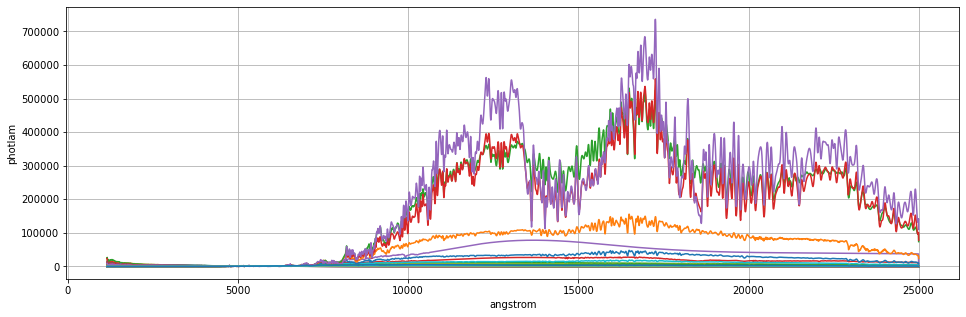

In [12]:
fig=plt.figure(figsize=(16,5))
for sed_ in sed_dict.keys():
    spec = sed_dict[sed_]
    spec.convert('photlam')
    plt.plot(spec.wave,spec.flux)
    plt.xlabel(spec.waveunits)
    plt.ylabel(spec.fluxunits)
    #plt.xlim((0,10000))
    plt.grid()


Let's organise spectra by spectral type 

In [13]:
spec_by_type = {}
for i in range(len(spectral_types)):
    spec_type = spectral_types[i]
    
    type_list_ = []
    spec_by_type[spec_type] = []
    for sed_ in type_dict.keys():
        if spec_type in type_dict[sed_]:
            type_list_.append(type_dict[sed_])
            spec_by_type[spec_type].append(sed_dict[sed_])
    print(spec_type, type_list_)
    print(len(type_list_))
    print('-----------')

O ['O5V', 'O9V', 'O8III']
3
-----------
B ['B0V', 'B1V', 'B3V', 'B57V', 'B8V', 'B9V', 'B2IV', 'B6IV', 'B12III', 'B3III', 'B5III', 'B9III', 'B2II', 'B5II', 'B0I', 'B1I', 'B3I', 'B5I', 'B8I']
19
-----------
A ['A0V', 'A2V', 'A3V', 'A5V', 'A7V', 'A0IV', 'A47IV', 'A0III', 'A3III', 'A5III', 'A7III', 'A0I', 'A2I']
13
-----------
F ['F0V', 'F2V', 'F5V', 'wF5V', 'F6V', 'rF6V', 'F8V', 'wF8V', 'rF8V', 'F02IV', 'F5IV', 'F8IV', 'F0III', 'F2III', 'F5III', 'F0II', 'F2II', 'F0I', 'F5I', 'F8I']
20
-----------
G ['G0V', 'wG0V', 'rG0V', 'G2V', 'G5V', 'wG5V', 'rG5V', 'G8V', 'G0IV', 'G2IV', 'G5IV', 'G8IV', 'G0III', 'G5III', 'wG5III', 'rG5III', 'G8III', 'wG8III', 'G5II', 'G0I', 'G2I', 'G5I', 'G8I']
23
-----------
K ['K0V', 'rK0V', 'K2V', 'K3V', 'K4V', 'K5V', 'K7V', 'K0IV', 'K1IV', 'K3IV', 'K0III', 'wK0III', 'rK0III', 'K1III', 'wK1III', 'rK1III', 'K2III', 'wK2III', 'rK2III', 'K3III', 'wK3III', 'rK3III', 'K4III', 'wK4III', 'rK4III', 'K5III', 'rK5III', 'K01II', 'K34II', 'K2I', 'K3I', 'K4I']
32
-----------
M [

Now we can plot them by spectral type separately 

In [14]:
type_colors = {'O':'b','B':'dodgerblue','A':'cyan','F':'g','G':'gold','K':'r','M':'brown'}

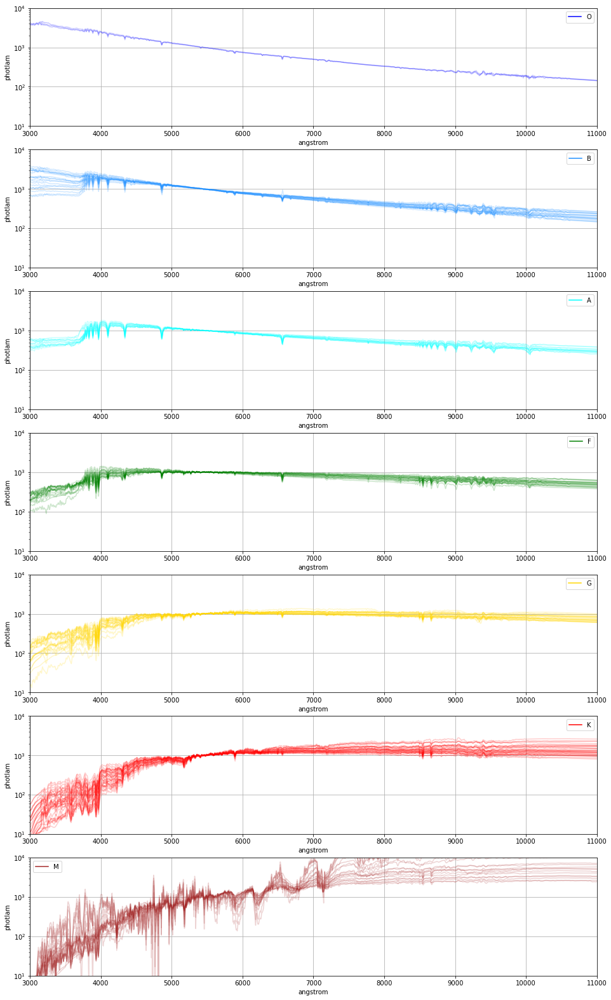

In [15]:
num_rows = len(spectral_types)
fig, axs = plt.subplots(num_rows, 1, figsize=(16,28))

for row,st in enumerate(spectral_types):
    for spec in spec_by_type[st]:
        axs[row].plot(spec.wave,spec.flux,color=type_colors[st],alpha=0.2)
    axs[row].plot([],[],label=st,color=type_colors[st])
    axs[row].grid()
    #axs[row].set_yscale("log")
    axs[row].set_xlabel(spec.waveunits)
    axs[row].set_ylabel(spec.fluxunits)
    axs[row].legend()
    axs[row].set_xlim(3000,11000)
    axs[row].set_ylim(10,10000)
    axs[row].set_yscale("log")
            

# Load LSST transmissions file 

In [16]:
datafilename = "data/lsst/old/transmissions-LSST.dat"
df=pd.read_csv(datafilename,names=['wl','Topt','Tccd','U','G','R','I','Z','Y4','atm'],sep='\t')

In [17]:
wl=df['wl'].values
U=df['U'].values/100.
G=df['G'].values/100.
R=df['R'].values/100.
I=df['I'].values/100.
Z=df['Z'].values/100.
Y4=df['Y4'].values/100.

lsst_bp = []
lsst_bp.append(S.ArrayBandpass(wl*10, U , name="u"))
lsst_bp.append(S.ArrayBandpass(wl*10, G , name="g"))
lsst_bp.append(S.ArrayBandpass(wl*10, R , name="r"))
lsst_bp.append(S.ArrayBandpass(wl*10, I , name="i"))
lsst_bp.append(S.ArrayBandpass(wl*10, Z , name="z"))
lsst_bp.append(S.ArrayBandpass(wl*10, Y4 , name="Y"))

In [18]:
filters = ['u','g','r','i','z','Y']
filter_names = {0:'u',1:'g',2:'r',3:'i',4:'z',5:'Y'}
filter_colors = {0:'b',1:'g',2:'r',3:'orange',4:'k',5:'grey'}

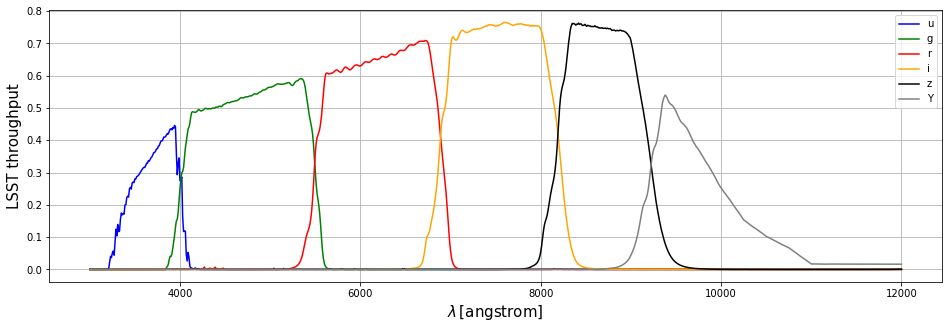

In [19]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

We find a leakage at higher wavelengths for some filters that impacts the colour values of the M type stars 

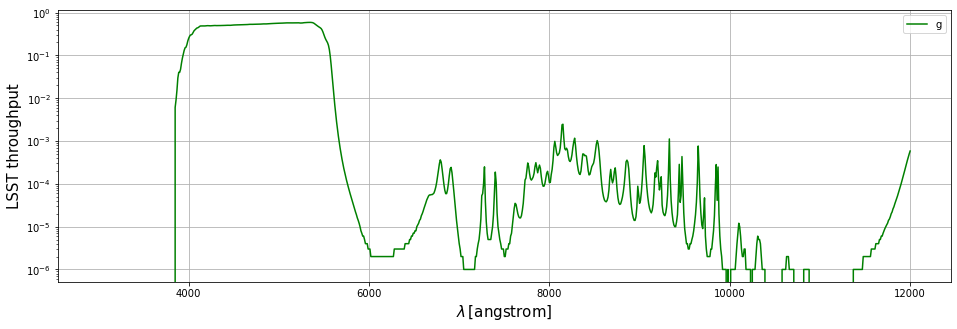

In [20]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
index=1
ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
ax.set_yscale("log")
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()

Let's try with a more updated version of the throughputs. We are given only the total passband and the atmosphere that was used to generate them (https://github.com/lsst/throughputs/tree/main/baseline), so in order to have the throughputs we need to divide the passbands by this atmosphere 

In [21]:
total_passband_path = 'data/lsst/'
total_passband_label = 'total_{0}.dat'
atm_lsst_file = 'atmos_std.dat'

In [22]:
atm_lsst = np.loadtxt(total_passband_path+atm_lsst_file)

Now, we write the passbands in pysynphot format: 

In [23]:
wl = atm_lsst[:,0]*10.

lsst_bp_ = []
for f in filters:
    passband_ = np.loadtxt(total_passband_path+total_passband_label.format(f.lower()))
    assert (atm_lsst.shape==passband_.shape)
    throughput_ = passband_[:,1]/atm_lsst[:,1]
    lsst_bp_.append(S.ArrayBandpass(wl, throughput_ , name=f))



/tmp/ipykernel_253427/740900064.py:7: RuntimeWarning: invalid value encountered in true_divide
  throughput_ = passband_[:,1]/atm_lsst[:,1]


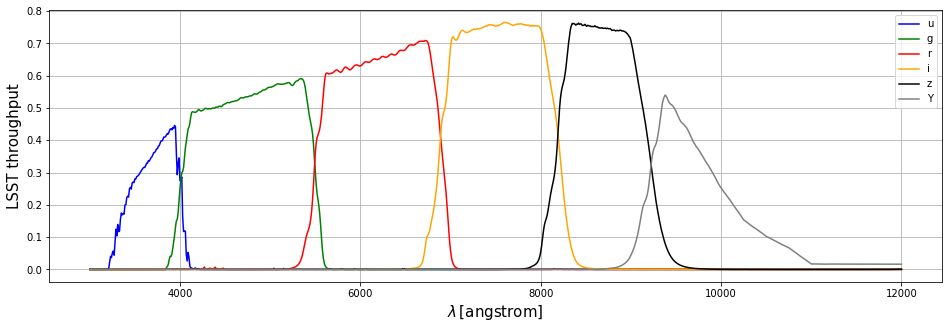

In [24]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp[index].wave,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()
plt.savefig(os.path.join(outdir_plots0,'LSST_throughputs.png'))

In [25]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [26]:
wl_lsst = lsst_bp[0].wave

# Compare with hardware.dat 

In [27]:
throughput_path = 'data/lsst/'
throughput_label = 'hardware_{0}.dat'

Write the throughputs in pysynphot format 

In [28]:
lsst_bp = []
for f in filters:
    throughput_ = np.loadtxt(throughput_path+throughput_label.format(f.lower()))
    assert (atm_lsst.shape==throughput_.shape)
    lsst_bp.append(S.ArrayBandpass(wl, throughput_[:,1] , name=f))


We compare with the results from dividing the total passbands by the atmosphere: 

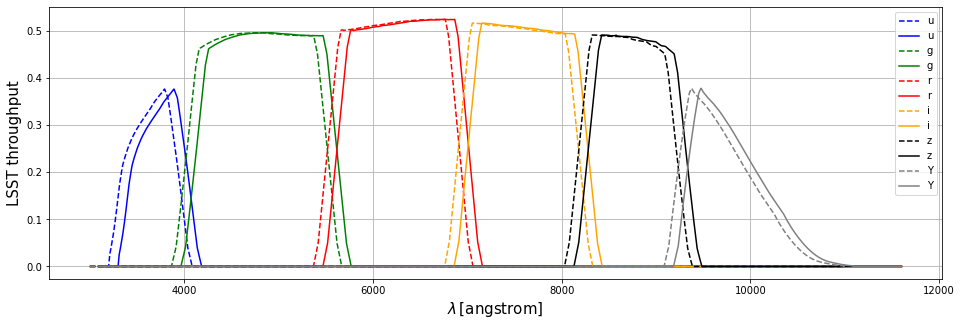

In [29]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for index in range(len(lsst_bp)):
    ax.plot(lsst_bp_[index].wave,lsst_bp_[index].throughput,label=filter_names[index],ls='--',color=filter_colors[index])
    ax.plot(lsst_bp[index].wave+100,lsst_bp[index].throughput,label=filter_names[index],color=filter_colors[index])
    
ax.grid()
plt.xlabel('$\\lambda \, [$'+str(lsst_bp[0].waveunits)+']',fontsize=15)
plt.ylabel('LSST throughput',fontsize=15)
plt.legend()
#plt.savefig(os.path.join(outdir_plots0,'LSST_throughputs.png'))

We confirm that they are the same, so we adopt the throughputs from the "hardware.dat" files 

In [30]:
for filter in lsst_bp:
    assert (filter.wave==lsst_bp[0].wave).all()

In [31]:
wl_lsst = lsst_bp[0].wave

# Load simulated transparencies 

Select variable parameter and specify airmass and clouds 

In [32]:
variable_param = 'aerosol'
am0 = 1.2
cloud0 = 0.0

Specify which distribution follows the simulated parameter. Options: 
* linear_distribution-discrete: generated following a linear function and with pre-established step (e.g., PWV = 1.0, 2.0, 3.0, ....) 
* linear_distribution-continuous: generated following a linear function and specifying only the value range and number of simulations (e.g., PWV = 1.0, 1.25, 1.5, ....) 
* uniform_distribution: generated following a uniform random distribution (work in progress) 
* specific_distribution: generated following random distributions specific to each parameter (work in progress) 


In [33]:
param_dist = 'linear_distribution-discrete'

In [34]:
outdir_plots = os.path.join('output_plots/',param_dist.replace('-','/'))
if os.path.exists(outdir_plots)==False:
    os.mkdir(outdir_plots)

In [35]:
if variable_param=='airmass' or variable_param=='cloud':
    t_file = 'simulated_transparencies_varying_{0}.fits'.format(variable_param)
    t_file_ref = 'simulated_transparencies_varying_{0}_ref.fits'.format(variable_param)
else:
    t_file = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}.fits'.format(variable_param,am0,cloud0)
    t_file_ref = 'simulated_transparencies_varying_{0}_airmass_{1}_cloud_{2}_ref.fits'.format(variable_param,am0,cloud0)

t_path = os.path.join('./simulated_transparencies/',param_dist.replace('-','/'))
t_in = os.path.join(t_path,t_file)
t_in_ref = os.path.join(t_path,t_file_ref)
t = fits.open(t_in)
t_ref = fits.open(t_in_ref)

In [36]:
head = t[0].header
data = t[0].data
print(data.shape)
data_ref = t_ref[0].data
print(data_ref.shape)

(10, 956)
(2, 956)


In [37]:
n_atmp = head['ID_RES']
n_sim = head['NTRANSP']
print(n_atmp, n_sim)

5 9


In [38]:
wl_t = data[0][n_atmp:]*10.

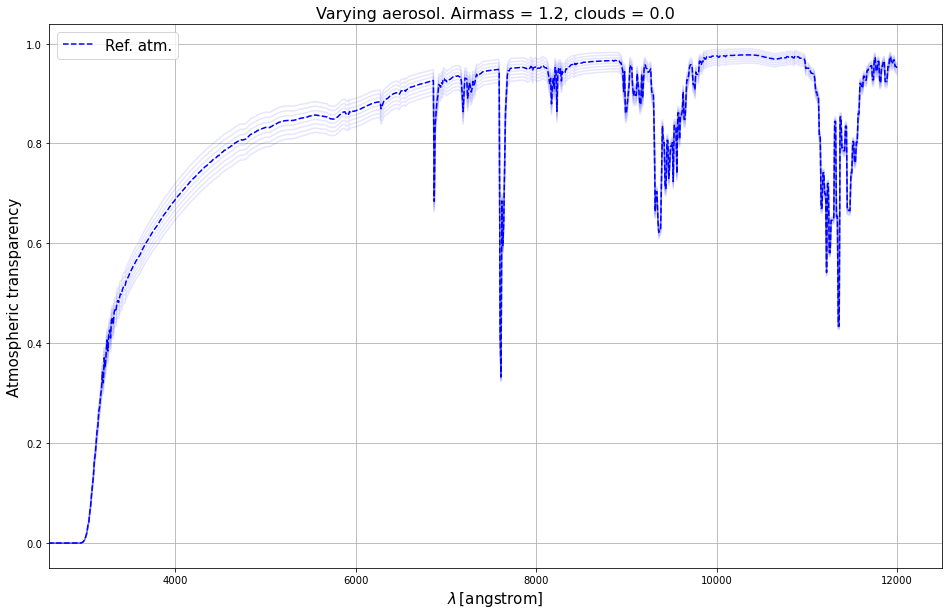

In [39]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for atm_i in range(1,n_sim):
    ax.plot(wl_t,data[atm_i][n_atmp:],color='b',alpha=0.1)
ax.plot(wl_t,data_ref[1][n_atmp:],ls='--',color='b',label='Ref. atm.')
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \,$'+'[angstrom]',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.legend(fontsize=15)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

# Check range of simulated atm values

In [40]:
print(head)

SIMPLE  =                    T / conforms to FITS standard                      BITPIX  =                  -64 / array data type                                NAXIS   =                    2 / number of array dimensions                     NAXIS1  =                  956                                                  NAXIS2  =                   10                                                  NTRANSP =                    9                                                  ID_AM   =                    4                                                  ID_VAOD =                    1                                                  ID_PWV  =                    0                                                  ID_O3   =                    2                                                  ID_CLD  =                    3                                                  ID_RES  =                    5                                                  END                                     

In [41]:
params_index = {'pwv':0,'aerosol':1,'ozone':2,'cloud':3,'airmass':4}

In [42]:
var_index = params_index[variable_param]

In [43]:
#data[1:,1]
data[1:,var_index]

array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09])

(array([0., 0., 0., 0., 0., 0., 9., 0., 0., 0., 0., 0.]),
 array([-0.5       , -0.41666667, -0.33333333, -0.25      , -0.16666667,
        -0.08333333,  0.        ,  0.08333333,  0.16666667,  0.25      ,
         0.33333333,  0.41666667,  0.5       ]),
 <a list of 12 Patch objects>)

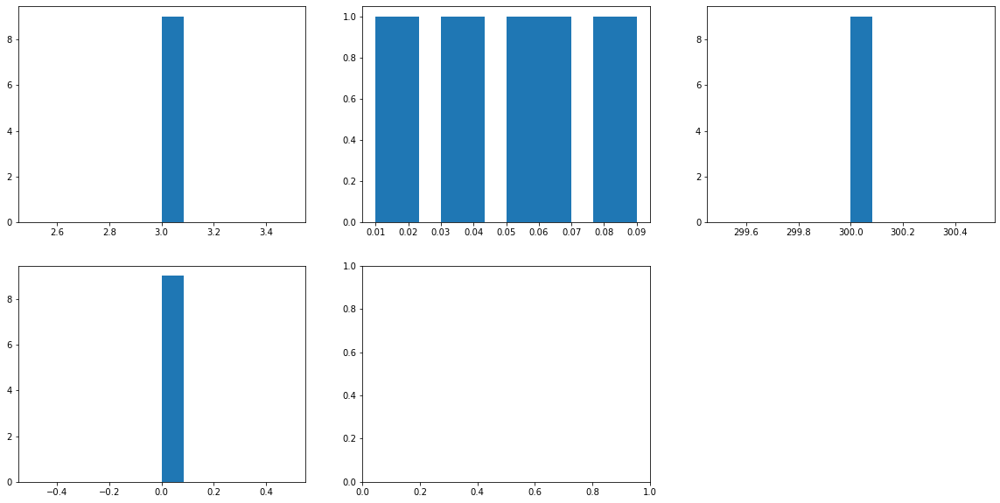

In [44]:
fig=plt.figure(figsize=(20,10))
ax1=fig.add_subplot(231)
ax2=fig.add_subplot(232)
ax3=fig.add_subplot(233)
ax4=fig.add_subplot(234)
ax5=fig.add_subplot(235)

ax1.hist(data[1:,0],bins=12)
ax2.hist(data[1:,1],bins=12)
ax3.hist(data[1:,2],bins=12)
ax4.hist(data[1:,3],bins=12)

# Select data for variable parameter of these simulations 

In [45]:
atm_vals = data[1:,var_index]

In [46]:
np.save('output_files/atm_vals_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),atm_vals)

# Convert simulated transparencies into pysynphot format 

In [47]:
atm_transp = []
for i in range(1,n_sim+1):
    finterp_i = interp1d(wl_t,data[i][n_atmp:],bounds_error=False,fill_value=0.)
    atm_interp_i = finterp_i(wl_lsst)
    #atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
    atm_i = S.ArrayBandpass(wl_lsst,atm_interp_i, name='Atm. transp. {0}'.format(i))
    atm_transp.append(atm_i)

In [48]:
finterp_ref = interp1d(wl_t,data_ref[1][n_atmp:],bounds_error=False,fill_value=0.)
atm_interp_ref = finterp_ref(wl_lsst)
#atm_i = S.ArrayBandpass(wl_t,data[i][n_atmp:], name='Atm. transp. {0}'.format(i))
atm_transp_ref = S.ArrayBandpass(wl_lsst,atm_interp_ref, name='Atm. transp. {0}'.format(i))

# Compute total bandpass (atmosphere(s) x LSST throughput) 

In [49]:
total_passband = {}
#for bpname in filters:
#    total_passband[bpname] = []

for index,bp in enumerate(lsst_bp):
    total_passband[filters[index]] = []
    for i in range(n_sim):
        total_pass = bp*atm_transp[i]
        total_passband[bp.name].append(total_pass)

In [50]:
total_passband_ref = {}
for index,bp in enumerate(lsst_bp):
    total_pass = bp*atm_transp_ref
    total_passband_ref[bp.name] = total_pass

In [51]:
print(len(total_passband['u']))
print(total_passband['u'][0])

9
(u * Atm. transp. 1)


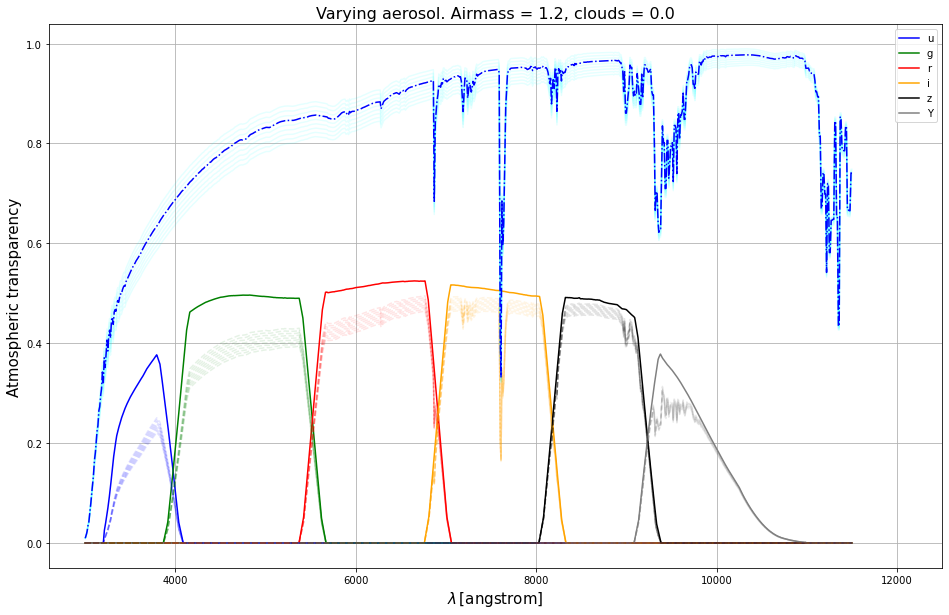

In [52]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
for index,bp in enumerate(lsst_bp):
    ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])

for isim in range(n_sim):
    ax.plot(atm_transp[isim].wave,atm_transp[isim].throughput,alpha=0.1,color='cyan')
    for index,bpname in enumerate(filters):
        ax.plot(total_passband[bpname][isim].wave,total_passband[bpname][isim].throughput,ls='--',color=filter_colors[index],alpha=0.1)
ax.plot(atm_transp_ref.wave,atm_transp_ref.throughput,ls='-.',color='b')        
plt.xlim(2600.,12500.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.legend()
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'total_passbands_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Plot the atmospheric transparencies corresponding to the minimum and maximum atmospheric parameter that we are varying: 

In [53]:
min_val_ = np.min(atm_vals)
max_val_ = np.max(atm_vals)
print(min_val_,max_val_)

0.01 0.09


In [54]:
min_ind_ = np.where(atm_vals==min_val_)[0][0]
max_ind_ = np.where(atm_vals==max_val_)[0][0]

In [55]:
min_transp = data[1+min_ind_,n_atmp:]
max_transp = data[1+max_ind_,n_atmp:]

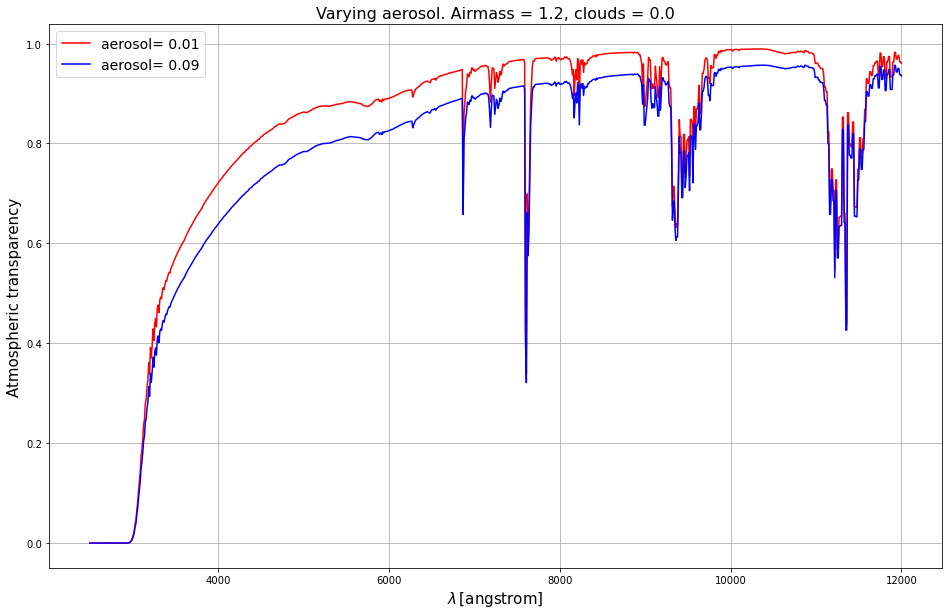

In [56]:
fig=plt.figure(figsize=(16,10))
plt.plot(wl_t,min_transp,color='r',label=variable_param+'= {0:.2f}'.format(min_val_))
plt.plot(wl_t,max_transp,color='b',label=variable_param+'= {0:.2f}'.format(max_val_))
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Atmospheric transparency',fontsize=15)
plt.grid()
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'atm_transparencies_varying_{0}_airmass_{1}_clouds_{2}_min_max_values.png'.format(variable_param,am0,cloud0)))

# Calculate fluxes through total passbands 

Let's start with one spectrum of a type A star as example 

In [57]:
# Example with one spectrum 
test_type = 'A'
test_spec = 0
example_spec = spec_by_type[test_type][test_spec]

In [58]:
# It seems this galaxy is a small enough place to end up choosing again, just by coincidence, Vega as example star 
vega = S.Vega
vega.convert('photlam')

photlam


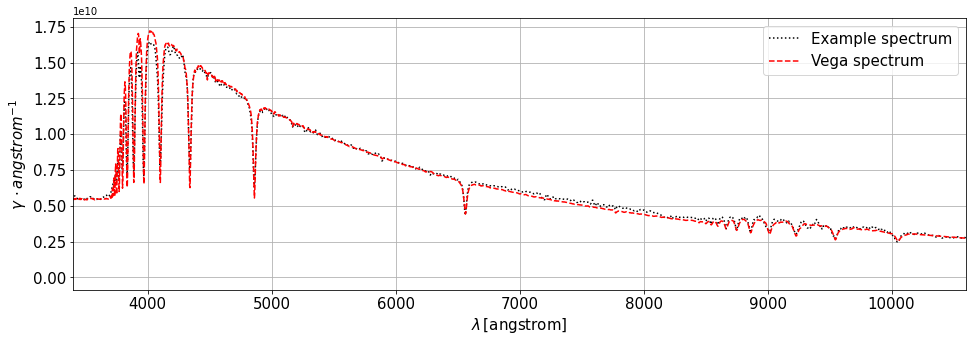

In [59]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0,label='Example spectrum')
plt.plot(vega.wave,vega.flux*Seff*exptime,ls='--',color='r',alpha=1.0,label='Vega spectrum')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(example_spec.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

Let's make the example spectrum pass through the atmosphere and through the total passband (atm. x throughput) 

In [60]:
obsatm_dict = {}
for isim in range(n_sim):
    obsatm_dict[isim] = []
    obsatm = S.Observation(example_spec,atm_transp[isim],force='taper')
    obsatm_dict[isim] = obsatm

obstotal_dict = {}
for filter in filters:
    obstotal_dict[filter] = []

#for filter in lsst_bp:
for filter in filters:
    #print(filter.name.upper())
    for i in range(n_sim):
        #total_pass = filter*atm_transp[i]
        #obs = S.Observation(spec,total_pass,force='taper')
        obstotal = S.Observation(example_spec,total_passband[filter][i],force='taper')
        obstotal_dict[filter].append(obstotal)

(Atm. transp. 1) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 2) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 3) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 4) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 5) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 6) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 7) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 8) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Atm. transp. 9) does not have a defined

u
g
r
i
z
Y
photlam


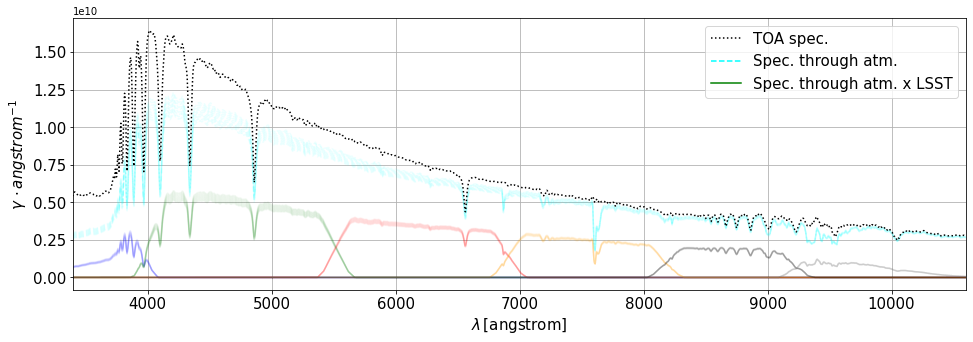

In [61]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
for isim in range(n_sim):
    obsatm = obsatm_dict[isim]
    ax.plot(obsatm.binwave,obsatm.binflux*Seff*exptime,ls='--',color='cyan',alpha=0.07)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls=':',color='k',alpha=1.0)
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls=':',color='k',label='TOA spec.')
plt.plot([],[],ls='--',color='cyan',label='Spec. through atm.')
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
print(spec.fluxunits)

This was an example of how the spectrum looks like when passing only through the atmosphere and through the total passbands. For our calibration purposes, what we actually want is to have the spectra passing through either only the troughput (as if the telescope was on space) and through the total passband (ground-based telescope). Now let's pass all spectra through the throughput and through the atmosphere 

In [62]:
# Spectra through atm x throughput 
obs_dict = {}
#for sed_ in list(sed_dict.keys()):
for st in spectral_types:
    print(st)
    obs_dict_ = {}
    for si,spec in enumerate(spec_by_type[st]):
        filter_dict_ = {}
        for filter in filters:
            filter_dict_[filter] = []
            for i in range(n_sim):
                obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
                filter_dict_[filter].append(obs_spec)
        obs_dict_[si] = filter_dict_ 
    obs_dict[st] = obs_dict_


O
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [63]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(obs_dict[test_type].keys()))
#print(len(obs_dict[example_spec].keys()))
print(len(obs_dict[test_type][test_spec].keys()))
print(len(obs_dict[test_type][test_spec]['u']))
print(n_sim)

131
7
13
6
9
9


In [64]:
# Spectra only through throughput (as if telescope was in space) 
obs_dict_t = {}
for st in spectral_types:
    print(st)
    obs_dict_t_ = {}
    for si,spec in enumerate(spec_by_type[test_type]):
        filter_dict_ = {}
        for filter in lsst_bp:
            obs_spec_t = S.Observation(spec,filter,force='taper')
            filter_dict_[filter.name] = obs_spec_t
        obs_dict_t_[si] = filter_dict_ 
    obs_dict_t[st] = obs_dict_t_
    

O
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset 

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in

In [65]:
print(len(sed_dict.keys()))
print(len(obs_dict_t.keys()))
print(len(obs_dict_t[test_type].keys()))
print(len(obs_dict_t[test_type][test_spec].keys()))

131
7
13
6


In [66]:
obs_dict_t[test_type][0]['u']

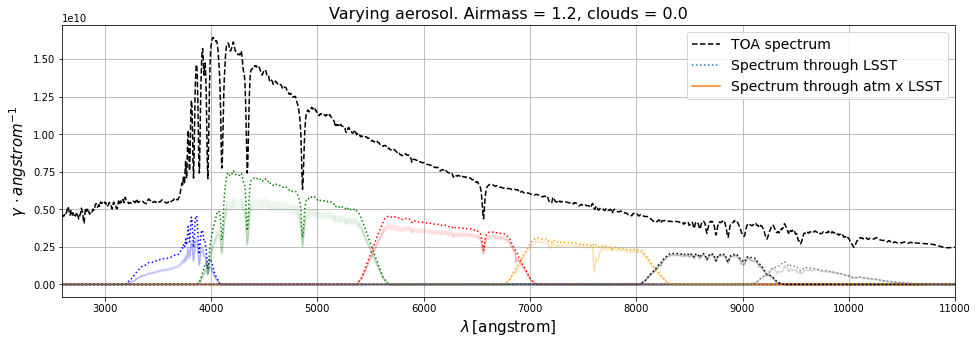

In [67]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
spec_by_type[test_type][test_spec].convert('photlam')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(obs_dict_t[test_type][test_spec][filter].wave,obs_dict_t[test_type][test_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = obs_dict[test_type][test_spec][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Check that S.Observation is doing what we want it to do 

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.


(3000.0, 5000.0)

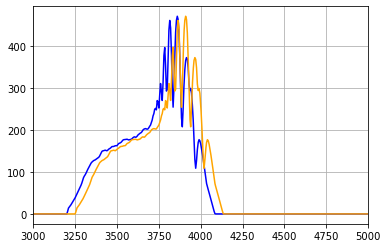

In [68]:
interp_pb_fun = interp1d(lsst_bp[0].wave,lsst_bp[0].throughput,bounds_error=False,fill_value=0.)
interp_pb_ = interp_pb_fun(example_spec.wave)

obs_1 = example_spec.flux*interp_pb_
obs_2 = S.Observation(example_spec,lsst_bp[0],force='taper')
plt.plot(example_spec.wave,obs_1,color='b')
plt.plot(obs_2.wave+50.,obs_2.flux,color='orange')
plt.grid()
plt.xlim(3000.,5000.)

# Calculate magnitudes with my own function 

Physical constants 

In [69]:
c_light = S.units.C #speed of light [Angstrom /s] 
print(c_light)
h_planck = S.units.H #Planck's constant [erg*s] 
print(h_planck)

2.99792458e+18
6.6262e-27


In [70]:
# Reference flux value for an AB source in erg / s / cm2 / Hz 
f_ref = 3.63*10**(-20)

In [71]:
# Pivot wavelength [cm] 
wl_piv = 5.4929*10**(-5)

In [72]:
C = f_ref/(h_planck*wl_piv*10**8.)
print(C)

997.3334660532323


Definition of functions 

In [73]:
# The SED of an AB source (that is, constant flux in frequency units) expressed in photons / s / cm^2 / Angstrom 
def ABnphot(wl):
    #return 997.2*5500./wl
    return C*wl_piv*10**8./wl

We check that this function actually creates a spectrum with the properties of an AB source, that is, a flat spectrum in fnu units (erg/s/cm2/Hz) 

Text(0, 0.5, 'Flux [Jy]')

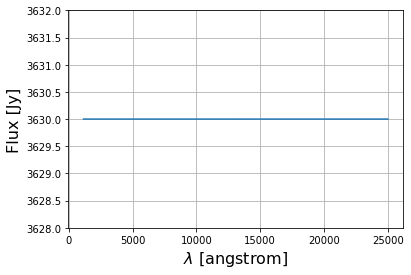

In [74]:
checkab = ABnphot(example_spec.wave)
checkab_ = S.ArraySpectrum(example_spec.wave, checkab, name='Flat AB spectrum')
#plt.plot(checkab_.wave,checkab_.flux)
checkab_.convert('fnu')
plt.plot(checkab_.wave,checkab_.flux*10**23.)
plt.ylim(3.628*10.**3,3.632*10**3.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel('Flux [Jy]',fontsize=16)

Now, we define our function to compute the AB magnitudes: 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu}^E(\lambda) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} \frac{A}{B} \, . $$ 
Now, we want to compute the error for the AB magnitudes. The denominator is constant for a given $S_{throughput}(\lambda)$, so we assume it does not contribute to the error. Then, we can approximate $A$ as 
$$A \approx \sum_i F_{\nu}^E(\lambda_i) \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda_i) \frac{\Delta \lambda_i}{h \lambda_i} = \sum_i n_i \cdot S_{passband}(\lambda_i) \, , $$ 
where $n_i$ is the number of photo-electrons received within a given bin of wavelength, $\Delta \lambda_i$. Then, we can assume that $n_i$ is a Poisson random variable, so 
$$\sigma^2_{n_i} = n_i . $$ 
Taking this into account, we can write the error of $A$ as 
$$\sigma^2_A = \sum_i \left( \frac{\partial A}{\partial n_i} \right)^2 \sigma^2_{n_i} = \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, , $$ 
therefore, 
$$\sigma_A = \sqrt{n_i} \, . $$
Finally, the error on $m_{AB}$ is given by 
$$\sigma^2_{m_{AB}} = \left( \frac{\partial m_{AB}}{\partial A} \right)^2 \sigma^2_A = \left( \frac{-2.5}{A \log 10} \right)^2 \cdot \sum_i n_i \cdot S_{passband}^2(\lambda_i) \, . $$ 


In [215]:
def myAB(spec,passband,filter,return_error=False):
    f_units = str(spec.fluxunits)
    if f_units!='fnu':
        print('ATTENTION: converting flux units to fnu')
        spec.convert('fnu')
        
    observation = S.Observation(spec,passband,force='taper')
    print('Observation units = ', observation.fluxunits)
    nan_mask = np.isnan(observation.flux)
    
    obs_wave_ = observation.wave[~nan_mask]
    obs_flux_ = observation.flux[~nan_mask]
    wave_min = np.min(observation.wave[~nan_mask])
    wave_max = np.max(observation.wave[~nan_mask])

    num = np.trapz(obs_flux_/obs_wave_,x=obs_wave_)*Seff*exptime/h_planck
    #obmag = -2.5*np.log10(num)
    
    if return_error:
        finterp_pb = interp1d(passband.wave,passband.throughput,bounds_error=False,fill_value=0.)
        pb_interp = finterp_pb(spec.wave)
        
        delta_lambda = list(np.diff(spec.wave))
        delta_lambda.append(spec.wave[-1]-spec.wave[-2])
        delta_lambda = np.array(delta_lambda)
        assert len(delta_lambda)==len(spec.wave)
        
        assert str(spec.fluxunits)=='fnu'
        n_i = spec.flux*delta_lambda*Seff*exptime/(spec.wave*h_planck)
        #print(len(n_i),len(pb_interp))
        print('n_i = ', n_i)
        print('Number of collected photoelectrons = {0:.2e}'.format(np.sum(n_i*pb_interp)))
        err2_num = np.sum(n_i*np.array(pb_interp)**2.)
    
    spec.convert(f_units)
    
    print('Numerator = {0:.2e}'.format(num))
    if return_error:
        print('Variance of the numerator = {0:.2e}'.format(err2_num))
    
    #flatsp = S.FlatSpectrum(f_ref,fluxunits='fnu')
    #flatsp_vals = np.ones(len(spec.wave))*f_ref
    #flatsp = S.ArraySpectrum(spec.wave,flatsp_vals)
    
    flatsp_nphot = ABnphot(spec.wave)
    flatsp_ = S.ArraySpectrum(spec.wave, flatsp_nphot, name='Flat AB spectrum')
    
    flatsp_.convert('fnu')
    ab_obs = S.Observation(flatsp_,filter,force='taper')
    print('AB observation units = ', ab_obs.fluxunits)
    
    ab_wave_ = ab_obs.wave[~nan_mask]
    ab_flux_ = ab_obs.flux[~nan_mask]
    
    den = np.trapz(ab_flux_/ab_wave_,x=ab_wave_)*Seff*exptime/h_planck
    
    print('Denominator = {0:.2e}'.format(den))
    #print(num/den)
    #print(obmag)
    mab = -2.5*np.log10(num/den)
    print('AB magnitude = ', mab)
    print('---------')
    
    if return_error:
        err2_mab = (2.5**2./np.log(10.)**2.)*err2_num/num**2.
        err_mab = np.sqrt(err2_mab)
        
        return mab,err_mab
    else:
        return mab

In [76]:
# This function gives the flux of an AB source in photons / s / cm^2 / Angstrom 
flatsp_nphot = ABnphot(example_spec.wave)

In [77]:
#Let's write this in pysynphot format (note that the result will be in photlam units, then we use ABnphot as input)
flatsp = S.ArraySpectrum(example_spec.wave, flatsp_nphot, name='Flat AB spectrum')

In [78]:
flatsp.fluxunits

photlam


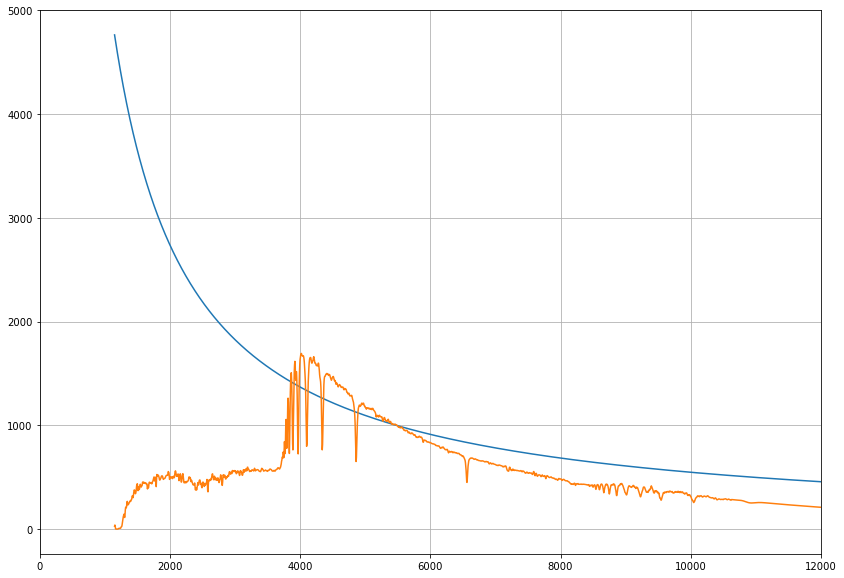

In [79]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)
plt.xlim(0.,12000.)
plt.grid()

Here we verify that creating a pysynphot AB flat spectrum and transforming it to photlam gives the same as directly creating the same spectrum in photlam units with ABnphot 

In [80]:
flatsp0 = S.FlatSpectrum(f_ref,fluxunits='fnu')
flatsp0.fluxunits

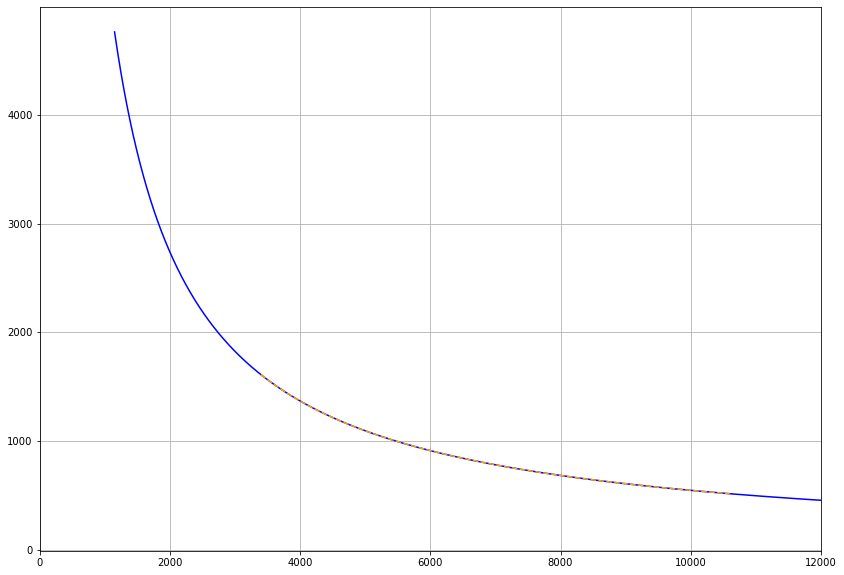

In [81]:
flatsp0.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux,color='b')
plt.plot(flatsp0.wave,flatsp0.flux,ls='--',color='orange')
plt.xlim(0.,12000.)
plt.grid()

To further check it, let's transform it to flam and compare with the analytical expression: 

$$F_{\lambda} = F_{\nu} \frac{c}{\lambda^2}$$

In [82]:
flambda = f_ref*c_light/flatsp.wave**2.

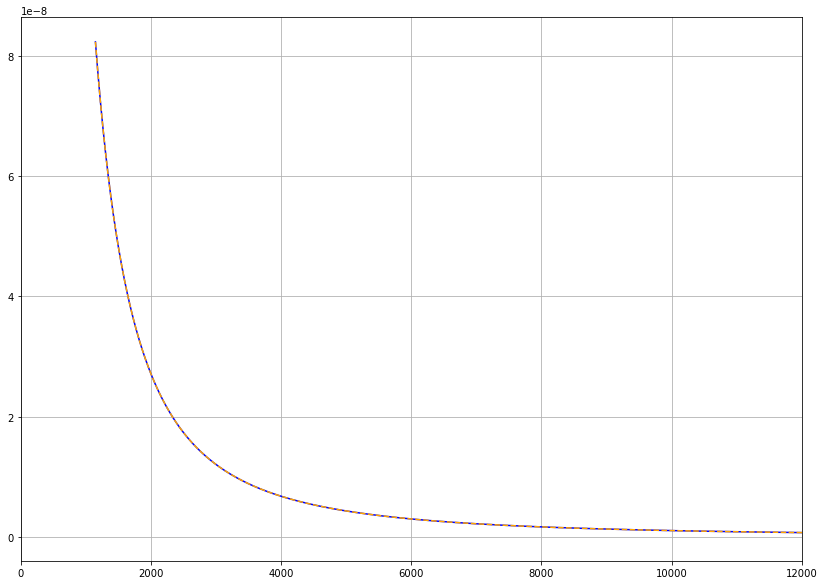

In [83]:
flatsp.convert('flam')
flatsp.waveunits
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux,color='b')
plt.plot(flatsp.wave,flambda,color='orange',ls='--')
plt.xlim(0.,12000.)
plt.grid()
flatsp.convert('photlam')

Now we check that the AB magnitudes are zero for the flat AB spectrum (they have to be through any filter, by definition) 

In [84]:
for filter in lsst_bp:
    myAB(flatsp,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+12
(r) does not have a defined binset in the w

We check the same for the total passband. Note that, given the definition of AB magnitudes that we have implemented, the denominator only considers the throughput of the telescope, even when the spectra pass through the total passband, since the "reference" we want to compare to is when there is no effect of the atmosphere, but in any case the light passes through the telescope, so we consider the telescope's throughput to be the reference (i.e. as if it had a transmission = 1) with respect to which the flux is attenuated. Therefore, the following AB magnitudes of a flat AB spectrum should be different from (greater than) zero  

In [85]:
for fi,filter in enumerate(filters):
    myAB(flatsp,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20744411491687778
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obs

Make the flat spectrum pass through the throughputs and total passbands 

In [86]:
flat_dict_t = {}
for fi,filter in enumerate(filters):
    flat_spec_t_ = S.Observation(flatsp,lsst_bp[fi],force='taper')
    flat_dict_t[filter] = flat_spec_t_

flat_dict = {}
for fi,filter in enumerate(filters):
    flat_dict[filter] = []
    for i in range(n_sim):
        flat_spec_ = S.Observation(flatsp,total_passband[filter][i],force='taper')
        flat_dict[filter].append(flat_spec_)

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum wi

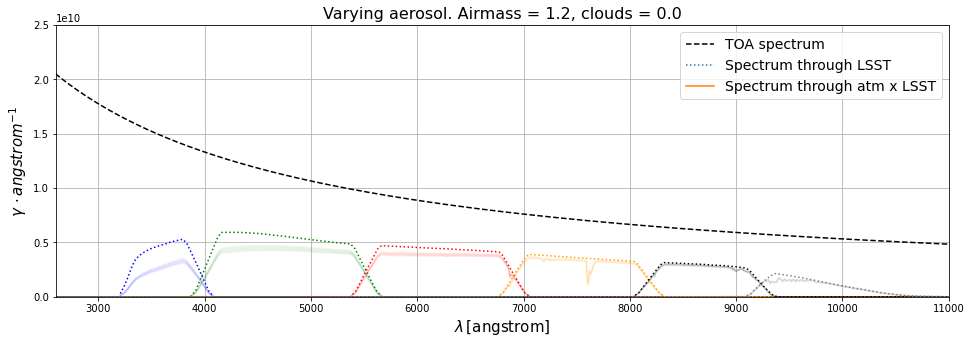

In [87]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
#sed_dict[example_spec].convert('photlam')
if str(flatsp.fluxunits)!='photlam':
    flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(flat_dict_t[filter].wave,flat_dict_t[filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = flat_dict[filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)

plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.ylim(0.,2.5e10)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
plt.savefig(os.path.join(outdir_plots,'flat_spectrum_toa_throughput_total_passband_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

Now we check that the error is equal to $n_i$ in the case of a flat unitary filter, that is, when $S_{passband}(\lambda) = S_{throughput}(\lambda) = 1 \, \forall \lambda$, so 
$$\sigma_A^2 = \sum_i \sigma_i^2 \, .$$ 

770 970


Text(0, 0.5, '$S(\\lambda)$')

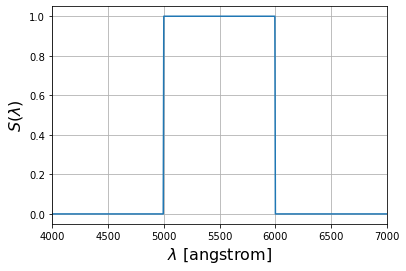

In [216]:
flat_filter_ = np.zeros(len(example_spec.wave))
wmin_index = np.where(example_spec.wave>=5000.)[0][0]
wmax_index = np.where(example_spec.wave<=6000.)[0][-1]
print(wmin_index,wmax_index)
flat_filter_[wmin_index:wmax_index] = 1.0
flat_filter = S.ArrayBandpass(example_spec.wave,flat_filter_)
plt.plot(flat_filter.wave,flat_filter.throughput)
plt.xlim(4000.,7000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$S(\lambda)$',fontsize=16)

photlam
photlam


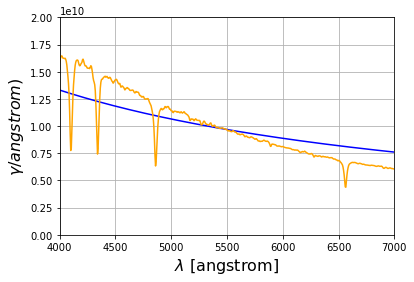

In [217]:
f_units_ = str(example_spec.fluxunits)
print(f_units_)
example_spec.convert('photlam')
flatsp.convert('photlam')
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,color='b')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,color='orange')
plt.xlim(4000.,7000.)
plt.ylim(0.,2e10)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$)',fontsize=16)
example_spec.convert(f_units_)
print(example_spec.fluxunits)

In [218]:
myAB(example_spec,flat_filter,flat_filter,return_error=True)

ATTENTION: converting flux units to fnu
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 9.69e+12
Numerator = 9.69e+12
Variance of the numerator = 9.69e+12
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  0.0028401999586074277
---------


(0.0028401999586074277, 3.488265780768848e-07)

We confirm that the value of the number of collected photoelectrons, $n_i$, is equal to its variance, $\sigma^2_{n_i}$. 

Check with a $m_{AB}=25$ source 

Text(0, 0.5, '$m_{AB}(\\lambda)$')

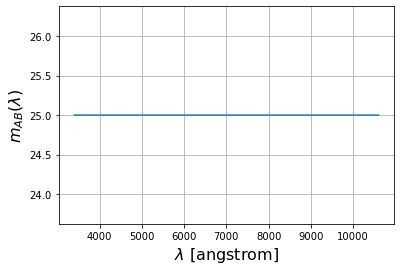

In [219]:
mb = 25
mab25spec = S.FlatSpectrum(mb,fluxunits='abmag')
plt.plot(mab25spec.wave,mab25spec.flux)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$m_{AB}(\lambda)$',fontsize=16)

[1.61159734e-07 1.61112348e-07 1.61064990e-07 ... 5.17073791e-08
 5.17025002e-08 5.16976221e-08]


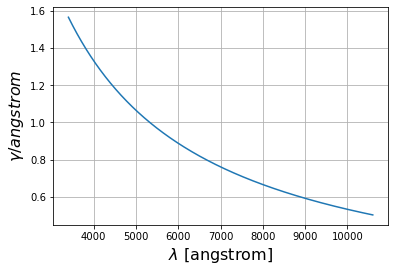

In [220]:
mab25spec.convert('photlam')
plt.plot(mab25spec.wave,mab25spec.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)
print(mab25spec.flux)
mab25spec.convert('abmag')

[3.63078055e-30 3.63078055e-30 3.63078055e-30 ... 3.63078055e-30
 3.63078055e-30 3.63078055e-30]


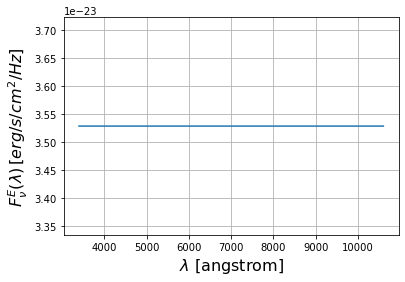

In [221]:
mab25spec.convert('fnu')
plt.plot(mab25spec.wave,mab25spec.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^E_{\nu}(\lambda) \, [erg/s/cm^2/Hz]$',fontsize=16)
print(mab25spec.flux)

In [222]:
mean25 = np.mean(mab25spec.flux)
flat25_ = np.ones(len(flatsp.wave))*mean25
flat25 = S.ArraySpectrum(flatsp.wave,flat25_,fluxunits='fnu')

fnu


Text(0, 0.5, '$F^E_{\\nu}(\\lambda) \\, [erg/s/cm^2/Hz]$')

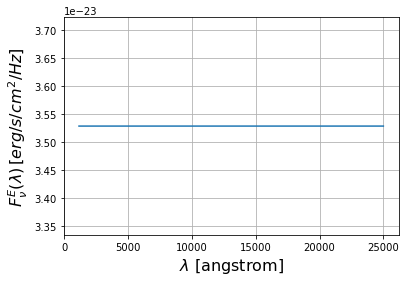

In [223]:
print(flat25.fluxunits)
plt.plot(flat25.wave,flat25.flux*Seff*exptime)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^E_{\nu}(\lambda) \, [erg/s/cm^2/Hz]$',fontsize=16)

We evaluate the ratio between the $m_{AB} = 25$ flat spectrum, $F^{E,m_{AB}=25}_{\nu}(\lambda)$, and the reference $m_{AB} = 0$ flat spectrum, $F^{E,m_{AB}=0}_{\nu}(\lambda)$. This should be: 
$$m_{AB} = 25 = -2.5 \log_{10} \left( \frac{F^{E,m_{AB}=25}_{\nu}(\lambda)}{F^{E,m_{AB}=0}_{\nu}(\lambda)} \right) \implies \frac{F^{E,m_{AB}=25}_{\nu}(\lambda)}{F^{E,m_{AB}=0}_{\nu}(\lambda)} = 10^{-10} \, . $$ 

Note that this is also true given our definition of AB magnitude, since 
$$m_{AB} = -2.5 \log_{10} \frac{\int F_{\nu, AB}^E \cdot 10^{-10} \cdot S_{eff} \cdot t_{exp} \cdot S_{passband}(\lambda) \frac{d\lambda}{h \lambda}}{\int F_{\nu, AB}^E \cdot S_{eff} \cdot t_{exp} \cdot S_{throughput}(\lambda) \frac{d\lambda}{h \lambda}} = -2.5 \log_{10} 10^{-10} = 25 \, .$$ 

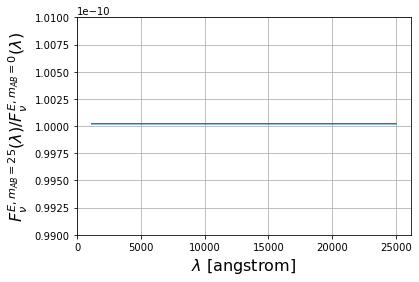

In [231]:
flat_units = str(flatsp.fluxunits)
flatsp.convert('fnu')
flat25.convert('fnu')
plt.plot(flat25.wave,flat25.flux/flatsp.flux)
plt.grid()
plt.ylim(0.99e-10,1.01e-10)
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$F^{E,m_{AB}=25}_{\nu}(\lambda) / F^{E,m_{AB}=0}_{\nu}(\lambda)$',fontsize=16)
flatsp.convert(flat_units)

In [227]:
myAB(flat25,flat_filter,flat_filter,return_error=True)

(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [23.15765718 23.05740885 22.95802235 ...  1.0656785   1.06546531
  1.06525221]
Number of collected photoelectrons = 9.72e+02
Numerator = 9.72e+02
Variance of the numerator = 9.72e+02
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  24.999766562931462
---------


(24.999766562931462, 0.03483331765369222)

In [228]:
print(flatsp.fluxunits, flat25.fluxunits)

photlam fnu


Since the AB mag = 25 spectrum is flat, it should have the same magnitude for any filter, given our definition of $m_{AB}$ as established above, the same way as the reference AB flat spectrum (3631.1 Jy or mag = 0) 

In [98]:
for filter in lsst_bp:
    myAB(flat25,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.09e+02
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  24.99976656278364
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.22e+02
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  24.999766564158396
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.16e+02
(r) does not hav

Check with a fainter star 

photlam
photlam


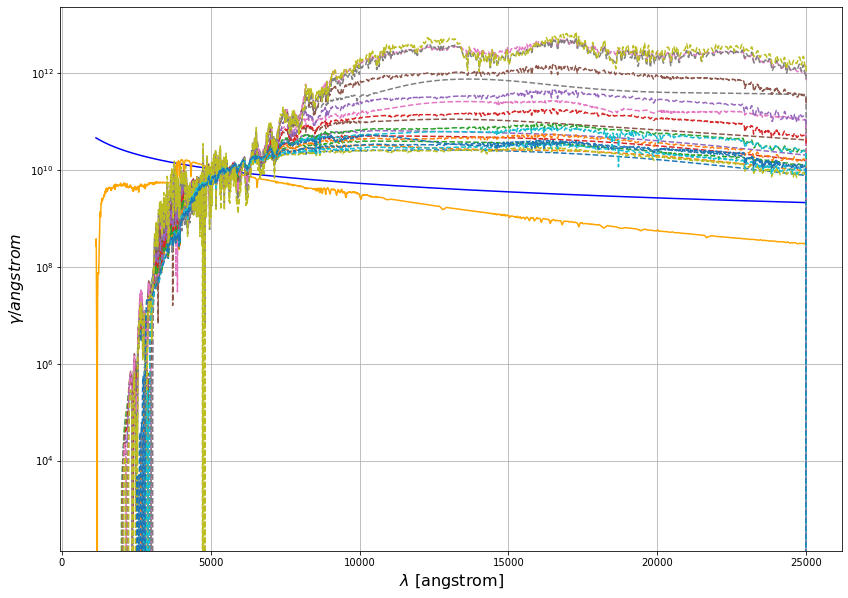

In [99]:
test_type2 = 'M'
f_units_ = str(example_spec.fluxunits)
print(f_units_)
example_spec.convert('photlam')
flatsp.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux*Seff*exptime,color='b')
plt.plot(example_spec.wave,example_spec.flux*Seff*exptime,color='orange')
for spec_ in spec_by_type[test_type2]:
    spec_.convert('photlam')
    plt.plot(spec_.wave,spec_.flux*Seff*exptime,ls='--')
plt.grid()
plt.yscale("log")
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)
example_spec.convert(f_units_)
print(example_spec.fluxunits)


In [100]:
example_spec2 = spec_by_type[test_type2][0]

In [101]:
myAB(example_spec2,flat_filter,flat_filter,return_error=True)

ATTENTION: converting flux units to fnu
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 9.67e+12
Numerator = 9.67e+12
Variance of the numerator = 9.67e+12
(UnnamedArrayBandpass) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 9.71e+12
AB magnitude =  0.004915114156117043
---------


(0.004915114156117043, 3.491600528108183e-07)

Now, let's see the AB magnitudes of the example spectrum with myAB function. To better understand it, we can compare the AB spectrum and the example spectrum (Vega) flux amplitudes in each range of wavelengths (see plot below) 

photlam


Text(0, 0.5, '$\\gamma / angstrom$')

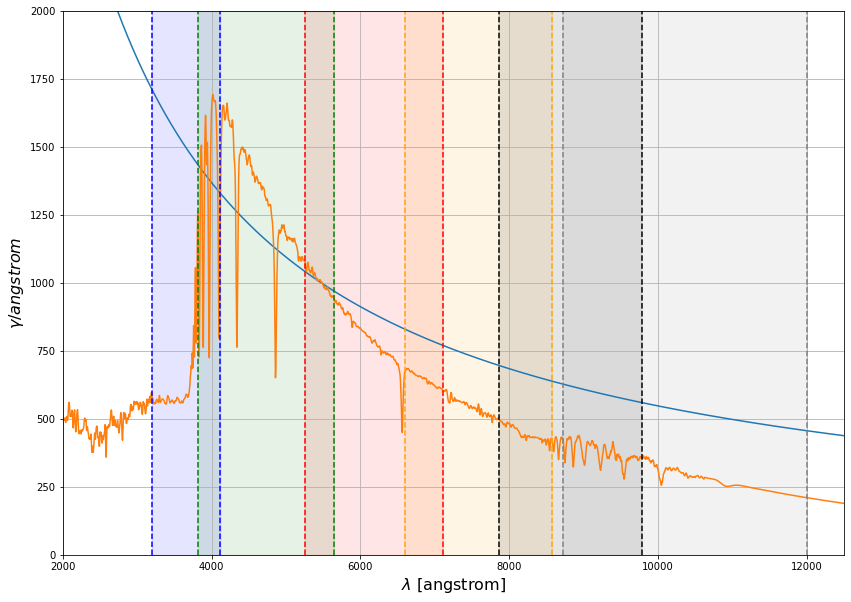

In [102]:
print(flatsp.fluxunits)
flatsp.convert('photlam')
example_spec.convert('photlam')
plt.figure(figsize=(14,10))
plt.plot(flatsp.wave,flatsp.flux)
plt.plot(example_spec.wave,example_spec.flux)

# Approximate integration limits of each total passband. Note that there is some overlap 
plt.axvline(x=3200,ls='--',color=filter_colors[0])
plt.axvline(x=4120,ls='--',color=filter_colors[0])
plt.fill_between(np.arange(3200,4120),np.ones(len(np.arange(3200,4120)))*2000.,color=filter_colors[0],alpha=0.1)

plt.axvline(x=3820,ls='--',color=filter_colors[1])
plt.axvline(x=5650,ls='--',color=filter_colors[1])
plt.fill_between(np.arange(3820,5650),np.ones(len(np.arange(3820,5650)))*2000.,color=filter_colors[1],alpha=0.1)

plt.axvline(x=5250,ls='--',color=filter_colors[2])
plt.axvline(x=7110,ls='--',color=filter_colors[2])
plt.fill_between(np.arange(5250,7110),np.ones(len(np.arange(5250,7110)))*2000.,color=filter_colors[2],alpha=0.1)

plt.axvline(x=6600,ls='--',color=filter_colors[3])
plt.axvline(x=8580,ls='--',color=filter_colors[3])
plt.fill_between(np.arange(6600,8580),np.ones(len(np.arange(6600,8580)))*2000.,color=filter_colors[3],alpha=0.1)

plt.axvline(x=7860,ls='--',color=filter_colors[4])
plt.axvline(x=9780,ls='--',color=filter_colors[4])
plt.fill_between(np.arange(7860,9780),np.ones(len(np.arange(7860,9780)))*2000.,color=filter_colors[4],alpha=0.1)

plt.axvline(x=8720,ls='--',color=filter_colors[5])
plt.axvline(x=12000,ls='--',color=filter_colors[5])
plt.fill_between(np.arange(8720,12000),np.ones(len(np.arange(8720,12000)))*2000.,color=filter_colors[5],alpha=0.1)

plt.xlim(2000.,12500.)
plt.ylim(0.,2000.)
plt.grid()
plt.xlabel(r'$\lambda$ [angstrom]',fontsize=16)
plt.ylabel(r'$\gamma / angstrom$',fontsize=16)

In [103]:
for filter in lsst_bp:
    myAB(example_spec,filter,filter)

ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.59e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7222408197036627
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.09224087927554477
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not 

In [104]:
for fi,filter in enumerate(filters):
    myAB(example_spec,total_passband[filter][0],lsst_bp[fi])

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.01e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.2175744456051412
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.38e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1171906588860904
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

# Calculate magnitudes and colours

We compute the magnitudes for the spectra of each spectral type for each atmosphere 

In [105]:
calc_mag_err = True

In [106]:
# Magnitudes of spectra passing through atm x throughput 
mag_dict = {}
mag_dict_ref = {}
mag_err_dict = {}
mag_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    mag_dict_st = {}
    mag_dict_ref_st = {}
    mag_err_dict_st = {}
    mag_err_dict_ref_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        mag_dict_ = {}
        mag_dict_ref_ = {}
        mag_err_dict_ = {}
        mag_err_dict_ref_ = {}
        for fi,filter in enumerate(filters):
            mag_dict_[filter] = []
            mag_err_dict_[filter] = []
            for i in range(n_sim):
                #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
                if calc_mag_err:
                    mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                    mag_err_dict_[filter].append(mag_ab_err_)
                else:
                    mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
                mag_dict_[filter].append(mag_ab_)
                
            #mag_dict[sed_] = mag_dict_
            
            if calc_mag_err:
                mag_ab_, mag_ab_err_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
                mag_err_dict_ref_[filter] = mag_ab_err_
            else:
                mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
            mag_dict_ref_[filter] = mag_ab_
        mag_dict_st[si] = mag_dict_
        mag_dict_ref_st[si] = mag_dict_ref_
        mag_err_dict_st[si] = mag_err_dict_
        mag_err_dict_ref_st[si] = mag_err_dict_ref_
    mag_dict[st] = mag_dict_st
    mag_dict_ref[st] = mag_dict_ref_st
    mag_err_dict[st] = mag_err_dict_st
    mag_err_dict_ref[st] = mag_err_dict_ref_st
        

O
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.85e+12
Numerator = 3.85e+12
Variance of the numerator = 6.98e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.23843688103099198
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.78e+12
Numerator = 3.78e+12
Variance of the numerator = 6.75

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.57e+12
Numerator = 8.57e+12
Variance of the numerator = 3.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.04532626786880219
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 2.99e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03121509276

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.28e+12
Numerator = 4.28e+12
Variance of the numerator = 1.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3961330756933751
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.36e+12
Numerator = 2.36e+12
Variance of the numerator = 1.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.71310984862241

Number of collected photoelectrons = 1.24e+12
Numerator = 1.24e+12
Variance of the numerator = 5.19e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9909827655575886
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+12
Numerator = 1.23e+12
Variance of the numerator = 5.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9972155690531161
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined bins

n_i =  [8.56187536e+10 9.62690626e+10 8.17275308e+10 ... 6.73615193e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.24e+11
Numerator = 5.23e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2449914766798447
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 6.46e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.1517463046307

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.52e+12
Numerator = 8.52e+12
Variance of the numerator = 3.10e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03839526394080968
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.41e+12
Numerator = 8.41e+12
Variance of the numerator = 3.03e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.02429195130

Numerator = 4.01e+12
Variance of the numerator = 1.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.466396295148898
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.20e+12
Numerator = 4.20e+12
Variance of the numerator = 1.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4164708614673373
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spe

Denominator = 3.08e+12
AB magnitude =  0.9996829659419948
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.09e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0059215844621119
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.94e+11
Numerator = 4.94e+11
Variance of the numerator = 1.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.3074498943353563
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.21408643e+12 1.27218829e+12 1.02682255e+12 ... 7.22920318e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.07e+11
Numerator = 5.07e+11
Variance of the numerator = 1.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.28058423638455

Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 3.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.0307402044517946
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 8.35e+12
Numerator = 8.35e+12
Variance of the numerator = 3.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.016620252381815054
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined 

Denominator = 6.16e+12
AB magnitude =  0.43786880555881397
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38793214447010554
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectron

Numerator = 1.23e+12
Variance of the numerator = 5.14e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0006929740552872
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 1.22e+12
Numerator = 1.22e+12
Variance of the numerator = 5.08e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  1.0069259298518098
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.09e+11
Numerator = 5.09e+11
Variance of the numerator = 1.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2758714365953288
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.95761516e+11 3.25802585e+11 2.76047961e+11 ... 1.32902890e+08
 1.15523825e+08 1.64851385e+07]
Number of collected photoelectrons = 5.22e+11
Numerator = 5.22e+11
Variance of the numerator = 1.15e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.24899331144439

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.49e+12
Numerator = 8.49e+12
Variance of the numerator = 3.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.03540786295678008
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.38e+12
Numerator = 8.38e+12
Variance of the numerator = 3.01e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.02128229764

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.11e+12
Numerator = 4.11e+12
Variance of the numerator = 1.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.4398689141805051
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.30e+12
Numerator = 4.30e+12
Variance of the numerator = 1.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.38993647544017

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 5.48e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.9322097044119316
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.30e+12
Numerator = 1.30e+12
Variance of the numerator = 5.41e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.93844347491238

n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.42e+11
Numerator = 5.42e+11
Variance of the numerator = 1.17e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.2066792955922363
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17282382e+12 1.30280728e+12 1.12272347e+12 ... 8.71848864e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.56e+11
Numerator = 5.56e+11
Variance of the numerator = 1.23e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.17976902654372

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 8.14e+12
Numerator = 8.14e+12
Variance of the numerator = 3.01e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.01036263004426214
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 8.04e+12
Numerator = 8.04e+12
Variance of the numerator = 2.93e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0244333668058

Number of collected photoelectrons = 4.31e+12
Numerator = 4.31e+12
Variance of the numerator = 1.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3876866380251776
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 4.27e+12
Numerator = 4.27e+12
Variance of the numerator = 1.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3977084434486724
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined bins

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.31e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8002520106898054
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 6.24e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.80648318698773

n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 6.08e+11
Numerator = 6.08e+11
Variance of the numerator = 1.33e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0830502559221271
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.13428930e+12 1.10798544e+12 8.05640036e+11 ... 4.47945659e+08
 3.91388939e+08 5.58993056e+07]
Number of collected photoelectrons = 6.05e+11
Numerator = 6.05e+11
Variance of the numerator = 1.31e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.08855308214831

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.22e+12
Numerator = 8.22e+12
Variance of the numerator = 3.12e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0005198636331957261
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.11e+12
Numerator = 8.11e+12
Variance of the numerator = 3.04e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.01456706279

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.42e+12
Numerator = 4.42e+12
Variance of the numerator = 1.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3593735047983534
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.83e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.36931545220098

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.70e+12
Numerator = 2.70e+12
Variance of the numerator = 1.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5687437628665803
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.58e+12
Numerator = 1.58e+12
Variance of the numerator = 6.75e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.72461803575325

n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.66e+11
Numerator = 6.66e+11
Variance of the numerator = 1.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.984356069780195
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.02230461e+11 5.11682928e+11 3.99120071e+11 ... 8.72398758e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.62e+11
Numerator = 6.62e+11
Variance of the numerator = 1.45e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.989420924121751

Denominator = 3.09e+12
AB magnitude =  0.7691979624093005
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 1.50e+12
Numerator = 1.50e+12
Variance of the numerator = 2.42e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7865529821603988
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons 

Number of collected photoelectrons = 4.63e+12
Numerator = 4.63e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.31020032611017156
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 4.59e+12
Numerator = 4.59e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3200398684798039
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined bin

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.79e+12
Numerator = 2.79e+12
Variance of the numerator = 1.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5298359322087755
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 2.77e+12
Numerator = 2.77e+12
Variance of the numerator = 1.18e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.53768659127648

n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.43e+11
Numerator = 7.43e+11
Variance of the numerator = 1.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.865070933207283
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.60223196e+11 1.69544195e+11 1.39407675e+11 ... 7.30069903e+08
 6.38104474e+08 9.11415619e+07]
Number of collected photoelectrons = 7.39e+11
Numerator = 7.39e+11
Variance of the numerator = 1.64e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.870135828170169

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.31e+12
Numerator = 1.31e+12
Variance of the numerator = 2.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.9347343361393162
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.29e+12
Numerator = 1.29e+12
Variance of the numerator = 2.14e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.95202680598991

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 7.51e+12
Numerator = 7.51e+12
Variance of the numerator = 2.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09871550004758209
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 4.86e+12
Numerator = 4.86e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2577072906739

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.90e+12
Numerator = 2.90e+12
Variance of the numerator = 1.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4896070405222114
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 2.88e+12
Numerator = 2.88e+12
Variance of the numerator = 1.24e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.49733311739382

n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.75e+12
Numerator = 1.75e+12
Variance of the numerator = 7.14e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6149657458350006
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.21530052e+10 6.27440976e+10 4.86654909e+10 ... 4.39639737e+08
 3.83483743e+08 5.47542037e+07]
Number of collected photoelectrons = 1.80e+12
Numerator = 1.80e+12
Variance of the numerator = 7.57e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.58254222138976

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0355357816331376
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.05305520961160

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 6.82e+12
Numerator = 6.82e+12
Variance of the numerator = 2.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20281032597176976
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 2.68e+12
(g) does not have a defined binset in 

((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.32e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4543896584363272
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 2.97e+12
Numerator = 2.97e+12
Variance of the numerator = 1.30e+12
(i) does not have a defined binset in t

n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.77e+12
Numerator = 1.77e+12
Variance of the numerator = 7.24e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5993918093233033
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.00942517e+09 1.05207439e+10 9.21650571e+09 ... 9.59419331e+08
 8.38548439e+08 1.19769625e+08]
Number of collected photoelectrons = 1.83e+12
Numerator = 1.83e+12
Variance of the numerator = 7.69e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.56697209403114

Denominator = 3.09e+12
AB magnitude =  0.12013373961765347
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.72e+12
Numerator = 2.72e+12
Variance of the numerator = 4.68e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1378863962756505
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 7.98e+12
Numerator = 7.98e+12
Variance of the numerator = 2.76e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.032663074498471535
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 7.87e+12
Numerator = 7.87e+12
Variance of the numerator = 2.69e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.046710620926

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6416262215610907
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 1.09e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6491943125207834
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 5.78e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8566451106502346
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.47187530e+11 7.39646759e+11 5.62252763e+11 ... 3.70233887e+08
 3.23247423e+08 4.61608119e+07]
Number of collected photoelectrons = 1.39e+12
Numerator = 1.39e+12
Variance of the numerator = 5.71e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.86324509269039

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 2.76e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7786023990007712
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.48e+12
Numerator = 1.48e+12
Variance of the numerator = 2.67e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.79618370741389

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 7.29e+12
Numerator = 7.29e+12
Variance of the numerator = 2.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.129647780595176
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 7.20e+12
Numerator = 7.20e+12
Variance of the numerator = 2.51e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.143595095355598

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 2.92e+12
Numerator = 2.92e+12
Variance of the numerator = 1.30e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.48336232254740275
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 2.90e+12
Numerator = 2.90e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4909293316502

n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.72e+12
Numerator = 1.72e+12
Variance of the numerator = 7.06e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.6329113918856298
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27577839e+11 1.26269487e+11 1.01018523e+11 ... 2.03959372e+08
 1.77387636e+08 2.53154451e+07]
Number of collected photoelectrons = 1.71e+12
Numerator = 1.71e+12
Variance of the numerator = 6.98e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.63949845125535

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.85e+12
Numerator = 2.85e+12
Variance of the numerator = 5.03e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.08908982962074913
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 4.87e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.1068245296464

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 4.48e+12
Numerator = 4.48e+12
Variance of the numerator = 1.95e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3452286266660922
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 4.44e+12
Numerator = 4.44e+12
Variance of the numerator = 1.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.35508945159785

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.46e+12
Numerator = 2.46e+12
Variance of the numerator = 1.06e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6681137068505062
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 2.44e+12
Numerator = 2.44e+12
Variance of the numerator = 1.04e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.67597532095365

n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.83e+11
Numerator = 5.83e+11
Variance of the numerator = 1.30e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.128450843437331
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.58190479e+11 5.81123212e+11 4.60343949e+11 ... 8.66212446e+08
 7.57593689e+08 1.08219612e+08]
Number of collected photoelectrons = 5.80e+11
Numerator = 5.80e+11
Variance of the numerator = 1.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.133526296211321

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.94e+12
Numerator = 1.94e+12
Variance of the numerator = 3.11e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.506197362810623
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 3.65e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.418611726544640

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.33e+12
Numerator = 4.33e+12
Variance of the numerator = 1.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3840246521659312
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 4.29e+12
Numerator = 4.29e+12
Variance of the numerator = 1.77e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.39404270254941

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.58e+12
Numerator = 1.58e+12
Variance of the numerator = 6.74e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7259231063196568
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.67e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.73215235857030

n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 6.41e+11
Numerator = 6.41e+11
Variance of the numerator = 1.39e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0243213182142605
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.90673556e+11 3.04056392e+11 2.43174068e+11 ... 5.51364872e+08
 4.81737880e+08 6.88028597e+07]
Number of collected photoelectrons = 6.38e+11
Numerator = 6.38e+11
Variance of the numerator = 1.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.02982368420635

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.78e+12
Numerator = 7.78e+12
Variance of the numerator = 2.86e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.060191415148214134
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 2.79e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.074203931393

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.88e+12
Numerator = 2.88e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.496510584555449
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 2.86e+12
Numerator = 2.86e+12
Variance of the numerator = 1.27e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.504069770439946

n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 6.64e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7050025185647277
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.62202791e+11 1.65409818e+11 1.29106368e+11 ... 7.09649278e+08
 6.20245239e+08 8.85903800e+07]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 6.56e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.71160077647649

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.17e+12
Numerator = 1.17e+12
Variance of the numerator = 2.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0523619860759146
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 1.15e+12
Numerator = 1.15e+12
Variance of the numerator = 1.99e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.06985347599208

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 2.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10708654728369643
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 4.85e+12
Numerator = 4.85e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2598568202677

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.86e+12
Numerator = 2.86e+12
Variance of the numerator = 1.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5030925851409409
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 2.84e+12
Numerator = 2.84e+12
Variance of the numerator = 1.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.51094642008013

n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 8.48e+11
Numerator = 8.48e+11
Variance of the numerator = 1.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7206686217058431
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.57707128e+10 2.79466174e+10 2.40896330e+10 ... 6.00480481e+08
 5.24380276e+08 7.48872054e+07]
Number of collected photoelectrons = 8.45e+11
Numerator = 8.45e+11
Variance of the numerator = 1.85e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.72572378185458

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 2.50e+12
Numerator = 2.50e+12
Variance of the numerator = 4.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.23041947689901876
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 8.09e+12
Numerator = 8.09e+12
Variance of the numerator = 3.08e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0176156349514

((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 4.38e+12
Numerator = 4.38e+12
Variance of the numerator = 1.84e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.37143055401446495
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 4.34e+12
Numerator = 4.34e+12
Variance of the numerator = 1.81e+12
(r) does not have a defined binset in 

Denominator = 3.08e+12
AB magnitude =  0.7855915407322477
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 1.49e+12
Numerator = 1.49e+12
Variance of the numerator = 6.32e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7918209451726734
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons 

n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 6.15e+11
Numerator = 6.15e+11
Variance of the numerator = 1.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.0707637724997412
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.27330639e+11 1.37860299e+11 1.17034696e+11 ... 1.02031304e+09
 8.92304872e+08 1.27461086e+08]
Number of collected photoelectrons = 6.12e+11
Numerator = 6.12e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.07626388173251

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.55e+12
Numerator = 7.55e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.09260475929246259
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 7.45e+12
Numerator = 7.45e+12
Variance of the numerator = 2.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1066062335121

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3579661340811069
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 1.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.30816274295716

n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.55e+12
Numerator = 1.55e+12
Variance of the numerator = 6.38e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.7490207230844816
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.55308575e+10 5.58450359e+10 5.40978296e+10 ... 1.37798638e+09
 1.20514699e+09 1.72149533e+08]
Number of collected photoelectrons = 1.54e+12
Numerator = 1.54e+12
Variance of the numerator = 6.31e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.75561368778698

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.99e+12
Numerator = 2.99e+12
Variance of the numerator = 5.33e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.0361948861262954
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.94e+12
Numerator = 2.94e+12
Variance of the numerator = 5.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.05396589283616

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 7.47e+12
Numerator = 7.47e+12
Variance of the numerator = 2.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.10422126702509069
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 7.96e+12
Numerator = 7.96e+12
Variance of the numerator = 2.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0342565413386

n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.57e+12
Numerator = 2.57e+12
Variance of the numerator = 1.12e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6208544412479904
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 2.55e+12
Numerator = 2.55e+12
Variance of the numerator = 1.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.62842365261205

Number of collected photoelectrons = 5.89e+11
Numerator = 5.89e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.1169586390189252
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.69059078e+11 5.70366008e+11 4.31297940e+11 ... 8.39471567e+08
 7.34221353e+08 1.04880583e+08]
Number of collected photoelectrons = 5.86e+11
Numerator = 5.86e+11
Variance of the numerator = 1.31e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.122036519588308
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binse

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.51e+12
Numerator = 2.51e+12
Variance of the numerator = 4.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.2268884843461234
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.47e+12
Numerator = 2.47e+12
Variance of the numerator = 4.02e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.24438624686462

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.58e+12
Numerator = 4.58e+12
Variance of the numerator = 1.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.32202610393053255
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.54e+12
Numerator = 4.54e+12
Variance of the numerator = 1.91e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3318471270665

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 1.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.5467908536156637
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.51e+12
Numerator = 1.51e+12
Variance of the numerator = 6.43e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.77730487856303

n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.15e+11
Numerator = 6.15e+11
Variance of the numerator = 1.33e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.070637614780596
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.62045645e+11 4.62853209e+11 3.48701121e+11 ... 9.82453307e+07
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.12e+11
Numerator = 6.12e+11
Variance of the numerator = 1.32e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.076134746424318

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.68e+12
Numerator = 7.68e+12
Variance of the numerator = 2.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.07439598347119482
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 7.58e+12
Numerator = 7.58e+12
Variance of the numerator = 2.77e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.0884190468118

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3005975186804989
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 2.85e+12
Numerator = 2.85e+12
Variance of the numerator = 1.27e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.50905524122772

n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.57e+12
Numerator = 1.57e+12
Variance of the numerator = 6.49e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.735407101436375
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [7.35768227e+10 8.46040068e+10 7.98206254e+10 ... 1.06814668e+09
 9.33986556e+08 1.33411333e+08]
Number of collected photoelectrons = 1.56e+12
Numerator = 1.56e+12
Variance of the numerator = 6.42e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.742006697236793

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.99e+12
Numerator = 1.99e+12
Variance of the numerator = 3.55e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.4796865444625773
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 1.95e+12
Numerator = 1.95e+12
Variance of the numerator = 3.43e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.49736168621753

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 6.82e+12
Numerator = 6.82e+12
Variance of the numerator = 2.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20313275783012957
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 2.67e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1335824231890

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 3.01e+12
Numerator = 3.01e+12
Variance of the numerator = 1.30e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.44777134944253555
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 2.99e+12
Numerator = 2.99e+12
Variance of the numerator = 1.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4556290073834

n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 8.20e+11
Numerator = 8.20e+11
Variance of the numerator = 1.82e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.7580722261292063
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.93868853e+10 6.75119427e+10 6.15916642e+10 ... 1.07830687e+09
 9.42733042e+08 1.34657613e+08]
Number of collected photoelectrons = 8.16e+11
Numerator = 8.16e+11
Variance of the numerator = 1.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.76313673714997

((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.53e+12
Numerator = 1.53e+12
Variance of the numerator = 2.51e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.7640584021396825
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.66e+12
Numerator = 1.66e+12
Variance of the numerator = 2.95e+11
(u) does not have a defined binset in t

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2958391445826663
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.65e+12
Numerator = 4.65e+12
Variance of the numerator = 1.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.30574847489530

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.02e+12
Numerator = 2.02e+12
Variance of the numerator = 8.65e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.45802202789137114
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.01e+12
Numerator = 2.01e+12
Variance of the numerator = 8.56e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4642435522482

n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.72e+11
Numerator = 8.72e+11
Variance of the numerator = 1.88e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6907954597799998
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.77649226e+09 2.32403124e+09 1.34191158e+09 ... 1.90880258e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.68e+11
Numerator = 8.68e+11
Variance of the numerator = 1.86e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.69628877683947

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 7.10e+12
Numerator = 7.10e+12
Variance of the numerator = 2.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1589965313615171
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 7.01e+12
Numerator = 7.01e+12
Variance of the numerator = 2.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.17292765605581

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2768480595602084
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 3.16e+12
Numerator = 3.16e+12
Variance of the numerator = 1.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.39649278687631

n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.87e+12
Numerator = 1.87e+12
Variance of the numerator = 7.77e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5419812066307467
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.36295520e+09 1.89851451e+09 1.30298257e+09 ... 1.48409695e+09
 1.48758873e+09 1.11545738e+09]
Number of collected photoelectrons = 1.86e+12
Numerator = 1.86e+12
Variance of the numerator = 7.67e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.54857165172804

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.27e+11
Numerator = 9.27e+11
Variance of the numerator = 1.64e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.306306948984529
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.12e+11
Numerator = 9.12e+11
Variance of the numerator = 1.59e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.323774628879869

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23962999541870228
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.03e+12
Numerator = 7.03e+12
Variance of the numerator = 2.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.17020303489970295
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4039183709242982
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.12e+12
Numerator = 3.12e+12
Variance of the numerator = 1.33e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4117686302074775
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.28e+11
Numerator = 9.28e+11
Variance of the numerator = 2.04e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6238037036822285
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.99226119e+08 7.13937740e+08 4.34998220e+08 ... 1.67536590e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.23e+11
Numerator = 9.23e+11
Variance of the numerator = 2.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.62885344943817

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.02e+11
Numerator = 8.02e+11
Variance of the numerator = 1.29e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4636149730102688
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.69e+11
Numerator = 8.69e+11
Variance of the numerator = 1.51e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.37705259645371

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 2.07e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2453510142858351
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.87e+12
Numerator = 4.87e+12
Variance of the numerator = 2.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.25526128194082

n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 8.93e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4154577554413893
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 8.83e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.42168194642579

Number of collected photoelectrons = 9.27e+11
Numerator = 9.27e+11
Variance of the numerator = 1.98e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6243188427782023
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.90668832e+07 2.86589233e+08 3.52194792e+08 ... 1.63584200e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.23e+11
Numerator = 9.23e+11
Variance of the numerator = 1.96e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6297998044181938
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined bins

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2634932213722127
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.27731412533207

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 1.58e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.27102480374606397
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 3.52e+12
Numerator = 3.52e+12
Variance of the numerator = 1.56e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2785738389236

n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.19e+12
Numerator = 2.19e+12
Variance of the numerator = 8.96e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.37235869904462526
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.26421257e+07 1.20397247e+08 2.79908704e+08 ... 1.68705582e+09
 1.47480240e+09 2.10653720e+08]
Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 8.85e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3789419348806

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.53e+11
Numerator = 7.53e+11
Variance of the numerator = 1.32e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.5319942420432135
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 7.41e+11
Numerator = 7.41e+11
Variance of the numerator = 1.28e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.54949835214666

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 2.35e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14903041000329642
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 5.32e+12
Numerator = 5.32e+12
Variance of the numerator = 2.31e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1588264844645

Numerator = 3.64e+12
Variance of the numerator = 1.56e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2419749196872359
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 3.62e+12
Numerator = 3.62e+12
Variance of the numerator = 1.53e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.24981478792956285
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the s

n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.20e+12
Numerator = 1.20e+12
Variance of the numerator = 2.61e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3462018076951794
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.46811508e+06 4.23320983e+07 2.76086276e+07 ... 1.48280970e+09
 1.29560212e+09 1.85041343e+08]
Number of collected photoelectrons = 1.19e+12
Numerator = 1.19e+12
Variance of the numerator = 2.59e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.35125095523763

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.01e+12
Numerator = 1.01e+12
Variance of the numerator = 1.76e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.211805135066239
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 7.62e+12
Numerator = 7.62e+12
Variance of the numerator = 2.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.082197134176078

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 1.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.3030685302928661
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.31306582258534

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.90e+12
Numerator = 1.90e+12
Variance of the numerator = 8.04e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.5229995301762289
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 1.89e+12
Numerator = 1.89e+12
Variance of the numerator = 7.95e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.52921834914052

n_i =  [1.47455611e+08 1.07994784e+09 1.32867954e+09 ... 1.06683014e+09
 9.32499531e+08 1.33191410e+08]
Number of collected photoelectrons = 8.84e+11
Numerator = 8.84e+11
Variance of the numerator = 1.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6762938406599386
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 8.96e+11
Numerator = 8.96e+11
Variance of the numerator = 1.66e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.34409502890865

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.21863385755180725
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 6.64e+12
Numerator = 6.64e+12
Variance of the numerator = 2.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2324801255469

n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 1.49e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3263916603415492
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 1.47e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.33394902179377

((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 8.79e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.41972164801447387
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.14866097e+08 1.12215000e+08 7.03347143e+07 ... 1.95421117e+09
 1.70877504e+09 2.44083574e+08]
Number of collected photoelectrons = 1.03e+12
Numerator = 1.03e+12
Variance of the numerator = 2.28e+11
(Y) does not have a defined binset in 

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.39e+11
Numerator = 9.39e+11
Variance of the numerator = 1.61e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.293119951935506
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 9.24e+11
Numerator = 9.24e+11
Variance of the numerator = 1.56e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.310489170562159

((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 2.13e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.24293182530197233
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 2.09e+12
(r) does not have a defined binset in 

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.27e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.4531132509059941
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 2.98e+12
Numerator = 2.98e+12
Variance of the numerator = 1.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.46096518612769

n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 8.97e+11
Numerator = 8.97e+11
Variance of the numerator = 1.97e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.6598277187234048
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.07360527e+10 1.04871800e+10 7.38752896e+09 ... 8.18100611e+08
 7.14649410e+08 1.02064912e+08]
Number of collected photoelectrons = 8.93e+11
Numerator = 8.93e+11
Variance of the numerator = 1.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.66488613266118

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.88e+12
Numerator = 6.88e+12
Variance of the numerator = 2.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1934216281653513
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.79e+12
Numerator = 6.79e+12
Variance of the numerator = 2.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.20728877889163

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.87e+12
Numerator = 4.87e+12
Variance of the numerator = 2.01e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2557732532728937
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 1.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.26575428484776

n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.04e+12
Numerator = 2.04e+12
Variance of the numerator = 8.57e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.44661001944074785
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.75661006e+07 1.95117021e+08 2.05887937e+08 ... 1.80077907e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.03e+12
Numerator = 2.03e+12
Variance of the numerator = 8.47e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.4528280348075

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5780271337303957
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 8.05e+11
Numerator = 8.05e+11
Variance of the numerator = 1.49e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.4591936870953242
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.24e+12
Numerator = 6.24e+12
Variance of the numerator = 2.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2992854729630246
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 6.16e+12
Numerator = 6.16e+12
Variance of the numerator = 2.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.31307280478421

n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 1.56e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.26937665204202743
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 3.53e+12
Numerator = 3.53e+12
Variance of the numerator = 1.54e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2769333638221

Numerator = 2.28e+12
Variance of the numerator = 9.56e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3291360251840978
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.85506511e+08 1.46305309e+08 2.82389548e+07 ... 1.64873818e+09
 1.44127540e+09 2.05863784e+08]
Number of collected photoelectrons = 1.11e+12
Numerator = 1.11e+12
Variance of the numerator = 2.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.4285299355119559
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.97e+11
Numerator = 6.97e+11
Variance of the numerator = 1.19e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6166076790532067
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.86e+11
Numerator = 6.86e+11
Variance of the numerator = 1.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.63385626165977

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.32e+12
Numerator = 5.32e+12
Variance of the numerator = 2.29e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.15973402796868955
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.27e+12
Numerator = 5.27e+12
Variance of the numerator = 2.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1695262889950

n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.51e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2571497466599482
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.63e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.21836072349344

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.36083340836108807
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [5.12478142e+08 4.95564444e+08 2.48900214e+08 ... 2.80147685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.18e+12
Numerator = 1.18e+12
Variance of the numerator = 2.53e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.3663237921384868
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.22e+12
Numerator = 7.22e+12
Variance of the numerator = 2.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.14016496800717812
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 7.13e+12
Numerator = 7.13e+12
Variance of the numerator = 2.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.1540909209568

n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.30186681248258196
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 4.88e+12
Numerator = 4.88e+12
Variance of the numerator = 2.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2522282751293

((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 8.81e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.41456231875548155
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.13853880e+09 4.06499182e+09 2.16157199e+09 ... 1.15389202e+09
 1.00838967e+09 1.44025720e+08]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 8.70e+11
(z) does not have a defined binset in 

Denominator = 3.09e+12
AB magnitude =  1.0553609297937978
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.15e+12
Numerator = 1.15e+12
Variance of the numerator = 2.15e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.0728687114037903
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons 

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.40e+12
Numerator = 6.40e+12
Variance of the numerator = 2.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.27121299034861857
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 6.32e+12
Numerator = 6.32e+12
Variance of the numerator = 2.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2850298805257

n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 3.40e+12
Numerator = 3.40e+12
Variance of the numerator = 1.48e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3179987054396183
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 3.37e+12
Numerator = 3.37e+12
Variance of the numerator = 1.46e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.32555630477344

Number of collected photoelectrons = 2.17e+12
Numerator = 2.17e+12
Variance of the numerator = 9.13e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.38107513503163415
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.37671279e+07 2.63757067e+08 3.38613131e+08 ... 1.50705950e+09
 1.31730392e+09 1.88152767e+08]
Number of collected photoelectrons = 1.00e+12
Numerator = 1.00e+12
Variance of the numerator = 2.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5421252568050728
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined bin

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.76e+11
Numerator = 6.76e+11
Variance of the numerator = 1.13e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6498185339382976
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 6.65e+11
Numerator = 6.65e+11
Variance of the numerator = 1.09e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.66712422887582

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.53e+12
Numerator = 5.53e+12
Variance of the numerator = 2.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.11642040916480387
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator = 2.34e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1261915311956

Numerator = 4.17e+12
Variance of the numerator = 1.82e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.09536458752985387
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 2.76e+12
Numerator = 2.76e+12
Variance of the numerator = 1.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.12100966553033858
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.29e+12
Numerator = 1.29e+12
Variance of the numerator = 2.78e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.26815398123092093
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.98947231e+08 2.35563621e+08 1.76989359e+08 ... 2.28623574e+09
 1.99868214e+09 2.85483213e+08]
Number of collected photoelectrons = 1.28e+12
Numerator = 1.28e+12
Variance of the numerator = 2.75e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2736361587885

Numerator = 5.81e+12
Variance of the numerator = 2.19e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3775989484951551
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.14e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.39129917348532356
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the s

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 2.19e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14822147758936507
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 2.40e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0988218199466

n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.26e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.01654249335757654
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.23123021e+07 9.34265175e+07 8.63983435e+07 ... 3.20317685e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 1.24e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0231299347745

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.76e+11
Numerator = 6.76e+11
Variance of the numerator = 1.24e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6492704073176279
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.65e+11
Numerator = 6.65e+11
Variance of the numerator = 1.20e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.66686916323705

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4954408477029004
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.07e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4272613739657272
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.54e+12
Numerator = 4.54e+12
Variance of the numerator = 1.97e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.003998974715483668
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.50e+12
Numerator = 4.50e+12
Variance of the numerator = 1.94e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.011697157988

n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.56e+12
Numerator = 1.56e+12
Variance of the numerator = 3.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.05926727675572243
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.54153112e+07 2.20344775e+07 1.55830990e+07 ... 5.05432219e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.55e+12
Numerator = 1.55e+12
Variance of the numerator = 3.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.0643184825983

Denominator = 3.09e+12
AB magnitude =  1.6774793401501806
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 6.48e+11
Numerator = 6.48e+11
Variance of the numerator = 1.07e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6948236220691935
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons 

Number of collected photoelectrons = 5.75e+12
Numerator = 5.75e+12
Variance of the numerator = 2.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.07464008537724978
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 5.70e+12
Numerator = 5.70e+12
Variance of the numerator = 2.39e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.08448584785098615
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined bi

Number of collected photoelectrons = 3.21e+12
Numerator = 3.21e+12
Variance of the numerator = 1.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.044959200866264856
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 3.19e+12
Numerator = 3.19e+12
Variance of the numerator = 1.36e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.03873565961927547
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined

n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 1.47e+12
Numerator = 1.47e+12
Variance of the numerator = 3.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.12339192704272148
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.44433263e+07 1.68033434e+08 1.42498268e+08 ... 3.40475173e+09
 2.97701277e+09 4.25237198e+08]
Number of collected photoelectrons = 1.46e+12
Numerator = 1.46e+12
Variance of the numerator = 3.10e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1288708649068

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.51e+12
Numerator = 5.51e+12
Variance of the numerator = 2.06e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4343572222014953
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.44e+12
Numerator = 5.44e+12
Variance of the numerator = 2.01e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.44801878182399

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.94e+12
Numerator = 4.94e+12
Variance of the numerator = 2.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.08892014610790715
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 2.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.08138960235

n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.07874236312303447
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.17789475e+08 6.44687938e+07 8.32463858e+06 ... 5.74301651e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.29e+12
Numerator = 3.29e+12
Variance of the numerator = 1.35e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.07215603978

Denominator = 3.09e+12
AB magnitude =  1.8222284618110172
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.67e+11
Numerator = 5.67e+11
Variance of the numerator = 9.95e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.8398172588021753
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons 

n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45754962074476535
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 6.15e+12
Numerator = 6.15e+12
Variance of the numerator = 2.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0009946437617

Denominator = 4.55e+12
AB magnitude =  -0.09814175107384754
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 4.95e+12
Numerator = 4.95e+12
Variance of the numerator = 2.13e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.09044382541613578
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectr

Numerator = 1.83e+12
Variance of the numerator = 3.99e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.11173254781526033
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.01523411e+07 2.79471056e+07 1.67124562e+07 ... 3.04815531e+09
 2.66363771e+09 3.80435226e+08]
Number of collected photoelectrons = 1.82e+12
Numerator = 1.82e+12
Variance of the numerator = 3.95e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.10669793407252187
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of th

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.20e+11
Numerator = 5.20e+11
Variance of the numerator = 8.66e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.933975206067737
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.12e+11
Numerator = 5.12e+11
Variance of the numerator = 8.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.951329981182283

Denominator = 6.16e+12
AB magnitude =  0.03284392765945724
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.92e+12
Numerator = 5.92e+12
Variance of the numerator = 2.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.04267252137692894
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectron

Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.19750002450202486
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.19128607511083917
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined 

n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.78e+12
Numerator = 1.78e+12
Variance of the numerator = 3.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.08642972834099502
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04373868e+07 2.82113079e+07 1.68704443e+07 ... 5.99697199e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.78e+12
Numerator = 1.78e+12
Variance of the numerator = 3.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.08095418236

Number of collected photoelectrons = 5.39e+12
Numerator = 5.39e+12
Variance of the numerator = 2.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45834123527160997
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.32e+12
Numerator = 5.32e+12
Variance of the numerator = 1.97e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4719682245230279
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined bin

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.10e+12
Numerator = 5.10e+12
Variance of the numerator = 2.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.12390370701062339
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 5.07e+12
Numerator = 5.07e+12
Variance of the numerator = 2.24e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.11637076196

n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 3.36e+12
Numerator = 3.36e+12
Variance of the numerator = 1.39e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.09540657514412702
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.19232653e+08 6.52586808e+07 8.42663348e+06 ... 4.51569845e+09
 3.94857841e+09 5.64019787e+08]
Number of collected photoelectrons = 3.34e+12
Numerator = 3.34e+12
Variance of the numerator = 1.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.08882035027

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.16e+11
Numerator = 5.16e+11
Variance of the numerator = 9.12e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.943407165930529
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.07e+11
Numerator = 5.07e+11
Variance of the numerator = 8.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.961012139647598

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.24e+12
Numerator = 5.24e+12
Variance of the numerator = 1.96e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.48826595096855413
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 6.28e+12
Numerator = 6.28e+12
Variance of the numerator = 2.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.020388421903

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.26e+12
Numerator = 5.26e+12
Variance of the numerator = 2.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.15642731076070907
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 5.22e+12
Numerator = 5.22e+12
Variance of the numerator = 2.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.14860720015

n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 1.85e+12
Numerator = 1.85e+12
Variance of the numerator = 4.05e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12773810133792843
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.56855595e+07 2.38039999e+07 1.42323662e+07 ... 4.27783587e+09
 3.73963538e+09 5.34149813e+08]
Number of collected photoelectrons = 1.84e+12
Numerator = 1.84e+12
Variance of the numerator = 4.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.12269560594

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 7.02e+11
Numerator = 7.02e+11
Variance of the numerator = 1.25e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6083550521507415
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 6.13e+12
Numerator = 6.13e+12
Variance of the numerator = 2.37e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.31906716998700

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.48e+12
Numerator = 5.48e+12
Variance of the numerator = 2.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.12624923865543608
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 5.43e+12
Numerator = 5.43e+12
Variance of the numerator = 2.26e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1361856149657

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 2.86e+12
Numerator = 2.86e+12
Variance of the numerator = 1.21e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.08093341637571635
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 2.84e+12
Numerator = 2.84e+12
Variance of the numerator = 1.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.0871538708956

n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.33e+12
Numerator = 1.33e+12
Variance of the numerator = 2.85e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2286735817850906
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.31702774e+08 2.86240096e+08 2.21838030e+08 ... 2.79569000e+09
 2.44470776e+09 3.49206919e+08]
Number of collected photoelectrons = 1.37e+12
Numerator = 1.37e+12
Variance of the numerator = 3.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.20185273067173

Number of collected photoelectrons = 5.58e+12
Numerator = 5.58e+12
Variance of the numerator = 2.03e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.42034090310733624
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.51e+12
Numerator = 5.51e+12
Variance of the numerator = 1.98e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4340069812043937
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined bin

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.68e+12
Numerator = 4.68e+12
Variance of the numerator = 2.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.030723071940708502
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.65e+12
Numerator = 4.65e+12
Variance of the numerator = 2.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0231891089

n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.04e+12
Numerator = 3.04e+12
Variance of the numerator = 1.24e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.014419912083339752
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.33268041e+07 4.31788606e+07 5.95059992e+06 ... 4.92828374e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.13e+12
Numerator = 3.13e+12
Variance of the numerator = 1.32e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.01799908647

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.15e+11
Numerator = 5.15e+11
Variance of the numerator = 8.93e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.945076004651038
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.07e+11
Numerator = 5.07e+11
Variance of the numerator = 8.64e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.962552693014520

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.04e+12
Numerator = 6.04e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.021720135353285874
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.98e+12
Numerator = 5.98e+12
Variance of the numerator = 2.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.031459685776

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.83e+12
Numerator = 4.83e+12
Variance of the numerator = 2.05e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.0633167178837765
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 2.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.055491866997

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.70e+12
Numerator = 1.70e+12
Variance of the numerator = 3.70e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.036465657725734305
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.51065363e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.70e+12
Numerator = 1.70e+12
Variance of the numerator = 3.66e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.0311729341

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 6.39e+12
Numerator = 6.39e+12
Variance of the numerator = 2.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.27293045312891034
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 6.31e+12
Numerator = 6.31e+12
Variance of the numerator = 2.41e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2867136448488

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 5.16e+12
Numerator = 5.16e+12
Variance of the numerator = 2.12e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.19216257140155563
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 5.11e+12
Numerator = 5.11e+12
Variance of the numerator = 2.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.2021146643284

n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 1.15e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1323933220370725
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.04694519e+09 6.69566874e+08 1.94244794e+08 ... 1.74549971e+09
 1.52513231e+09 2.17823444e+08]
Number of collected photoelectrons = 2.71e+12
Numerator = 2.71e+12
Variance of the numerator = 1.13e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.13860626781356

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6460412709621455
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 6.67e+11
Numerator = 6.67e+11
Variance of the numerator = 1.23e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6635849941104524
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.44e+12
Numerator = 5.44e+12
Variance of the numerator = 1.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.44798464781740055
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 1.91e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4616336071258

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.43e+12
Numerator = 4.43e+12
Variance of the numerator = 1.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.029580692905775644
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 4.40e+12
Numerator = 4.40e+12
Variance of the numerator = 1.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.037123158222

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 1.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.021130751211805576
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.46722165e+09
 2.15685141e+09 3.08074307e+08]
Number of collected photoelectrons = 1.52e+12
Numerator = 1.52e+12
Variance of the numerator = 3.37e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.085987958036

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.92e+11
Numerator = 5.92e+11
Variance of the numerator = 1.00e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.794196734314358
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.82e+11
Numerator = 5.82e+11
Variance of the numerator = 9.72e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.811513534001053

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.05294615431640144
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 5.81e+12
Numerator = 5.81e+12
Variance of the numerator = 2.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.06269130060408525
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 4.64e+12
Numerator = 4.64e+12
Variance of the numerator = 2.03e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.02145716768629007
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 3.24e+12
Numerator = 3.24e+12
Variance of the numerator = 1.38e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.05383559089

n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 3.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.025161312673623898
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [1.31734538e+08 5.21306721e+07 4.44547479e+06 ... 2.40410838e+09
 2.10033015e+09 2.99969524e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 3.44e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.030643933799

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.63e+12
Numerator = 6.63e+12
Variance of the numerator = 2.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.23262540834133527
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 6.55e+12
Numerator = 6.55e+12
Variance of the numerator = 2.43e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2464705590575

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 4.92e+12
Numerator = 4.92e+12
Variance of the numerator = 2.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.24414120952154755
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 5.15e+12
Numerator = 5.15e+12
Variance of the numerator = 2.19e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1945911396859

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.29e+12
Numerator = 2.29e+12
Variance of the numerator = 9.51e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.32065490890708015
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12360122e+09
 1.85652280e+09 2.65179159e+08]
Number of collected photoelectrons = 2.28e+12
Numerator = 2.28e+12
Variance of the numerator = 9.39e+11
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3272467928825

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 6.26e+11
Numerator = 6.26e+11
Variance of the numerator = 1.16e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.732746395226458
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 6.16e+11
Numerator = 6.16e+11
Variance of the numerator = 1.12e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.750190272465104

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4273894181793642
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 5.91e+12
Numerator = 5.91e+12
Variance of the numerator = 2.20e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3588347675301101
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

Number of collected photoelectrons = 4.07e+12
Numerator = 4.07e+12
Variance of the numerator = 1.76e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1227633415300377
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 4.04e+12
Numerator = 4.04e+12
Variance of the numerator = 1.74e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.1304688648388203
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 3.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.17557756503050012
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67821172e+09
 1.46607131e+09 2.09383083e+08]
Number of collected photoelectrons = 1.40e+12
Numerator = 1.40e+12
Variance of the numerator = 3.06e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.1806247690802

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.6980728324155068
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.36e+11
Numerator = 6.36e+11
Variance of the numerator = 1.06e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.7152025050972823
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.22e+12
Numerator = 5.22e+12
Variance of the numerator = 2.20e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.18021701337207455
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.17e+12
Numerator = 5.17e+12
Variance of the numerator = 2.16e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1900948186745

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.75e+12
Numerator = 2.75e+12
Variance of the numerator = 1.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1234715356173931
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.73e+12
Numerator = 2.73e+12
Variance of the numerator = 1.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.12968144520238

n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.28e+12
Numerator = 1.28e+12
Variance of the numerator = 2.75e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.2750072224006856
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [9.65446049e+07 1.17623836e+08 9.77880349e+07 ... 3.28630351e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.27e+12
Numerator = 1.27e+12
Variance of the numerator = 2.72e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.28049656033560

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.21e+12
Numerator = 6.21e+12
Variance of the numerator = 2.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.30473713161831584
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.13e+12
Numerator = 6.13e+12
Variance of the numerator = 2.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.3185122377368

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.28e+12
Numerator = 4.28e+12
Variance of the numerator = 1.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.06715760368483951
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 1.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.0746974434585

n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.82e+12
Numerator = 2.82e+12
Variance of the numerator = 1.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.09503065596527097
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [6.52466434e+07 4.98002820e+07 1.89229642e+07 ... 3.60894274e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.81e+12
Numerator = 2.81e+12
Variance of the numerator = 1.15e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.1016125153551

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.94e+11
Numerator = 3.94e+11
Variance of the numerator = 7.21e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.2360627202135634
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 3.88e+11
Numerator = 3.88e+11
Variance of the numerator = 6.99e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.25349184684811

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 5.19e+12
Numerator = 5.19e+12
Variance of the numerator = 1.95e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.49892898038893524
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 6.11e+12
Numerator = 6.11e+12
Variance of the numerator = 2.68e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0098000023987

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.003033310597414767
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 4.53e+12
Numerator = 4.53e+12
Variance of the numerator = 1.92e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.004800107085440703
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu

n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 1.61e+12
Numerator = 1.61e+12
Variance of the numerator = 3.52e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.025977129985816153
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 1.43747394e+04 ... 3.68424362e+09
 3.22090559e+09 4.60061979e+08]
Number of collected photoelectrons = 1.60e+12
Numerator = 1.60e+12
Variance of the numerator = 3.49e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.031023143483

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.10e+11
Numerator = 5.10e+11
Variance of the numerator = 9.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.9548501341591145
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.46e+12
Numerator = 5.46e+12
Variance of the numerator = 2.12e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.44501735089635

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.97e+12
Numerator = 5.97e+12
Variance of the numerator = 2.50e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03477568781672806
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.91e+12
Numerator = 5.91e+12
Variance of the numerator = 2.46e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.0446775448498

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.80e+12
Numerator = 3.80e+12
Variance of the numerator = 1.60e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.22777485321795385
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.78e+12
Numerator = 3.78e+12
Variance of the numerator = 1.59e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.22155943302

n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.82e+12
Numerator = 1.82e+12
Variance of the numerator = 3.87e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.1064415330259334
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.31954837e+07 6.13649192e+07 4.78127289e+07 ... 6.26145327e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.86e+12
Numerator = 1.86e+12
Variance of the numerator = 4.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.133244282594

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.15e+12
Numerator = 5.15e+12
Variance of the numerator = 1.88e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5085303603695122
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.08e+12
Numerator = 5.08e+12
Variance of the numerator = 1.83e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.52211034775090

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.33e+12
Numerator = 5.33e+12
Variance of the numerator = 2.36e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.17100535116495846
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 5.29e+12
Numerator = 5.29e+12
Variance of the numerator = 2.32e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.16347888901

n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.66e+12
Numerator = 3.66e+12
Variance of the numerator = 1.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.1867404838865127
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.04600640e+07 2.82323193e+07 1.68830169e+07 ... 3.58469808e+09
 3.13283798e+09 4.47457671e+08]
Number of collected photoelectrons = 3.77e+12
Numerator = 3.77e+12
Variance of the numerator = 1.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.219140488617

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.66e+11
Numerator = 4.66e+11
Variance of the numerator = 8.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0534878581440776
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 4.59e+11
Numerator = 4.59e+11
Variance of the numerator = 7.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.07095793229206

Numerator = 6.32e+12
Variance of the numerator = 2.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.02804627039630065
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 6.27e+12
Numerator = 6.27e+12
Variance of the numerator = 2.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.01832974477855747
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of th

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.37e+12
Numerator = 5.37e+12
Variance of the numerator = 2.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.18003682522854952
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 5.34e+12
Numerator = 5.34e+12
Variance of the numerator = 2.25e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.17221797576

n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.03e+12
Numerator = 2.03e+12
Variance of the numerator = 4.39e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.22481492023912908
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96517026e+07 5.63342597e+07 4.38933848e+07 ... 3.93155324e+09
 3.43605554e+09 4.90768260e+08]
Number of collected photoelectrons = 2.02e+12
Numerator = 2.02e+12
Variance of the numerator = 4.34e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.21952657798

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.27e+12
Numerator = 5.27e+12
Variance of the numerator = 2.05e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.4819388397885482
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.21e+12
Numerator = 5.21e+12
Variance of the numerator = 2.00e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.49550813754012

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 6.02e+12
Numerator = 6.02e+12
Variance of the numerator = 2.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.025476489201322377
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 5.96e+12
Numerator = 5.96e+12
Variance of the numerator = 2.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.035367811657

n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.67e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2785380572924472
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.96778966e+07 5.63714852e+07 4.39223859e+07 ... 6.51572329e+09
 6.50044677e+09 4.87037273e+09]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.65e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.272325171214

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+11
Numerator = 4.19e+11
Variance of the numerator = 7.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.169552268061377
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.12e+11
Numerator = 4.12e+11
Variance of the numerator = 7.53e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.187147476682130

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.79e+12
Numerator = 4.79e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5869380742154405
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.73e+12
Numerator = 4.73e+12
Variance of the numerator = 1.69e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.60043399309846

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.59e+12
Numerator = 5.59e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2223531841567836
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.214829225746

n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.08e+12
Numerator = 4.08e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.30415407823499985
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47527731e+07 2.46423466e+07 1.36834266e+07 ... 7.31695425e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.14e+12
Numerator = 2.14e+12
Variance of the numerator = 4.71e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.28363062441

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 4.50e+11
Numerator = 4.50e+11
Variance of the numerator = 7.56e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0921353274035255
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 4.43e+11
Numerator = 4.43e+11
Variance of the numerator = 7.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.10951794442181

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 6.31e+12
Numerator = 6.31e+12
Variance of the numerator = 2.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.02612062108615774
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 6.25e+12
Numerator = 6.25e+12
Variance of the numerator = 2.68e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.01640089868

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 5.38e+12
Numerator = 5.38e+12
Variance of the numerator = 2.35e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.18108519918464727
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 3.95e+12
Numerator = 3.95e+12
Variance of the numerator = 1.69e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.26897246827

n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.87e+12
Numerator = 1.87e+12
Variance of the numerator = 4.04e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.13566039605246288
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.09781759e+07 3.08397104e+07 1.71206386e+07 ... 5.87234845e+09
 5.13520927e+09 7.33526178e+08]
Number of collected photoelectrons = 1.86e+12
Numerator = 1.86e+12
Variance of the numerator = 4.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.13017002609

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 5.00e+12
Numerator = 5.00e+12
Variance of the numerator = 1.90e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5405759411596052
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.93e+12
Numerator = 4.93e+12
Variance of the numerator = 1.85e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.55410526232134

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 6.10e+12
Numerator = 6.10e+12
Variance of the numerator = 2.50e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.010748216251858823
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 6.38e+12
Numerator = 6.38e+12
Variance of the numerator = 2.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.03842531122

n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.66e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2847847267210107
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.47475499e+07 2.46371553e+07 1.36805442e+07 ... 4.69447899e+09
 4.10288017e+09 5.86012168e+08]
Number of collected photoelectrons = 3.98e+12
Numerator = 3.98e+12
Variance of the numerator = 1.64e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.278201700323

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.48e+11
Numerator = 3.48e+11
Variance of the numerator = 6.25e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.369940832510164
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.43e+11
Numerator = 3.43e+11
Variance of the numerator = 6.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.387578761559580

Denominator = 8.22e+12
AB magnitude =  0.6495121122592552
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.81e+12
Numerator = 4.81e+12
Variance of the numerator = 1.81e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5821390561494124
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.88e+12
Numerator = 5.88e+12
Variance of the numerator = 2.53e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.27773312957038254
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.84e+12
Numerator = 5.84e+12
Variance of the numerator = 2.50e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.26991463608

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.20e+12
Numerator = 2.20e+12
Variance of the numerator = 4.79e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.31168688675765366
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.52106605e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.19e+12
Numerator = 2.19e+12
Variance of the numerator = 4.75e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.30665361394

Denominator = 3.09e+12
AB magnitude =  2.148264975365027
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 4.63e+11
Numerator = 4.63e+11
Variance of the numerator = 8.14e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.0611088056972613
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 6.04e+12
Numerator = 6.04e+12
Variance of the numerator = 2.56e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.021987971465350933
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 5.98e+12
Numerator = 5.98e+12
Variance of the numerator = 2.51e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.031813495862

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.2041264252195127
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.56e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.197909811524

Numerator = 1.78e+12
Variance of the numerator = 3.80e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.08657546851516755
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.43239534e+09
 2.99923315e+09 4.28363698e+08]
Number of collected photoelectrons = 1.78e+12
Numerator = 1.78e+12
Variance of the numerator = 3.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.08109870714663665
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of th

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 4.96e+12
Numerator = 4.96e+12
Variance of the numerator = 1.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.548804323728833
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 4.90e+12
Numerator = 4.90e+12
Variance of the numerator = 1.80e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.562319715777280

Number of collected photoelectrons = 5.54e+12
Numerator = 5.54e+12
Variance of the numerator = 2.47e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21389495360441854
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 5.51e+12
Numerator = 5.51e+12
Variance of the numerator = 2.44e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2063715178671881
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined b

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.83e+12
Numerator = 3.83e+12
Variance of the numerator = 1.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.23742591509349575
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26450760e+09
 4.60309486e+09 6.57504914e+08]
Number of collected photoelectrons = 3.81e+12
Numerator = 3.81e+12
Variance of the numerator = 1.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.23084298582

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 3.31e+11
Numerator = 3.31e+11
Variance of the numerator = 5.68e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4250409389375625
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 3.26e+11
Numerator = 3.26e+11
Variance of the numerator = 5.50e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.44252219340720

((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 6.56e+12
Numerator = 6.56e+12
Variance of the numerator = 2.86e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06800915916769981
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.81e+12
(r) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 5.60e+12
Numerator = 5.60e+12
Variance of the numerator = 2.38e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.2243755485737116
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 5.56e+12
Numerator = 5.56e+12
Variance of the numerator = 2.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.216558003006

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 2.10e+12
Numerator = 2.10e+12
Variance of the numerator = 4.59e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2643614197510422
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22234062e+09
 5.44118192e+09 7.77230610e+08]
Number of collected photoelectrons = 2.09e+12
Numerator = 2.09e+12
Variance of the numerator = 4.55e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.259311276916

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.82e+12
Numerator = 4.82e+12
Variance of the numerator = 1.89e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5785394819424743
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.76e+12
Numerator = 4.76e+12
Variance of the numerator = 1.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.59199973451056

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.71e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.05823168279846333
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.44e+12
Numerator = 6.44e+12
Variance of the numerator = 2.66e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.04836792837

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.97e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.45505955327896697
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 1.94e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.44885241965

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40692131e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 5.29e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.42346247993575176
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.26e+11
Numerator = 4.26e+11
Variance of the numerator = 7.84e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.150071848521

Number of collected photoelectrons = 4.81e+12
Numerator = 4.81e+12
Variance of the numerator = 1.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5810116306914639
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.75e+12
Numerator = 4.75e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5945272473452232
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined bins

((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.55e+12
Numerator = 5.55e+12
Variance of the numerator = 2.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.21580399086975874
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.52e+12
Numerator = 5.52e+12
Variance of the numerator = 2.39e+12
(i) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+12
Numerator = 4.06e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.298877425550954
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.40986273e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.07e+12
Numerator = 2.07e+12
Variance of the numerator = 4.58e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2477367247544

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.43e+11
Numerator = 2.43e+11
Variance of the numerator = 4.10e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.759340019974168
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.39e+11
Numerator = 2.39e+11
Variance of the numerator = 3.97e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.776708782288945

Numerator = 6.78e+12
Variance of the numerator = 2.93e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1037156188195326
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09403028771375593
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.28e+12
Numerator = 6.28e+12
Variance of the numerator = 2.74e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.34916740196296514
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.77e+12
Numerator = 4.77e+12
Variance of the numerator = 2.04e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.47544800148

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3885700643015039
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17880436e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.35e+12
Numerator = 2.35e+12
Variance of the numerator = 5.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.38309369534723164
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n

Number of collected photoelectrons = 4.67e+12
Numerator = 4.67e+12
Variance of the numerator = 1.78e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.612782655899897
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.62e+12
Numerator = 4.62e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6262484575263079
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binse

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.43e+12
Numerator = 6.43e+12
Variance of the numerator = 2.63e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.045799078912248305
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.0948596050

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.69e+12
Numerator = 4.69e+12
Variance of the numerator = 1.96e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4554543901187457
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.64850160e+09
 6.68663156e+09 9.55094975e+08]
Number of collected photoelectrons = 4.66e+12
Numerator = 4.66e+12
Variance of the numerator = 1.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.449037874461

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.6771495022172127
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.58e+11
Numerator = 2.58e+11
Variance of the numerator = 4.61e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.694768359330173
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.24e+12
Numerator = 4.24e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7195081963817895
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 4.51e+12
Numerator = 4.51e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.65251123180397

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.37e+12
Numerator = 6.37e+12
Variance of the numerator = 2.78e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3640149141819974
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 6.32e+12
Numerator = 6.32e+12
Variance of the numerator = 2.74e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.356494115046

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.43e+12
Numerator = 2.43e+12
Variance of the numerator = 5.33e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4224659806407235
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08465055e+10
 9.48490699e+09 1.35484786e+09]
Number of collected photoelectrons = 2.42e+12
Numerator = 2.42e+12
Variance of the numerator = 5.28e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.417426648342

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.03e+11
Numerator = 2.03e+11
Variance of the numerator = 3.38e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9557696173718453
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.00e+11
Numerator = 2.00e+11
Variance of the numerator = 3.27e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.9731050204584393
---------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.80e+12
Numerator = 6.80e+12
Variance of the numerator = 2.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10723628321579663
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.74e+12
Numerator = 6.74e+12
Variance of the numerator = 2.84e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09745398561741801
-----

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.56e+12
Numerator = 6.56e+12
Variance of the numerator = 2.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3960427692635224
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.11e+12
Numerator = 5.11e+12
Variance of the numerator = 2.18e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5488840711736456
-------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.57e+12
Numerator = 2.57e+12
Variance of the numerator = 5.43e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.48164996859156955
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2464613e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.55e+12
Numerator = 2.55e+12
Variance of the numerator = 5.38e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4761853901395047
------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.58e+12
Numerator = 4.58e+12
Variance of the numerator = 1.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6359368904231413
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.52e+12
Numerator = 4.52e+12
Variance of the numerator = 1.70e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.64936106777226

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.67e+12
Numerator = 6.67e+12
Variance of the numerator = 2.97e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.41404149671873314
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.40652355606

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.95e+12
Numerator = 4.95e+12
Variance of the numerator = 2.06e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5139325870536359
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49924614e+09
 6.55477804e+09 9.36228259e+08]
Number of collected photoelectrons = 4.92e+12
Numerator = 4.92e+12
Variance of the numerator = 2.03e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.507350074305

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.53e+11
Numerator = 2.53e+11
Variance of the numerator = 4.40e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7170255061667254
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.49e+11
Numerator = 2.49e+11
Variance of the numerator = 4.26e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.73464056566989

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.730535120538306
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 4.46e+12
Numerator = 4.46e+12
Variance of the numerator = 1.68e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.663624360163431

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.57e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.30042789493796196
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 5.96e+12
Numerator = 5.96e+12
Variance of the numerator = 2.53e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.29261353253

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.37439129592924303
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.78025426e+09
 5.05249092e+09 7.21660980e+08]
Number of collected photoelectrons = 2.32e+12
Numerator = 2.32e+12
Variance of the numerator = 5.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3693594872279986
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 3.18e+11
Numerator = 3.18e+11
Variance of the numerator = 5.74e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.4671949894189047
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 4.91e+12
Numerator = 4.91e+12
Variance of the numerator = 1.92e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5594427524597877
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of th

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.50e+12
Numerator = 5.50e+12
Variance of the numerator = 2.45e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.20606003673225998
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 5.47e+12
Numerator = 5.47e+12
Variance of the numerator = 2.42e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.19852180988029333
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset o

n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.88e+12
Numerator = 1.88e+12
Variance of the numerator = 4.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.14344371106219167
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0. 0. 0. ... 0. 0. 0.]
Number of collected photoelectrons = 1.87e+12
Numerator = 1.87e+12
Variance of the numerator = 4.08e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.13839916668892854
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset o

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.25e+11
Numerator = 2.25e+11
Variance of the numerator = 3.76e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.8453820391045266
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.21e+11
Numerator = 2.21e+11
Variance of the numerator = 3.65e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.86267724759126

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06853130625716895
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.50e+12
Numerator = 6.50e+12
Variance of the numerator = 2.74e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.058726327652819224
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.29151368833229874
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.01e+12
Numerator = 4.01e+12
Variance of the numerator = 1.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.28529611304

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.99e+12
Numerator = 1.99e+12
Variance of the numerator = 4.27e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.2038964160907616
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.32706475e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.98e+12
Numerator = 1.98e+12
Variance of the numerator = 4.22e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.198425156328

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.23e+12
Numerator = 4.23e+12
Variance of the numerator = 1.64e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7200183638135942
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.73331466047085

AB magnitude =  -0.08061132006513864
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.58e+12
Numerator = 6.58e+12
Variance of the numerator = 2.70e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.07074726444270366
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 6.88e+12
Numerato

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.34e+12
Numerator = 4.34e+12
Variance of the numerator = 1.82e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.37274695929904234
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.93370762e+09
 5.18688891e+09 7.40862673e+08]
Number of collected photoelectrons = 4.32e+12
Numerator = 4.32e+12
Variance of the numerator = 1.80e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.36632793470

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.16e+11
Numerator = 1.16e+11
Variance of the numerator = 2.16e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.564802988507826
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.14e+11
Numerator = 1.14e+11
Variance of the numerator = 2.09e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.582299952384446

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.68e+12
Numerator = 3.68e+12
Variance of the numerator = 1.33e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8719534706544287
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.64e+12
Numerator = 3.64e+12
Variance of the numerator = 1.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.88516242631032

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.27e+12
Numerator = 7.27e+12
Variance of the numerator = 3.19e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5086566110169172
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.22e+12
Numerator = 7.22e+12
Variance of the numerator = 3.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.501123464527

n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.78e+12
Numerator = 2.78e+12
Variance of the numerator = 6.07e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5687116462104924
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 2.55967807e+05 1.53580772e+06 ... 9.54361163e+08
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.77e+12
Numerator = 2.77e+12
Variance of the numerator = 6.01e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.563689326853

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 3.03e+11
Numerator = 3.03e+11
Variance of the numerator = 5.06e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.5213078299251674
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 2.98e+11
Numerator = 2.98e+11
Variance of the numerator = 4.90e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.53866375671562

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.88e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.09495935621805689
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.66e+12
Numerator = 6.66e+12
Variance of the numerator = 2.83e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.08527270327

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 6.27e+12
Numerator = 6.27e+12
Variance of the numerator = 2.74e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3480394631617657
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 4.71e+12
Numerator = 4.71e+12
Variance of the numerator = 2.01e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.460123137232

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 2.34e+12
Numerator = 2.34e+12
Variance of the numerator = 5.03e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.3825077183875901
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.71680931e+09
 5.87178923e+09 8.38699814e+08]
Number of collected photoelectrons = 2.33e+12
Numerator = 2.33e+12
Variance of the numerator = 4.98e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.377028458087

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6154601567611786
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.61e+12
Numerator = 4.61e+12
Variance of the numerator = 1.73e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6289149084545289
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.90e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10284278339439779
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.29e+12
Numerator = 6.29e+12
Variance of the numerator = 2.80e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.35092979416

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.56e+12
Numerator = 4.56e+12
Variance of the numerator = 1.89e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.42528553556285104
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.08717998e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.53e+12
Numerator = 4.53e+12
Variance of the numerator = 1.87e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.41870576244

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.25e+11
Numerator = 2.25e+11
Variance of the numerator = 3.96e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.844247681718477
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.21e+11
Numerator = 2.21e+11
Variance of the numerator = 3.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.86186944007081


(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7466890164218571
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 4.39e+12
Numerator = 4.39e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6797654473015906
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.69e+12
Numerator = 6.69e+12
Variance of the numerator = 2.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.417234437373702
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 6.64e+12
Numerator = 6.64e+12
Variance of the numerator = 2.84e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4094197264624

n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.70e+12
Numerator = 2.70e+12
Variance of the numerator = 5.92e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5364821066737933
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [3.98295839e+06 4.41169759e+06 1.22191257e+07 ... 9.66469990e+09
 8.44980945e+09 1.20695178e+09]
Number of collected photoelectrons = 2.69e+12
Numerator = 2.69e+12
Variance of the numerator = 5.87e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.531442759045

((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.78e+11
Numerator = 1.78e+11
Variance of the numerator = 2.87e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0962377090784217
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.93e+11
Numerator = 1.93e+11
Variance of the numerator = 3.36e+10
(u) does not have a defined binset in t

Number of collected photoelectrons = 7.43e+12
Numerator = 7.43e+12
Variance of the numerator = 3.16e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.20329508198855023
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.36e+12
Numerator = 7.36e+12
Variance of the numerator = 3.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1935336073114915
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined b

Numerator = 6.04e+12
Variance of the numerator = 2.58e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7300113484611879
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.00e+12
Numerator = 6.00e+12
Variance of the numerator = 2.55e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7238004452734704
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 6.42e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6560272263233385
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49724296e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 6.36e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.650552236026

Numerator = 4.01e+12
Variance of the numerator = 1.51e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7798117176107
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7931351569116887
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spect

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.65e+12
Numerator = 8.65e+12
Variance of the numerator = 3.86e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6963060263203076
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 8.59e+12
Numerator = 8.59e+12
Variance of the numerator = 3.81e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.688797320536

Numerator = 6.64e+12
Variance of the numerator = 2.74e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.833946781578243
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.29278344e+10
 1.13008098e+10 1.61413693e+09]
Number of collected photoelectrons = 6.60e+12
Numerator = 6.60e+12
Variance of the numerator = 2.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8273709512939356
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the s

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6220756307430486
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 1.08e+11
Numerator = 1.08e+11
Variance of the numerator = 1.83e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.6396542246965478
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 3.70e+12
Numerator = 3.70e+12
Variance of the numerator = 1.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8664888733436062
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 8.63e+12
Numerator = 8.63e+12
Variance of the numerator = 3.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3664186480521

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.18e+12
Numerator = 9.18e+12
Variance of the numerator = 3.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7614420224978012
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 9.11e+12
Numerator = 9.11e+12
Variance of the numerator = 3.88e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.753648708343

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 9.09e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0132358581634582
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.59662492e+10
 1.39570234e+10 1.99353700e+09]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 9.00e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.008205236859

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.88e+10
Numerator = 9.88e+10
Variance of the numerator = 1.73e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.7373909366139073
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.53e+12
Numerator = 3.53e+12
Variance of the numerator = 1.38e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.91617966277964

Number of collected photoelectrons = 8.62e+12
Numerator = 8.62e+12
Variance of the numerator = 3.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3644783415178099
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.54e+12
Numerator = 8.54e+12
Variance of the numerator = 3.59e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.35469203109794745
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined b

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.85e+12
Numerator = 9.85e+12
Variance of the numerator = 4.16e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.261795560411192
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.80e+12
Numerator = 9.80e+12
Variance of the numerator = 4.11e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2555935791596

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.29e+12
Numerator = 5.29e+12
Variance of the numerator = 1.11e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.2664216443407639
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.12864345e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.42e+12
Numerator = 5.42e+12
Variance of the numerator = 1.17e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.293135460614

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.25e+12
Numerator = 4.25e+12
Variance of the numerator = 1.56e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7165040085071522
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 4.20e+12
Numerator = 4.20e+12
Variance of the numerator = 1.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.72986011276227

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.82e+12
Numerator = 6.82e+12
Variance of the numerator = 3.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43908589928674185
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.98e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43156909666

(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5535023642191679
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31286667e+09
 4.64107135e+09 6.62828070e+08]
Number of collected photoelectrons = 5.29e+12
Numerator = 5.29e+12
Variance of the numerator = 2.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5858679377311621
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 1.95e+11
Numerator = 1.95e+11
Variance of the numerator = 3.33e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0012087204913493
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 1.92e+11
Numerator = 1.92e+11
Variance of the numerator = 3.23e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.01862894428614

Number of collected photoelectrons = 7.41e+12
Numerator = 7.41e+12
Variance of the numerator = 3.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1998969562703483
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 7.34e+12
Numerator = 7.34e+12
Variance of the numerator = 3.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.19022972012489345
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined b

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 6.95e+12
Numerator = 6.95e+12
Variance of the numerator = 2.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.45941880498607923
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 6.90e+12
Numerator = 6.90e+12
Variance of the numerator = 2.91e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.45161143584

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 3.03e+12
Numerator = 3.03e+12
Variance of the numerator = 6.52e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6625488107543103
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.31293231e+09
 4.63985585e+09 6.62623200e+08]
Number of collected photoelectrons = 3.02e+12
Numerator = 3.02e+12
Variance of the numerator = 6.46e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.657273394780

Numerator = 4.01e+12
Variance of the numerator = 1.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7799296407334161
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7931809170599003
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the sp

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.32e+12
Numerator = 7.32e+12
Variance of the numerator = 3.03e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.18673366706260489
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 7.25e+12
Numerator = 7.25e+12
Variance of the numerator = 2.98e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17690690926

Numerator = 6.44e+12
Variance of the numerator = 2.71e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8002921690300127
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07383991e+10
 9.38742128e+09 1.34085419e+09]
Number of collected photoelectrons = 6.40e+12
Numerator = 6.40e+12
Variance of the numerator = 2.68e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7940813222536129
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.92e+11
Numerator = 1.92e+11
Variance of the numerator = 3.48e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.0169788887184397
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 1.89e+11
Numerator = 1.89e+11
Variance of the numerator = 3.37e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.034548336015148
---------


((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.17e+12
Numerator = 4.17e+12
Variance of the numerator = 1.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7373715189245114
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 4.12e+12
Numerator = 4.12e+12
Variance of the numerator = 1.46e+12
(g) does not have a defined binset in the wavecat t

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.84e+12
Numerator = 6.84e+12
Variance of the numerator = 2.99e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4415891984477306
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.79e+12
Numerator = 6.79e+12
Variance of the numerator = 2.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.43407476290202507
------

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.24e+12
Numerator = 5.24e+12
Variance of the numerator = 2.20e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5757745723699174
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.2209616e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 2.80e+12
Numerator = 2.80e+12
Variance of the numerator = 6.14e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.57584234774144
---------

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.25e+11
Numerator = 2.25e+11
Variance of the numerator = 3.80e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.8437619799332663
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.21e+11
Numerator = 2.21e+11
Variance of the numerator = 3.68e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.86108304469261

((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.93e+12
Numerator = 6.93e+12
Variance of the numerator = 3.00e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.12806649594976088
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.87e+12
Numerator = 6.87e+12
Variance of the numerator = 2.95e+12
(r) does not have a defined binset in

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 6.62e+12
Numerator = 6.62e+12
Variance of the numerator = 2.89e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.40654106192768125
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 5.18e+12
Numerator = 5.18e+12
Variance of the numerator = 2.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.56389198538

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.60e+12
Numerator = 2.60e+12
Variance of the numerator = 5.58e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4942190231957141
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.28424895e+09
 8.11685582e+09 1.15938921e+09]
Number of collected photoelectrons = 2.59e+12
Numerator = 2.59e+12
Variance of the numerator = 5.53e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.488944170897

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.33e+12
Numerator = 4.33e+12
Variance of the numerator = 1.66e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6967467808307358
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 4.27e+12
Numerator = 4.27e+12
Variance of the numerator = 1.61e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.71010005651641

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 6.84e+12
Numerator = 6.84e+12
Variance of the numerator = 2.83e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.11305368182006073
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 6.77e+12
Numerator = 6.77e+12
Variance of the numerator = 2.78e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.10320816385

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.33e+12
Numerator = 5.33e+12
Variance of the numerator = 2.22e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5949671668493729
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.11852148e+10
 9.77879544e+09 1.39677103e+09]
Number of collected photoelectrons = 5.30e+12
Numerator = 5.30e+12
Variance of the numerator = 2.19e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.588385990382

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.61e+11
Numerator = 1.61e+11
Variance of the numerator = 2.91e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.207468366022857
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.58e+11
Numerator = 1.58e+11
Variance of the numerator = 2.81e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.225031014950559

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.94e+12
Numerator = 3.94e+12
Variance of the numerator = 1.40e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7976092765558151
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.19e+12
Numerator = 4.19e+12
Variance of the numerator = 1.59e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.73104111706982

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.20e+12
Numerator = 7.20e+12
Variance of the numerator = 3.14e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4977241025259041
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.15e+12
Numerator = 7.15e+12
Variance of the numerator = 3.10e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.490213507688

Numerator = 3.05e+12
Variance of the numerator = 6.60e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6670501840886421
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63322012e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.03e+12
Numerator = 3.03e+12
Variance of the numerator = 6.54e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.6620277748675883
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 1.68e+11
Numerator = 1.68e+11
Variance of the numerator = 2.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.1631769029577343
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 1.65e+11
Numerator = 1.65e+11
Variance of the numerator = 2.70e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.18050107730424

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.99e+12
Numerator = 6.99e+12
Variance of the numerator = 2.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.136715873870897
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.92e+12
Numerator = 6.92e+12
Variance of the numerator = 2.92e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1269421741235

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 6.88e+12
Numerator = 6.88e+12
Variance of the numerator = 3.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4483872477569311
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 5.46e+12
Numerator = 5.46e+12
Variance of the numerator = 2.34e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.620616607584

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.68e+12
Numerator = 2.68e+12
Variance of the numerator = 5.67e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.5296282207362886
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.21329214e+10
 1.06086799e+10 1.51534366e+09]
Number of collected photoelectrons = 2.67e+12
Numerator = 2.67e+12
Variance of the numerator = 5.62e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.524164015344

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 4.10e+12
Numerator = 4.10e+12
Variance of the numerator = 1.57e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7544012106522057
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 4.05e+12
Numerator = 4.05e+12
Variance of the numerator = 1.53e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.76768807966789

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.48e+12
Numerator = 7.48e+12
Variance of the numerator = 3.34e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5390900927444537
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 7.43e+12
Numerator = 7.43e+12
Variance of the numerator = 3.29e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.531580776637

Numerator = 5.77e+12
Variance of the numerator = 2.40e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6807143643362055
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27175368e+10
 1.11172919e+10 1.58793539e+09]
Number of collected photoelectrons = 5.73e+12
Numerator = 5.73e+12
Variance of the numerator = 2.37e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6741379468851256
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 1.34e+11
Numerator = 1.34e+11
Variance of the numerator = 2.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.4088346966175145
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 1.32e+11
Numerator = 1.32e+11
Variance of the numerator = 2.27e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.42634144996943

((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.79e+12
Numerator = 3.79e+12
Variance of the numerator = 1.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.839782593515025
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 4.03e+12
Numerator = 4.03e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in th

Denominator = 4.55e+12
AB magnitude =  -0.5546548412114392
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 7.53e+12
Numerator = 7.53e+12
Variance of the numerator = 3.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5468553009750822
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectron

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 6.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7281918625881181
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65657124e+10
 1.68774269e+10 1.26544566e+10]
Number of collected photoelectrons = 3.30e+12
Numerator = 3.30e+12
Variance of the numerator = 7.11e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.754869020106

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 4.23e+12
Numerator = 4.23e+12
Variance of the numerator = 1.62e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7214473024658823
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 4.18e+12
Numerator = 4.18e+12
Variance of the numerator = 1.58e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.73477231205102

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.36e+12
Numerator = 7.36e+12
Variance of the numerator = 3.26e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5222462882613041
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 7.31e+12
Numerator = 7.31e+12
Variance of the numerator = 3.22e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.514735444680

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 5.66e+12
Numerator = 5.66e+12
Variance of the numerator = 2.35e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.6596721355382807
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36101105e+10
 1.18990368e+10 1.69963132e+09]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 2.32e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.653091328600

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 1.05e+11
Numerator = 1.05e+11
Variance of the numerator = 1.77e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.673357773370616
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 1.03e+11
Numerator = 1.03e+11
Variance of the numerator = 1.72e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.690772267991795

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.66e+12
Numerator = 3.66e+12
Variance of the numerator = 1.30e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8794648609037379
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.89e+12
Numerator = 3.89e+12
Variance of the numerator = 1.47e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.81335151936923

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.56e+12
Numerator = 7.56e+12
Variance of the numerator = 3.21e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5512004584482153
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 7.51e+12
Numerator = 7.51e+12
Variance of the numerator = 3.17e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.543400819408

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.33e+12
Numerator = 3.33e+12
Variance of the numerator = 7.25e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7650004559017545
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65379746e+10
 1.44590106e+10 2.06529228e+09]
Number of collected photoelectrons = 3.32e+12
Numerator = 3.32e+12
Variance of the numerator = 7.18e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.759973688588

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7806372394298217
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.96e+12
Numerator = 3.96e+12
Variance of the numerator = 1.54e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7938672890395397
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.56e+12
Numerator = 7.56e+12
Variance of the numerator = 3.22e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2226671517926099
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.50e+12
Numerator = 7.50e+12
Variance of the numerator = 3.16e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.212923856646

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.46e+12
Numerator = 6.46e+12
Variance of the numerator = 2.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.804363959776725
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 6.43e+12
Numerator = 6.43e+12
Variance of the numerator = 2.69e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7981636057260

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.45e+12
Numerator = 3.45e+12
Variance of the numerator = 7.26e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8007978042479666
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.93778445e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.43e+12
Numerator = 3.43e+12
Variance of the numerator = 7.19e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.795340077594

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.80e+12
Numerator = 3.80e+12
Variance of the numerator = 1.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8366766757960695
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.76e+12
Numerator = 3.76e+12
Variance of the numerator = 1.35e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.84992182062367

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 8.14e+12
Numerator = 8.14e+12
Variance of the numerator = 3.64e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6312404789885672
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 8.09e+12
Numerator = 8.09e+12
Variance of the numerator = 3.59e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.623732723652

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 6.45e+12
Numerator = 6.45e+12
Variance of the numerator = 2.70e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8011996579606656
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.72761090e+10
 1.51033206e+10 2.15730507e+09]
Number of collected photoelectrons = 3.55e+12
Numerator = 3.55e+12
Variance of the numerator = 7.76e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.831837535045

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.82e+10
Numerator = 7.82e+10
Variance of the numerator = 1.34e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.990971407561256
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.70e+10
Numerator = 7.70e+10
Variance of the numerator = 1.29e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.008510504211840

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.80e+12
Numerator = 7.80e+12
Variance of the numerator = 3.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2563509431282861
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 7.73e+12
Numerator = 7.73e+12
Variance of the numerator = 3.32e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.246711351014

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 6.71e+12
Numerator = 6.71e+12
Variance of the numerator = 2.81e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8441010282592433
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.28659305e+10
 1.99929337e+10 2.85578023e+09]
Number of collected photoelectrons = 6.67e+12
Numerator = 6.67e+12
Variance of the numerator = 2.77e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.837695896768

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.85e+10
Numerator = 5.85e+10
Variance of the numerator = 9.53e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.306999578949076
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 5.75e+10
Numerator = 5.75e+10
Variance of the numerator = 9.23e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.324307097927688

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 7.73e+12
Numerator = 7.73e+12
Variance of the numerator = 3.18e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.2459798469732508
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.08e+12
Numerator = 8.08e+12
Variance of the numerator = 3.47e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.294732409930

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.37e+12
Numerator = 4.37e+12
Variance of the numerator = 9.56e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0588291333835762
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75502906e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.35e+12
Numerator = 4.35e+12
Variance of the numerator = 9.47e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.053801411545

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.63e+12
Numerator = 3.63e+12
Variance of the numerator = 1.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8868741626011118
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 3.59e+12
Numerator = 3.59e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.90003258358499

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 8.98e+12
Numerator = 8.98e+12
Variance of the numerator = 3.89e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.7372055095887847
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 8.91e+12
Numerator = 8.91e+12
Variance of the numerator = 3.84e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.729540106095

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 4.13e+12
Numerator = 4.13e+12
Variance of the numerator = 8.74e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.997250659453814
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.48395603e+10
 2.17183191e+10 3.10222809e+09]
Number of collected photoelectrons = 4.11e+12
Numerator = 4.11e+12
Variance of the numerator = 8.65e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.9917915244016

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.28e+12
Numerator = 3.28e+12
Variance of the numerator = 1.17e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9961404412627289
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 3.49e+12
Numerator = 3.49e+12
Variance of the numerator = 1.32e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.93060901418386

Denominator = 3.08e+12
AB magnitude =  -1.056578288382094
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons = 8.11e+12
Numerator = 8.11e+12
Variance of the numerator = 3.45e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0503809684622198
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.99494887e+10
 2.61861905e+10 3.74042257e+09]
Number of collected photoelectrons

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.3252526248729675
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 5.66e+10
Numerator = 5.66e+10
Variance of the numerator = 9.85e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.342735165181046
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 3.55e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3286525229852593
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 8.26e+12
Numerator = 8.26e+12
Variance of the numerator = 3.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.318952413584

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 9.56e+12
Numerator = 9.56e+12
Variance of the numerator = 3.95e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.2295623594934406
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.57571752e+10
 3.60392399e+10 2.70223792e+10]
Number of collected photoelectrons = 9.51e+12
Numerator = 9.51e+12
Variance of the numerator = 3.90e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.222997651079

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 4.44e+10
Numerator = 4.44e+10
Variance of the numerator = 7.17e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.604778546589628
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 4.81e+10
Numerator = 4.81e+10
Variance of the numerator = 8.41e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.518141552015566

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 5.01e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9818153076806808
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.974329856801

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.65e+12
Numerator = 5.65e+12
Variance of the numerator = 1.22e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.3374916095901952
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.86156911e+10
 3.37621512e+10 4.82253390e+09]
Number of collected photoelectrons = 5.62e+12
Numerator = 5.62e+12
Variance of the numerator = 1.20e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.332471598500

Number of collected photoelectrons = 3.72e+12
Numerator = 3.72e+12
Variance of the numerator = 1.39e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8617059944913272
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.67e+12
Numerator = 3.67e+12
Variance of the numerator = 1.36e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8748869259322192
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 7)) does not have a defined bins

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.37e+12
Numerator = 7.37e+12
Variance of the numerator = 3.15e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5227087038049517
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 7.31e+12
Numerator = 7.32e+12
Variance of the numerator = 3.11e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.514901105175

Denominator = 1.65e+12
AB magnitude =  -0.701503132221324
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46324382e+09
 7.39782167e+09 1.05665279e+09]
Number of collected photoelectrons = 3.22e+12
Numerator = 3.22e+12
Variance of the numerator = 6.94e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.7281734563147753
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 8.27e+12
Numerator = 8.27e+12
Variance of the numerator = 3.65e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.31942137433343176
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 8.19e+12
Numerator = 8.19e+12
Variance of the numerator = 3.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.30979632488

((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 7.67e+12
Numerator = 7.67e+12
Variance of the numerator = 3.23e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.9901190494357842
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.39791236e+10
 2.43517496e+10 1.99009751e+10]
Number of collected photoelectrons = 7.63e+12
Numerator = 7.63e+12
Variance of the numerator = 3.20e+12
(z) does not have a defined binset in 

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.41e+10
Numerator = 5.41e+10
Variance of the numerator = 9.27e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.391205252063236
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 5.32e+10
Numerator = 5.32e+10
Variance of the numerator = 8.97e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.408568366625439
---------
A

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.88e+12
Numerator = 7.88e+12
Variance of the numerator = 3.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.26681727510187775
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 7.81e+12
Numerator = 7.81e+12
Variance of the numerator = 3.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.25701302511766605
-----

n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.72e+12
Numerator = 6.72e+12
Variance of the numerator = 2.75e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8464300848114974
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.3263187e+09 0.0000000e+00
 0.0000000e+00]
Number of collected photoelectrons = 6.92e+12
Numerator = 6.92e+12
Variance of the numerator = 2.92e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8787068861752967
-------

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.978164470144352
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.30e+12
Numerator = 3.30e+12
Variance of the numerator = 1.28e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9911945453424342
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.00e+13
Numerator = 1.00e+13
Variance of the numerator = 4.43e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.8570689047677627
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.96e+12
Numerator = 9.96e+12
Variance of the numerator = 4.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.849561919020

Numerator = 4.47e+12
Variance of the numerator = 9.51e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0842134950763629
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26155321e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.45e+12
Numerator = 4.45e+12
Variance of the numerator = 9.41e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.0789591336317363
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.98e+12
Numerator = 2.98e+12
Variance of the numerator = 1.09e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.1032632019742075
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.94e+12
Numerator = 2.94e+12
Variance of the numerator = 1.06e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.11623501748858

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.72e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.9773441972475638
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.00179915e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.16e+13
Numerator = 1.16e+13
Variance of the numerator = 5.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.015807837484

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 9.90e+10
Numerator = 9.90e+10
Variance of the numerator = 1.80e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.735316301024894
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 9.74e+10
Numerator = 9.74e+10
Variance of the numerator = 1.74e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.752863463264619

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 8.96e+12
Numerator = 8.96e+12
Variance of the numerator = 3.89e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4066642579317887
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 8.88e+12
Numerator = 8.88e+12
Variance of the numerator = 3.82e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.397074277184

Numerator = 1.14e+13
Variance of the numerator = 4.76e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4211701606250093
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.87160194e+10
 3.38524826e+10 4.83549691e+09]
Number of collected photoelectrons = 1.13e+13
Numerator = 1.13e+13
Variance of the numerator = 4.70e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.414763594956814
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the s

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.59e+10
Numerator = 8.59e+10
Variance of the numerator = 1.44e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.889325743281554
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.45e+10
Numerator = 8.45e+10
Variance of the numerator = 1.40e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.906585984759179

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.34e+12
Numerator = 8.34e+12
Variance of the numerator = 3.44e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3294813604652931
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.73e+12
Numerator = 8.73e+12
Variance of the numerator = 3.76e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.378057918586

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 1.37e+13
Numerator = 1.37e+13
Variance of the numerator = 5.75e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.6218205915698118
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84237010e+10
 4.23422286e+10 6.04820584e+09]
Number of collected photoelectrons = 8.46e+12
Numerator = 8.46e+12
Variance of the numerator = 1.84e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.775599954313

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.44e+12
Numerator = 3.44e+12
Variance of the numerator = 1.34e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9457857698895347
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.40e+12
Numerator = 3.40e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.95889454744151

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.57e+13
Numerator = 1.57e+13
Variance of the numerator = 6.93e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.3456242655386974
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.56e+13
Numerator = 1.56e+13
Variance of the numerator = 6.84e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.338180169519

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.01e+13
Numerator = 1.01e+13
Variance of the numerator = 2.16e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.9704330676382453
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.23222928e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.01e+13
Numerator = 1.01e+13
Variance of the numerator = 2.14e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.965165760091

Number of collected photoelectrons = 3.16e+12
Numerator = 3.16e+12
Variance of the numerator = 1.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0391326687331834
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 3.12e+12
Numerator = 3.12e+12
Variance of the numerator = 1.12e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.052177564649245
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binse

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.78e+13
Numerator = 1.78e+13
Variance of the numerator = 7.52e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.483021241714181
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.84607979e+10
 6.86085637e+10 9.80018496e+09]
Number of collected photoelectrons = 1.85e+13
Numerator = 1.85e+13
Variance of the numerator = 8.07e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5211832955062

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.61e+10
Numerator = 9.61e+10
Variance of the numerator = 1.78e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.767357046435907
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.46e+10
Numerator = 9.46e+10
Variance of the numerator = 1.73e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.784806938637645

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.34e+12
Numerator = 9.34e+12
Variance of the numerator = 4.06e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.45188934559733973
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 9.26e+12
Numerator = 9.26e+12
Variance of the numerator = 3.99e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.44238041039

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.53e+13
Numerator = 2.53e+13
Variance of the numerator = 1.05e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.2838675848983057
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01983983e+11
 8.91800413e+10 1.27386785e+10]
Number of collected photoelectrons = 2.51e+13
Numerator = 2.51e+13
Variance of the numerator = 1.04e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.277473054967

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 5.85e+10
Numerator = 5.85e+10
Variance of the numerator = 9.51e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.307253600419733
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 5.75e+10
Numerator = 5.75e+10
Variance of the numerator = 9.22e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.324447345161380

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 9.10e+12
Numerator = 9.10e+12
Variance of the numerator = 3.73e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4238873155602898
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 9.51e+12
Numerator = 9.51e+12
Variance of the numerator = 4.08e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.471827722158

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.60e+13
Numerator = 2.60e+13
Variance of the numerator = 5.69e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.9958698579771044
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10079707e+11
 1.83743157e+11 2.62471212e+10]
Number of collected photoelectrons = 2.59e+13
Numerator = 2.59e+13
Variance of the numerator = 5.64e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.990845595163

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.17e+12
Numerator = 3.17e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.0354271807549416
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.13e+12
Numerator = 3.13e+12
Variance of the numerator = 1.19e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.04834938012144

Number of collected photoelectrons = 3.77e+13
Numerator = 3.77e+13
Variance of the numerator = 1.63e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.29494652209234
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.74e+13
Numerator = 3.74e+13
Variance of the numerator = 1.61e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.287411219561207
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binse

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.76e+13
Numerator = 3.76e+13
Variance of the numerator = 7.83e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.3947171920225214
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86323433e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.74e+13
Numerator = 3.74e+13
Variance of the numerator = 7.75e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.389282284099

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 2.83e+12
Numerator = 2.83e+12
Variance of the numerator = 1.02e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.1578367393111406
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 3.00e+12
Numerator = 3.00e+12
Variance of the numerator = 1.15e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  1.09375127640747

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 1.08e+14
Numerator = 1.08e+14
Variance of the numerator = 4.52e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.856866103359386
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81364967e+12
 1.58671470e+12 2.26668212e+11]
Number of collected photoelectrons = 1.07e+14
Numerator = 1.07e+14
Variance of the numerator = 4.47e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -3.8507086199273

Denominator = 3.09e+12
AB magnitude =  4.283269142066596
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 5.88e+10
Numerator = 5.88e+10
Variance of the numerator = 1.04e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.3007542708982305
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons =

Denominator = 6.16e+12
AB magnitude =  -0.33109256016343286
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 8.28e+12
Numerator = 8.28e+12
Variance of the numerator = 3.49e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.321398309057658
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectron

Denominator = 3.08e+12
AB magnitude =  -1.360882500779452
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 4.40e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.3543195463692141
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.76156503e+10
 3.73904491e+10 2.79674368e+10]
Number of collected photoelectrons

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.52e+10
Numerator = 5.52e+10
Variance of the numerator = 9.09e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.369311525994617
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 5.98e+10
Numerator = 5.98e+10
Variance of the numerator = 1.07e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.282776663127995

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.29e+13
Numerator = 1.29e+13
Variance of the numerator = 5.75e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.1306705939431088
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 1.28e+13
Numerator = 1.28e+13
Variance of the numerator = 5.67e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.123205868189

Numerator = 7.40e+12
Variance of the numerator = 1.59e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.630757452247484
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43811473e+10
 4.41181533e+10 3.30039441e+10]
Number of collected photoelectrons = 7.37e+12
Numerator = 7.37e+12
Variance of the numerator = 1.58e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.6257405158410045
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the s

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 3.35e+12
Numerator = 3.35e+12
Variance of the numerator = 1.25e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.9737192904808247
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 3.31e+12
Numerator = 3.31e+12
Variance of the numerator = 1.22e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.98680011268354

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.36e+13
Numerator = 1.36e+13
Variance of the numerator = 5.79e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.185494572941466
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 1.35e+13
Numerator = 1.35e+13
Variance of the numerator = 5.71e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.1777330842934

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.23e+12
Numerator = 8.23e+12
Variance of the numerator = 1.72e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.7461756250389213
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.25993208e+10
 5.17679490e+10 3.87358526e+10]
Number of collected photoelectrons = 8.43e+12
Numerator = 8.43e+12
Variance of the numerator = 1.81e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.772813735512

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.72e+12
Numerator = 8.72e+12
Variance of the numerator = 3.81e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.37680387765769485
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 8.64e+12
Numerator = 8.64e+12
Variance of the numerator = 3.75e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.36725646870

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.80e+13
Numerator = 1.80e+13
Variance of the numerator = 7.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.9149189027775901
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.08993935e+10
 6.97184611e+10 5.21852807e+10]
Number of collected photoelectrons = 1.79e+13
Numerator = 1.79e+13
Variance of the numerator = 7.49e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.908733128651

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 7.21e+10
Numerator = 7.21e+10
Variance of the numerator = 1.27e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.079631815938059
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 7.09e+10
Numerator = 7.10e+10
Variance of the numerator = 1.23e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.096941202273042

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 8.19e+12
Numerator = 8.19e+12
Variance of the numerator = 3.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3086829072494286
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 8.11e+12
Numerator = 8.11e+12
Variance of the numerator = 3.32e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.298988017719

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.49e+13
Numerator = 2.49e+13
Variance of the numerator = 1.01e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.2680959117248762
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13262355e+11
 1.12851572e+11 8.45515300e+10]
Number of collected photoelectrons = 2.56e+13
Numerator = 2.56e+13
Variance of the numerator = 1.07e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.300324128498

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.87e+12
Numerator = 3.87e+12
Variance of the numerator = 1.52e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8165664051480693
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 3.83e+12
Numerator = 3.83e+12
Variance of the numerator = 1.48e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.82969421515358

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 2.84e+13
Numerator = 2.84e+13
Variance of the numerator = 1.24e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.9866985580728589
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 2.82e+13
Numerator = 2.82e+13
Variance of the numerator = 1.22e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.979309667490

Number of collected photoelectrons = 2.99e+13
Numerator = 2.99e+13
Variance of the numerator = 6.33e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.148611434776432
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23308485e+11
 2.21720649e+11 1.66427678e+11]
Number of collected photoelectrons = 2.98e+13
Numerator = 2.98e+13
Variance of the numerator = 6.27e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -3.1433619777061477
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 7)) does not have a defined bin

Denominator = 8.22e+12
AB magnitude =  0.8680051098774948
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 3.65e+12
Numerator = 3.65e+12
Variance of the numerator = 1.31e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8811399314662606
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons 

Numerator = 3.88e+13
Variance of the numerator = 1.60e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.3256591578539982
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10372581e+11
 5.10760921e+11 3.84398305e+11]
Number of collected photoelectrons = 4.01e+13
Numerator = 4.01e+13
Variance of the numerator = 1.71e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.3635403068706347
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 2.76e+11
Numerator = 2.76e+11
Variance of the numerator = 5.30e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.623186374320581
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 2.71e+11
Numerator = 2.71e+11
Variance of the numerator = 5.13e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.640596547876126

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5246842935112762
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 9.90e+12
Numerator = 9.90e+12
Variance of the numerator = 4.10e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5153838288576196
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 1.47e+14
Numerator = 1.47e+14
Variance of the numerator = 5.94e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.192892270487759
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52109313e+12
 1.52768282e+12 1.15724077e+12]
Number of collected photoelectrons = 1.46e+14
Numerator = 1.46e+14
Variance of the numerator = 5.87e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.1865631187355

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.52e+11
Numerator = 3.52e+11
Variance of the numerator = 6.25e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.357038530146171
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.47e+11
Numerator = 3.47e+11
Variance of the numerator = 6.05e+10
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.374268074253210

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 1.07e+13
Numerator = 1.07e+13
Variance of the numerator = 4.24e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.6041596510095099
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 1.12e+13
Numerator = 1.12e+13
Variance of the numerator = 4.62e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.651098901793

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.31e+14
Numerator = 3.31e+14
Variance of the numerator = 6.66e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.758303591124117
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.64489029e+12
 4.70660002e+12 3.58933291e+12]
Number of collected photoelectrons = 3.30e+14
Numerator = 3.30e+14
Variance of the numerator = 6.60e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.7533973596439

Variance of the numerator = 1.48e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8072535130620738
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 3.86e+12
Numerator = 3.86e+12
Variance of the numerator = 1.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.8203644127508808
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 5.98e+13
Numerator = 5.98e+13
Variance of the numerator = 2.49e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.796305768200831
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 5.94e+13
Numerator = 5.94e+13
Variance of the numerator = 2.45e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -2.7887713948494

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.68e+14
Numerator = 2.68e+14
Variance of the numerator = 5.22e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.526872568932273
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.81754206e+12
 4.93437137e+12 3.78929804e+12]
Number of collected photoelectrons = 2.66e+14
Numerator = 2.66e+14
Variance of the numerator = 5.17e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.5215271119520

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7791705711802839
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 4.26e+12
Numerator = 4.26e+12
Variance of the numerator = 1.60e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7134783012736433
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 2.36e+14
Numerator = 2.36e+14
Variance of the numerator = 9.71e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.710233793524805
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.69599249e+12
 6.91285675e+12 5.34520598e+12]
Number of collected photoelectrons = 2.35e+14
Numerator = 2.35e+14
Variance of the numerator = 9.60e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.7041526610592

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.12e+10
Numerator = 4.12e+10
Variance of the numerator = 7.54e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.686005972863106
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 4.06e+10
Numerator = 4.06e+10
Variance of the numerator = 7.30e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.703382971403206

((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 9.07e+12
Numerator = 9.07e+12
Variance of the numerator = 3.80e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4202931319720834
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 8.99e+12
Numerator = 8.99e+12
Variance of the numerator = 3.74e+12
(r) does not have a defined binset in 

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.14e+13
Numerator = 2.14e+13
Variance of the numerator = 8.82e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.1041134274277624
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50744349e+10
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 2.13e+13
Numerator = 2.13e+13
Variance of the numerator = 8.72e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.097555672091

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.62e+10
Numerator = 3.62e+10
Variance of the numerator = 6.03e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.828447897056155
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 3.92e+10
Numerator = 3.92e+10
Variance of the numerator = 7.07e+09
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  4.742187803464012

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.93e+13
Numerator = 1.93e+13
Variance of the numerator = 8.60e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.5676772969793038
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.92e+13
Numerator = 1.92e+13
Variance of the numerator = 8.49e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.560231272425

n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.64e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.186649982115425
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.75460337e+09
 0.00000000e+00 0.00000000e+00]
Number of collected photoelectrons = 1.23e+13
Numerator = 1.23e+13
Variance of the numerator = 2.61e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.1816499791984

In [107]:
print(len(sed_dict.keys()))
print(len(obs_dict.keys()))
print(len(mag_dict.keys()))
print(len(mag_dict[test_type].keys()))
print(len(mag_dict[test_type][test_spec].keys()))
print(len(mag_dict[test_type][test_spec]['u']))
print(mag_dict[test_type][test_spec]['u'][test_spec])

131
7
7
13
6
9
1.2175744456051412


In [108]:
print(len(mag_dict_ref.keys()))
print(len(mag_dict_ref[test_type].keys()))
print(len(mag_dict_ref[test_type][test_spec].keys()))
print(mag_dict_ref[test_type][test_spec]['u'])

7
13
6
1.27004900323179


In [109]:
# Magnitudes of spectra passing only through throughput. We define this in case we want to use the TOA observations 
# as reference, instead of a given atmosphere 
mag_dict_t = {}
for st in spectral_types:
    print(st)
    
    mag_dict_t_st = {}
    for si,obs_spec_ in enumerate(spec_by_type[st]):
        
        mag_dict_ = {}
        for index,filter in enumerate(lsst_bp):
            #mag_dict_[filter] = obs_spec_[filter].effstim("abmag")
            mag_ab_ = myAB(obs_spec_,lsst_bp[index],lsst_bp[index])
            mag_dict_[filters[index]] = mag_ab_
        
        mag_dict_t_st[si] = mag_dict_
    mag_dict_t[st] = mag_dict_t_st

O
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.782974805695664
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.32072723602950265
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.87e+12
(r) does no

Numerator = 2.61e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.6049093059009857
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.38e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.8719272487432919
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.35e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  1.03530727544

Numerator = 2.25e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.34509740005852296
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.49e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.15598083877527721
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.38e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.14739998

Numerator = 4.82e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.48273817671960156
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.04e+13
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.2503161809908447
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.96e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.23434703

(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5841366549898944
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.31e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.3608626316982872
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.19510406547897333
---------
AT

Denominator = 3.08e+12
AB magnitude =  0.7359343930832053
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.12e+11
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.9111767279777712
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.73e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -0.2056790120649836
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.43e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.1371880291471987
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.37e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.3256254912172693
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.00e+12
(z) does not have a defined binset in the wavecat table

Numerator = 5.94e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.03982721523998825
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.06e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.12533738183192633
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.57e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.195395348

Numerator = 1.02e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.5181940295851738
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.32e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.919837223249973
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.32e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.01329606858

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.2779264493555983
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.24e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.3483713106693584
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.09e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.45092835541936105
---------
ATTE

Denominator = 3.09e+12
AB magnitude =  1.1204189340402118
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.92e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.18758796696827107
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.54e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.06545269858177474
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Denominator = 4.55e+12
AB magnitude =  -0.1950588679996923
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.17511665158079587
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.90e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.15379342525465028
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be us

Denominator = 6.16e+12
AB magnitude =  -0.09566864289748346
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.41e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.1874042817099866
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.66e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.18731805201039464
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be us

Numerator = 8.23e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -0.001030421114231431
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.85e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.056266957277309466
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.95e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  0.154419

Numerator = 1.62e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  0.019372907835386297
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.43e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.703818636487989
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.45e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.2631089545

(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.14471586065709505
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.02e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3032878730758519
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.23e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.3428042574387768
---------
A

Numerator = 7.23e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.17438402916200857
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.08e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.31385391407901775
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.29e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.358055

Numerator = 7.30e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.1843759608488229
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.28e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.3484404549941792
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.43e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.39286868

Numerator = 7.61e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.23009112592893763
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.78e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.4328695577651184
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.99e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.5225877

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.50e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.43532309080967346
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.60e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.22732308584467828
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.68e+12
(i) does not have a defined binset in the wavecat ta

Denominator = 4.55e+12
AB magnitude =  -0.4179935239759394
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.62e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.4392364586754244
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.52e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.4608211589251309
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Numerator = 5.42e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.45164726915327696
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.05e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.29074288501977524
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.39e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.5254919

Numerator = 8.07e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.0451639408633937
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.73e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.1451440953957872
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.65e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.182466973

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.74e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5976677840452391
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3598935909951755
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.68e+12
(i) does not have a defined binset in the wavecat tabl

Numerator = 3.12e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.693278356852856
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.56e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  2.7024022847701845
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.16e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.50601750519

Denominator = 4.55e+12
AB magnitude =  -0.6705994661709825
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.59e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.8248615971037896
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.74e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -0.8888633520207091
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used

Numerator = 4.84e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.5741420375136701
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.45e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.3426438088984297
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.68e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.700558790

Numerator = 4.73e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.1456981976905776
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.21e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  3.5183588511171155
---------
ATTENTION: converting flux units to fnu
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.26e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.7140019001

Denominator = 6.16e+12
AB magnitude =  -0.34459740416657647
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.20e+12
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -0.6389596095228598
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.27e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -0.7720400066135578
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be use

Numerator = 3.75e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.852799962055272
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.97e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5231656805397479
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.26e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.1086319246

Numerator = 3.99e+12
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.784903689640349
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.05e+13
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.5826078508355468
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.01e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.6123331049

Denominator = 4.55e+12
AB magnitude =  -1.1128185485344448
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.16e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -1.4412356217836702
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 7.23e+12
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -1.605355643533097
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used 

(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  0.6942895072823306
---------
ATTENTION: converting flux units to fnu
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 9.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -0.4675838328766313
---------
ATTENTION: converting flux units to fnu
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.27e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.742035782380435
---------
ATTE

Numerator = 1.57e+14
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -4.265385443538165
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.67e+14
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -5.014893590500683
---------
ATTENTION: converting flux units to fnu
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.05e+11
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  1.76970058494

Numerator = 2.11e+13
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -1.6660245872825667
---------
ATTENTION: converting flux units to fnu
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.30e+13
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -2.1846433458261156
---------
ATTENTION: converting flux units to fnu
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.51e+13
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -2.40831735

In [110]:
print(len(obs_dict.keys()))
print(len(mag_dict_t.keys()))
print(len(mag_dict_t[test_type].keys()))
print(len(mag_dict_t[test_type][test_spec].keys()))
print(mag_dict_t[test_type][test_spec]['u'])

7
7
13
6
0.7222408197036627


Now we compute the colours from the magnitudes 

In [111]:
colour_dict = {}
colour_err_dict = {}
for st in spectral_types:
    print(st)
    
    colour_dict_st = {}
    colour_err_dict_st = {}
    for si in mag_dict[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict[st][si][filters[fi]])
            mag2 = np.array(mag_dict[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_st[si] = c_dict
        colour_err_dict_st[si] = c_err_dict
    colour_dict[st] = colour_dict_st
    colour_err_dict[st] = colour_err_dict_st

O
B
A
F
G
K
M


In [112]:
print(len(mag_dict.keys()))
print(len(colour_dict.keys()))
print(len(colour_dict[test_type].keys()))
print(len(colour_dict[test_type][test_spec].keys()))
print(len(colour_dict[test_type][test_spec]['u-g']))

7
7
13
5
9


In [113]:
colour_dict_ref = {}
colour_err_dict_ref = {}
for st in spectral_types:
    print(st)
    
    colour_dict_ref_st = {}
    colour_err_dict_ref_st = {}
    for si in mag_dict_ref[st]:
        c_dict = {}
        c_err_dict = {}
        for fi in range(len(filters)-1):
            mag1 = np.array(mag_dict_ref[st][si][filters[fi]])
            mag2 = np.array(mag_dict_ref[st][si][filters[fi+1]])
            #print(mag1)
            #print(mag2)
            if calc_mag_err:
                err_mag1 = np.array(mag_err_dict_ref[st][si][filters[fi]])
                err_mag2 = np.array(mag_err_dict_ref[st][si][filters[fi+1]])
            
            colour_ = mag1-mag2
            colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
            c_dict[colour_name] = colour_
            if calc_mag_err:
                err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
                c_err_dict[colour_name] = err_colour_
            
        colour_dict_ref_st[si] = c_dict
        colour_err_dict_ref_st[si] = c_err_dict
    colour_dict_ref[st] = colour_dict_ref_st
    colour_err_dict_ref[st] = colour_err_dict_ref_st
    

O
B
A
F
G
K
M


In [114]:
print(len(mag_dict_ref.keys()))
print(len(colour_dict_ref.keys()))
print(len(colour_dict_ref[test_type].keys()))
print(len(colour_dict_ref[test_type][test_spec].keys()))
print(colour_dict_ref[test_type][test_spec]['u-g'])

7
7
13
5
1.1110524718702728


In [115]:
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_dict)
np.save('output_files/colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_dict_ref)
if calc_mag_err:
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),colour_err_dict)
    np.save('output_files/colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),colour_err_dict_ref)

Let's do the same for the flat spectrum 

In [116]:
# Magnitudes of flat spectrum passing through atm x throughput 
flat_mag_dict = {}
flat_mag_dict_ref = {}
for fi,filter in enumerate(filters):
    flat_mag_dict[filter] = []
    for i in range(n_sim):
        mag_ab_ = myAB(flatsp,total_passband[filter][i],lsst_bp[fi])
        flat_mag_dict[filter].append(mag_ab_)
    mag_ab_ = myAB(flatsp,total_passband_ref[filter],lsst_bp[fi])
    flat_mag_dict_ref[filter] = mag_ab_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.88e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5375197178058375
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.85e+12
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  0.5552670059481761
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Obse

Numerator = 5.58e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.10837513277718482
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.53e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  0.11814369667512539
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 5.48e+12
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 2.95e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.04824228701443858
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.93e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  0.05445977296934437
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.91e+12
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

And we compute the colours as well 

In [117]:
flat_colour_dict = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict[filters[fi]])
    mag2 = np.array(flat_mag_dict[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict[colour_name] = colour_

In [118]:
flat_colour_dict_ref = {}

for fi in range(len(filters)-1):
    mag1 = np.array(flat_mag_dict_ref[filters[fi]])
    mag2 = np.array(flat_mag_dict_ref[filters[fi+1]])
    #print(mag1)
    #print(mag2)
    
    colour_ = mag1-mag2
    colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
    flat_colour_dict_ref[colour_name] = colour_
    

# Evaluate the dependency of the colours with the variable atmospheric parameter (for the example spectral type) 

First, we look at the dependency of some magnitudes with the atm. parameters 

Text(0, 0.5, 'Magnitude (u)')

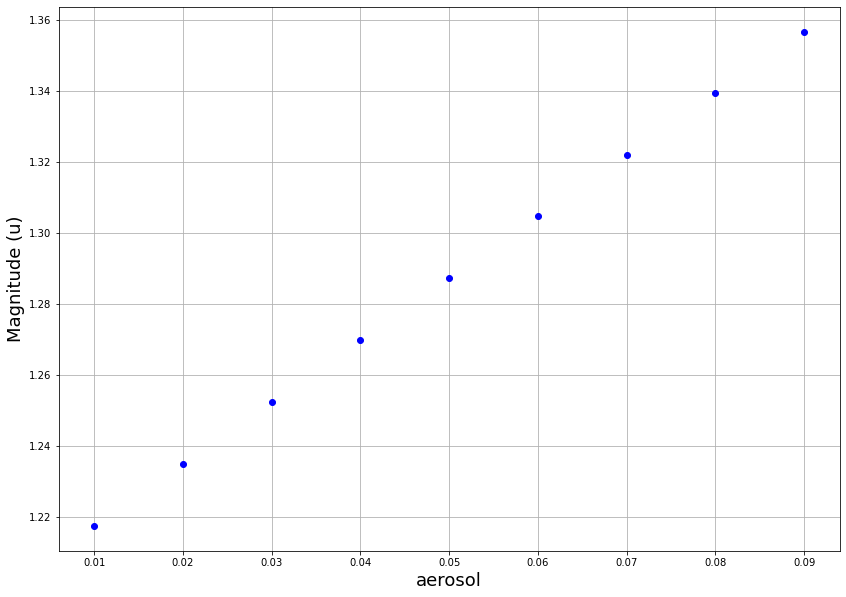

In [119]:
band = 'u'
plt.figure(figsize=(14,10))
plt.plot(atm_vals,mag_dict[test_type][test_spec][band],ls='',marker='o',color='b',label=band)
plt.grid()
plt.xlabel(variable_param,fontsize=18)
plt.ylabel('Magnitude ({0})'.format(band),fontsize=18)
#plt.legend(loc="best")

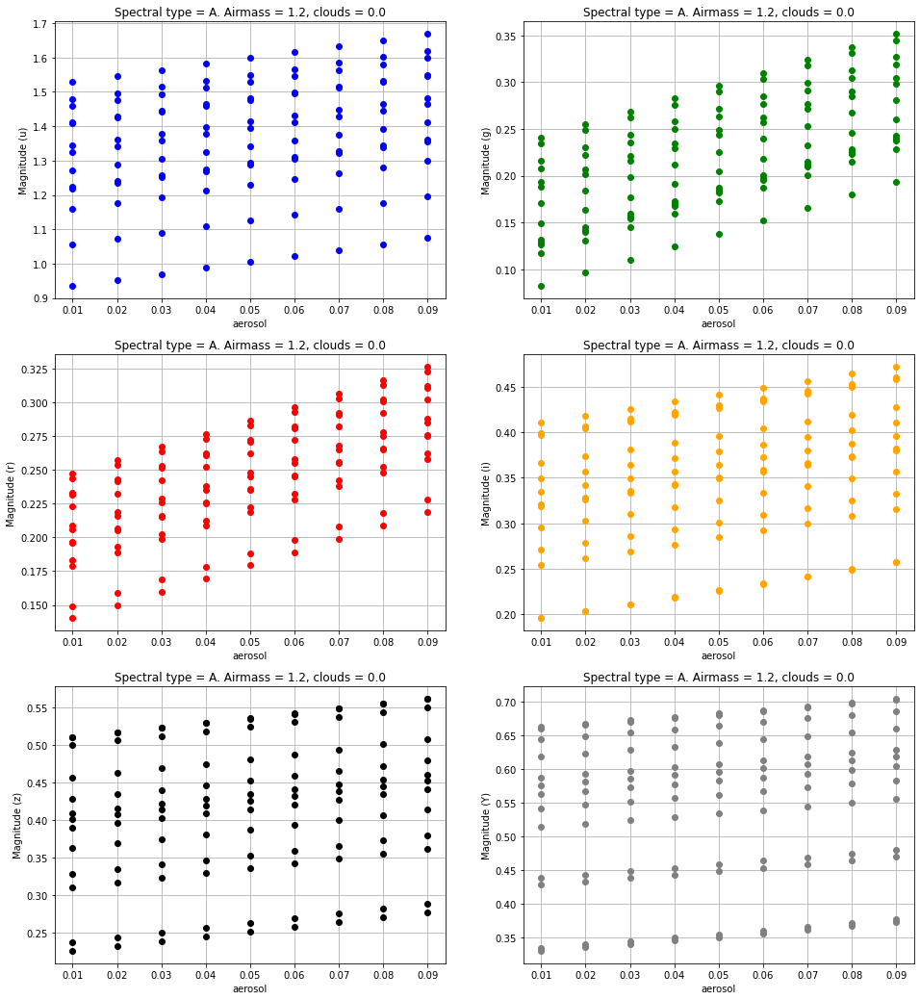

In [120]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters):
            band = filters[i]
            for si in mag_dict[test_type]:
                axs[row,col].plot(atm_vals,mag_dict[test_type][si][band],ls='',marker='o',color=filter_colors[i])
            axs[row,col].grid()
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel('Magnitude ({0})'.format(band))
            axs[row,col].set_title('Spectral type = {0}. Airmass = {1}, clouds = {2}'.format(test_type,am0,cloud0))
            i += 1
            

Now we do the same for the colours: 

Text(0, 0.5, 'u-g')

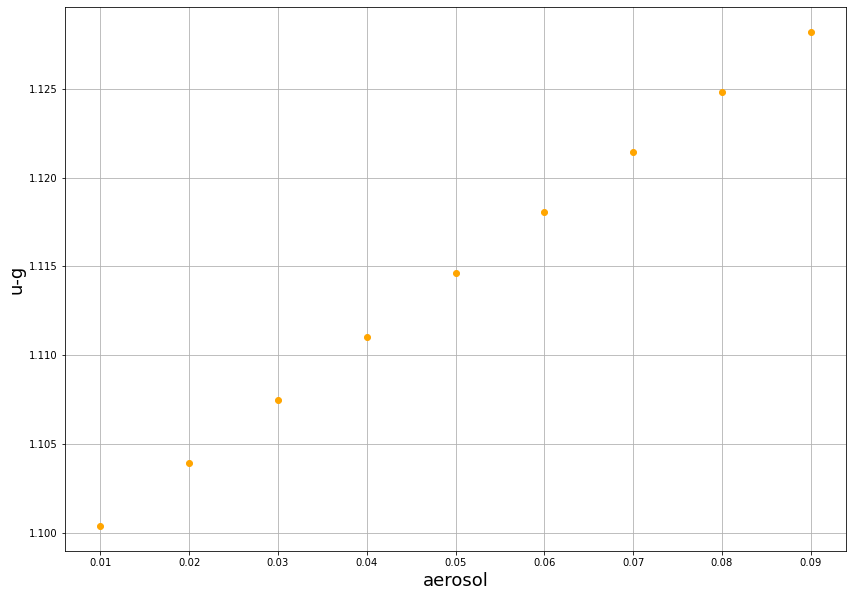

In [121]:
plt.figure(figsize=(14,10))
col = 'u-g'
color_ = colour_dict[test_type][test_spec][col]
plt.plot(atm_vals,color_,ls='',marker='o',color='orange')
plt.grid()
plt.xlabel(variable_param,fontsize=18)
plt.ylabel('{0}'.format(col),fontsize=18)

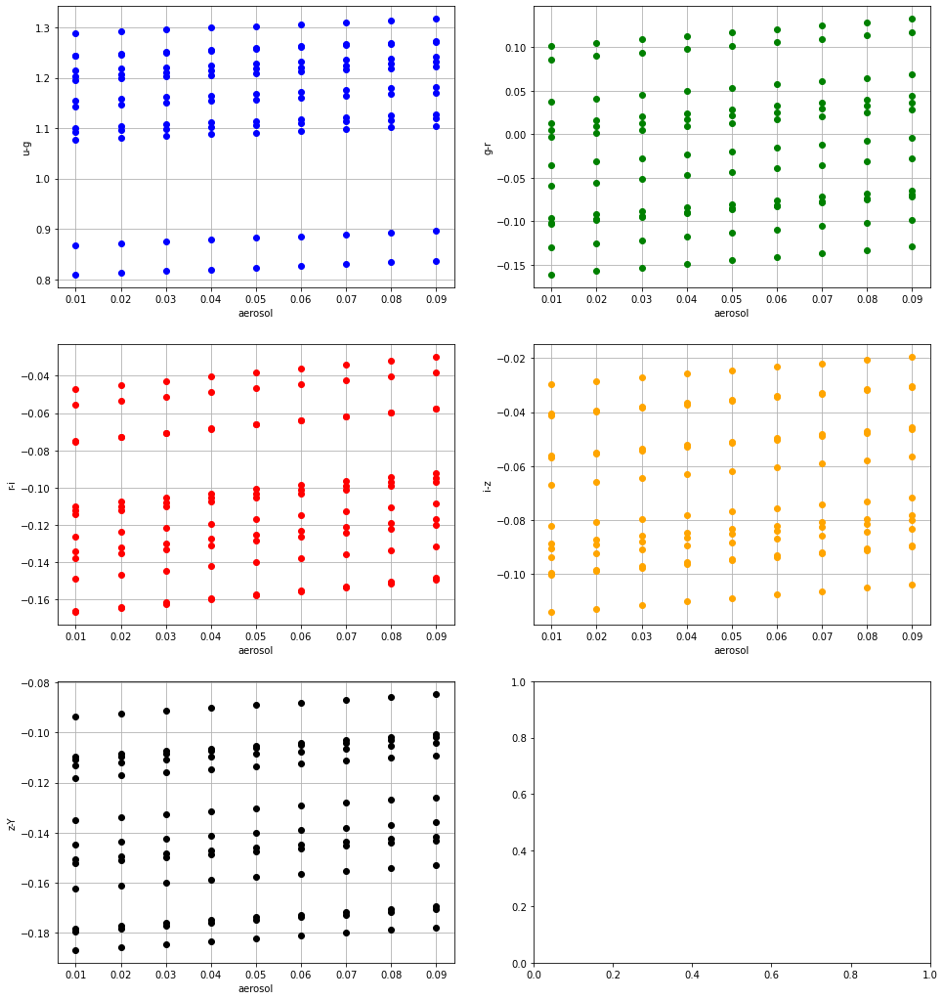

In [122]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-1:
            c = '{0}-{1}'.format(filters[i],filters[i+1])
            for si in colour_dict[test_type]:
                axs[row,col].plot(atm_vals,colour_dict[test_type][si][c.lower()],ls='',marker='o',color=filter_colors[i])
            axs[row,col].grid()
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel(c)
            #axs[row,col].legend()
            i += 1

Doing the same but with respect to the reference atmosphere, that is, $\Delta c = c - c_{ref}$: 

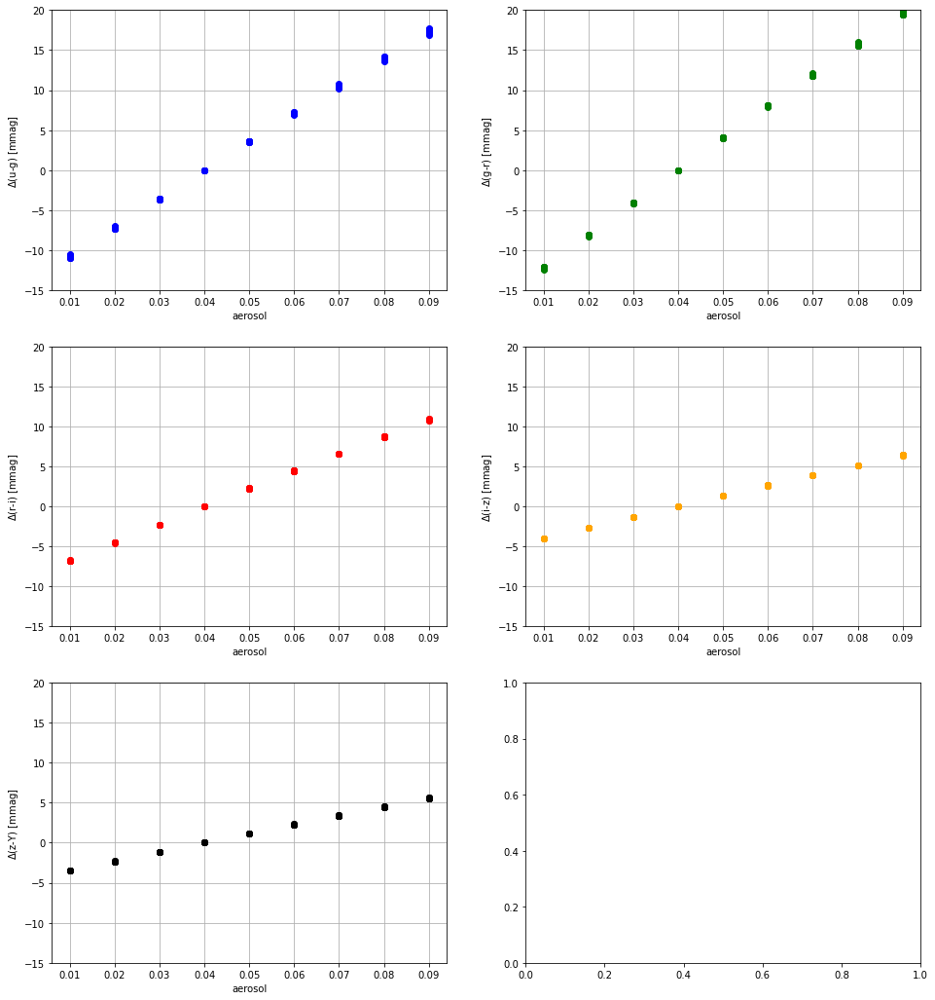

In [123]:
fig_rows = 3
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(16,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-1:
            c = '{0}-{1}'.format(filters[i],filters[i+1])
            for si in range(len(colour_dict[test_type])):
                #if si not in [15,16,17,18]:
                axs[row,col].plot(atm_vals,(colour_dict[test_type][si][c.lower()]-colour_dict_ref[test_type][si][c.lower()])*1000.,ls='',marker='o',color=filter_colors[i])
            
            axs[row,col].grid()
            axs[row,col].set_ylim(-15,20)
            axs[row,col].set_xlabel(variable_param)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+c+') [mmag]')
            #axs[row,col].legend()
            i += 1

# Evaluate the colour - colour plot as a function of the atmospheric parameter values 

Let's check first with the example spectrum: 

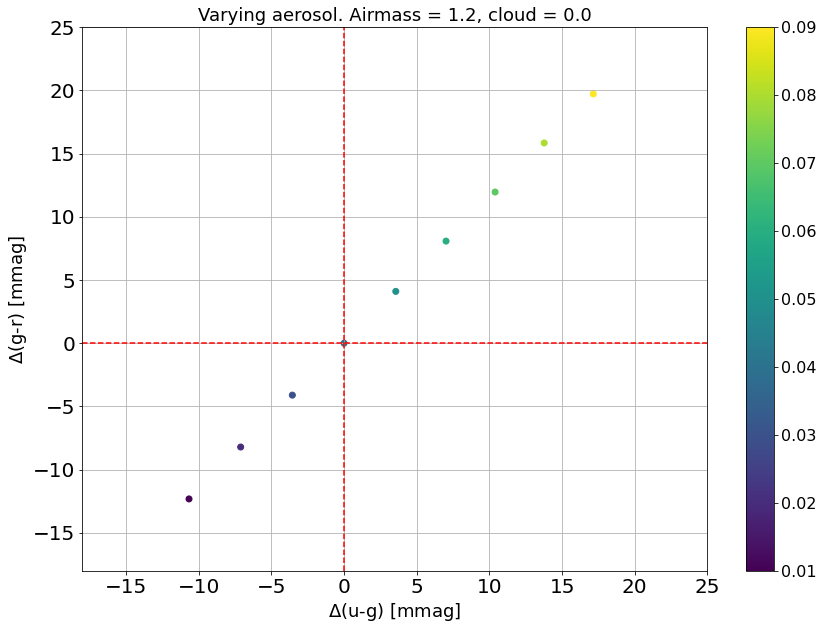

In [124]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
delta1 = (colour_dict[test_type][test_spec][colorx.lower()]-colour_dict_ref[test_type][test_spec][colorx.lower()])*1000.
delta2 = (colour_dict[test_type][test_spec][colory.lower()]-colour_dict_ref[test_type][test_spec][colory.lower()])*1000.
plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(-18,25)
plt.ylim(-18,25)
#plt.xticks(fontsize=20,rotation=45,ha='right')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
plt.title('Varying {0}. Airmass = {1}, cloud = {2}'.format(variable_param,am0,cloud0),fontsize=18)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_colour_colour_plot_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

Select Delta_color ranges 

In [125]:
rangex = (-18,25)
rangey = (-18,25)

Now we evaluate the colour - colour plot for all spectra of the example spectral type: 

In [126]:
save_plot = True

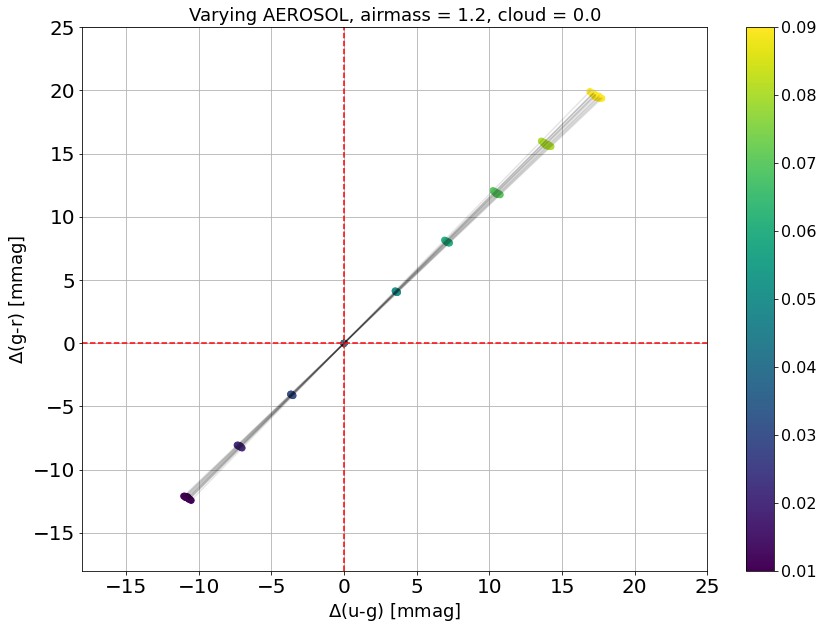

In [127]:
colorx = 'u-g'
colory = 'g-r'
plt.figure(figsize=(14,10))
for si in colour_dict[test_type]:
    delta1 = (colour_dict[test_type][si][colorx.lower()]-colour_dict_ref[test_type][si][colorx.lower()])*1000.
    delta2 = (colour_dict[test_type][si][colory.lower()]-colour_dict_ref[test_type][si][colory.lower()])*1000.
    plt.plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
    plt.scatter(delta1,delta2,c=atm_vals)
plt.axhline(y=0.,ls='--',color='r')
plt.axvline(x=0.,ls='--',color='r')
plt.grid()
plt.xlim(rangex)
plt.ylim(rangey)
#plt.xticks(fontsize=20,rotation=45,ha='right')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
plt.ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=16)
#plt.title('Spectral type: {0}. Number of spectra = {1}'.format(test_type,len(colour_dict[test_type].keys())),fontsize=16)
if save_plot:
    if variable_param=='airmass' or variable_param=='cloud':
        plt.title('Varying {0}'.format(variable_param.upper()),fontsize=18)
    else:
        plt.title('Varying {0}, airmass = {1}, cloud = {2}'.format(variable_param.upper(),am0,cloud0),fontsize=18)
    if variable_param=='airmass' or variable_param=='cloud':
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying{1}.png'.format(test_type,variable_param)))
    else:
        plt.savefig(os.path.join(outdir_plots,'spectral_type_{0}_colour_colour_plot_varying_{1}_airmass_{2}_cloud_{3}.png'.format(test_type,variable_param,am0,cloud0)))


Let's evaluate the same colour - colour plot for the different spectral types: 

O
B
A
F
G
K
M


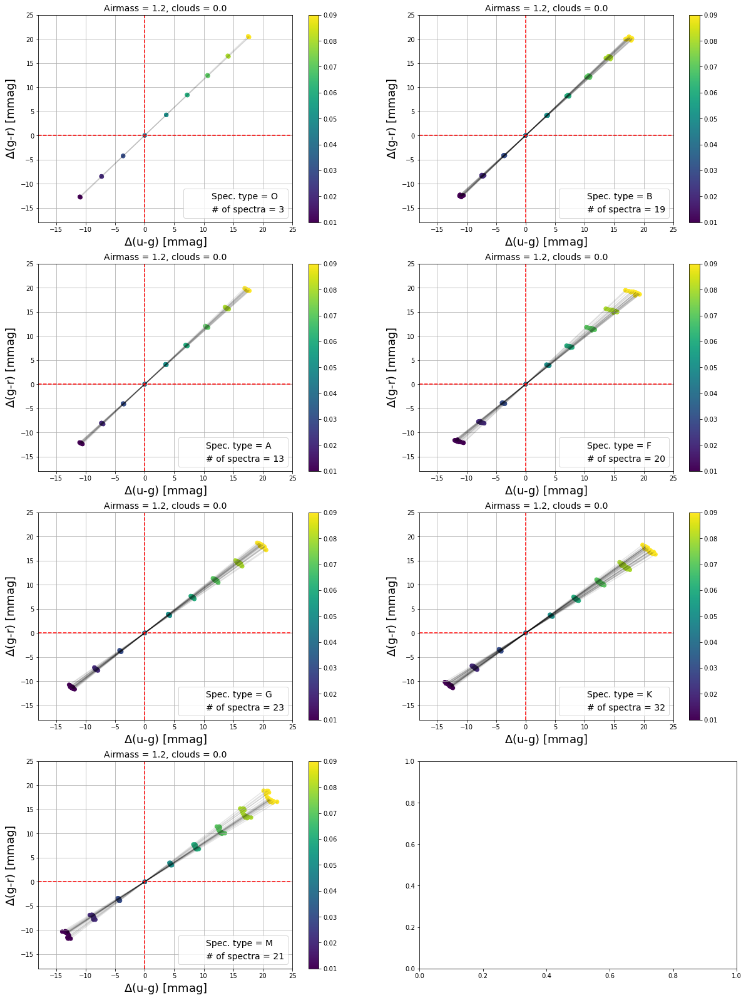

In [128]:
colorx = 'u-g'
colory = 'g-r'

fig_rows = 4
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,28))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(spectral_types):
            spec_type = spectral_types[i]
            print(spec_type)
            
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(spec_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[spec_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1


Now we evaluate the different colour - colour plots for the example spectral type: 

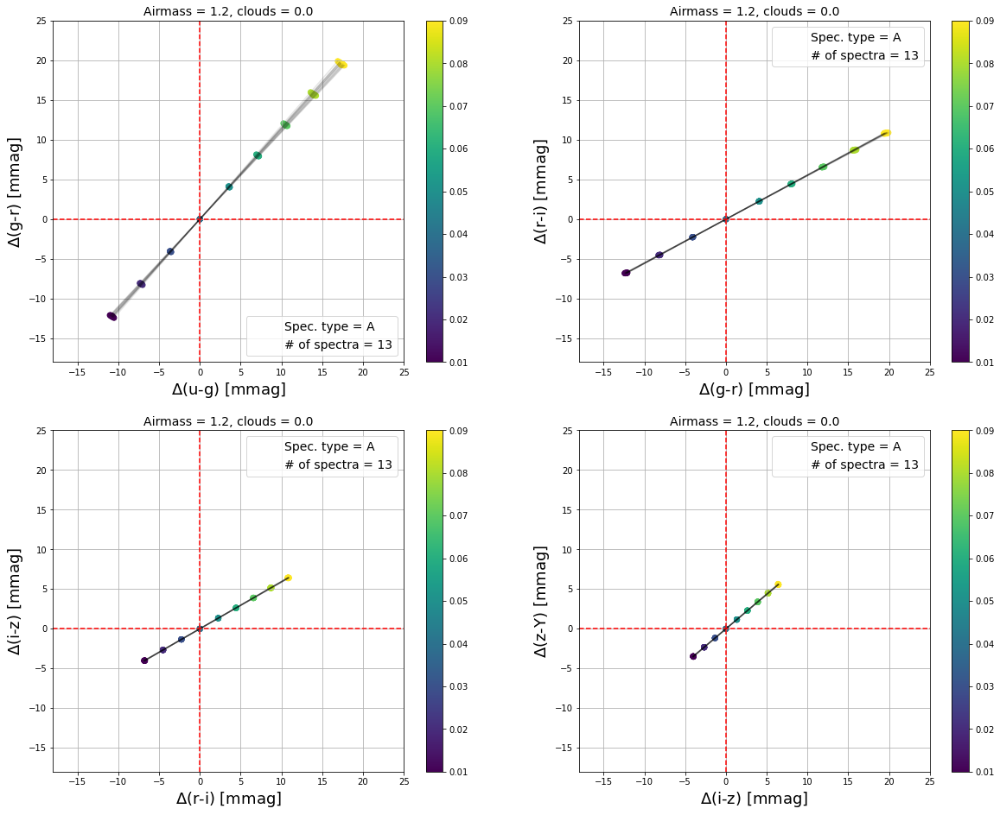

In [129]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for si in colour_dict[test_type]:
                delta1 = (colour_dict[test_type][si][cx.lower()]-colour_dict_ref[test_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[test_type][si][cy.lower()]-colour_dict_ref[test_type][si][cy.lower()])*1000.
                if si==0:
                    im = axs[row,col].scatter(delta1,delta2,c=atm_vals)
                else:
                    axs[row,col].scatter(delta1,delta2,c=atm_vals)
                axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            #axs[row,col].set_xlim(-0.012,0.021)
            #axs[row,col].set_ylim(-0.065,0.126)
            axs[row,col].plot([],[],ls='',label='Spec. type = {0}'.format(test_type))
            axs[row,col].plot([],[],ls='',label='# of spectra = {0}'.format(len(colour_dict[test_type].keys())))
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1

We also evaluate the dependency of the colours with the atmospheric parameters for each spectral type: 

In [130]:
type_markers = {'O':'s','B':'x','A':'o','F':'v','G':'^','K':'P','M':'*'}

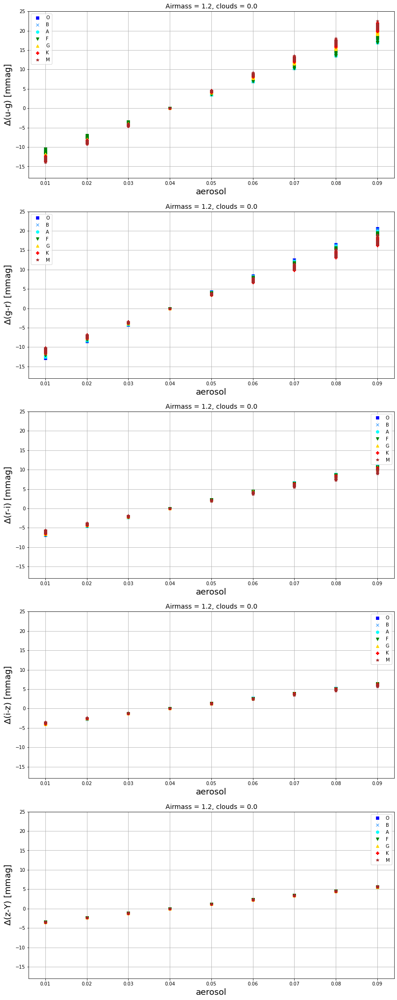

In [131]:
fig_rows = len(filters)-1
fig_cols = 1
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(14,38))
for row in range(fig_rows):
    c = '{0}-{1}'.format(filters[row],filters[row+1])
    for spec_type in spectral_types:
        for si in mag_dict[spec_type]:
            delta_c_ = (colour_dict[spec_type][si][c.lower()]-colour_dict_ref[spec_type][si][c.lower()])*1000.
            axs[row].plot(atm_vals,delta_c_,ls='',marker=type_markers[spec_type],color=type_colors[spec_type])
        axs[row].plot([],[],ls='',marker=type_markers[spec_type],color=type_colors[spec_type],label = spec_type)
    axs[row].set_ylim(rangey)
    axs[row].grid()
    axs[row].set_xlabel(variable_param,fontsize=18)
    axs[row].set_ylabel(r'$\Delta$'+'('+c+') [mmag]',fontsize=18)
    axs[row].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
    axs[row].legend()
plt.savefig(os.path.join(outdir_plots,'delta_colours_vs_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))
    

Let's have a look now at the colour-colour plots for all spectral types together 

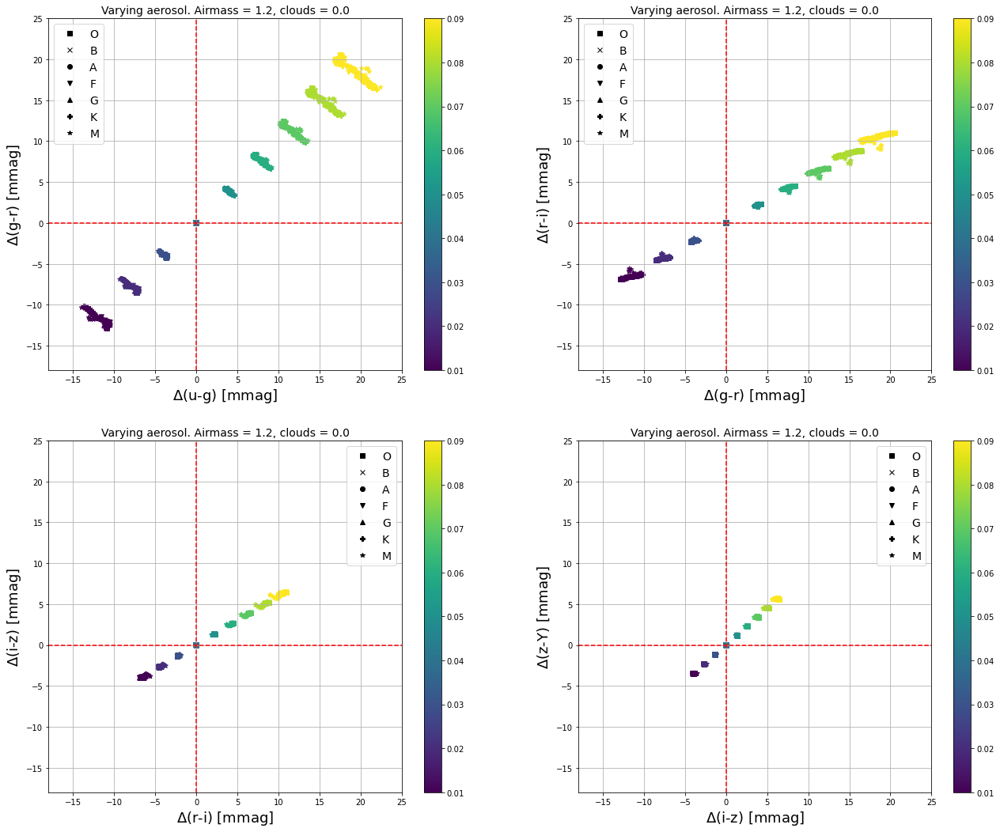

In [132]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    if sed_==0:
                        im = axs[row,col].scatter(delta1,delta2,c=atm_vals,marker=type_markers[spec_type])
                    else:
                        axs[row,col].scatter(delta1,delta2,c=atm_vals,marker=type_markers[spec_type])
                    #axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
                axs[row,col].plot([],[],c='k',ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            plt.colorbar(im, ax=axs[row,col])
            axs[row,col].legend(fontsize=14)
            i += 1
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

An alternative way of plotting this: 

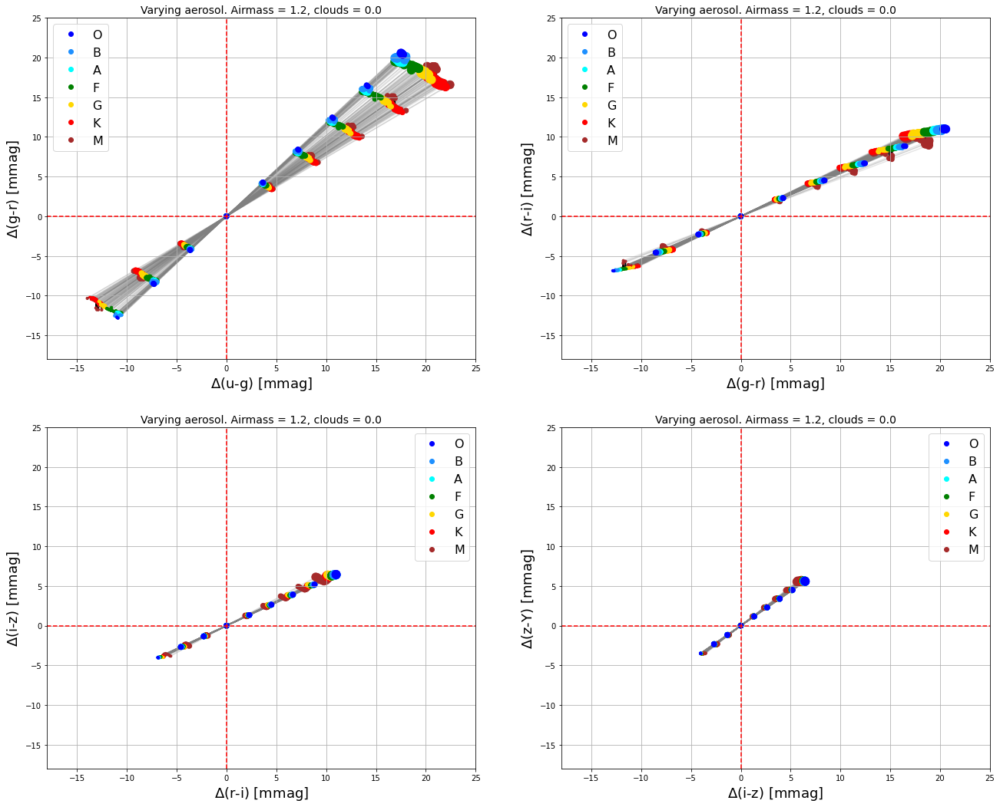

In [133]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    iso_vals1.append(delta1)
                    iso_vals2.append(delta2)
                    
                    axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            for spec_type in spectral_types:
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
                
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            i += 1
            
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}_v2.png'.format(variable_param,am0,cloud0)))

Plot and save them individually: 

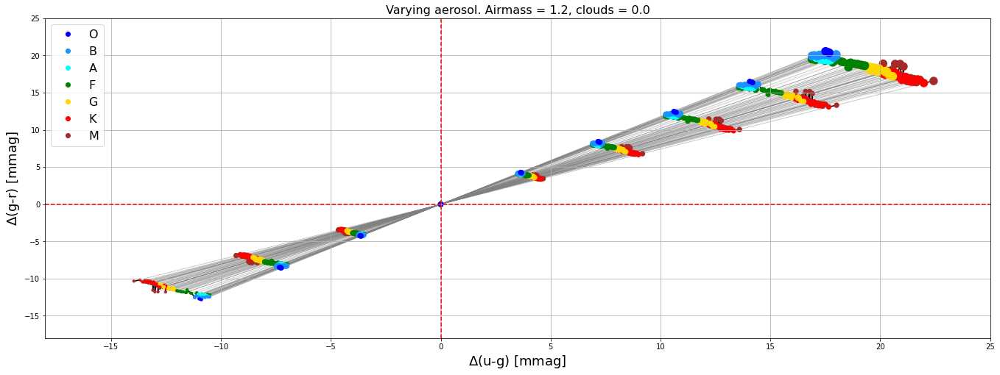

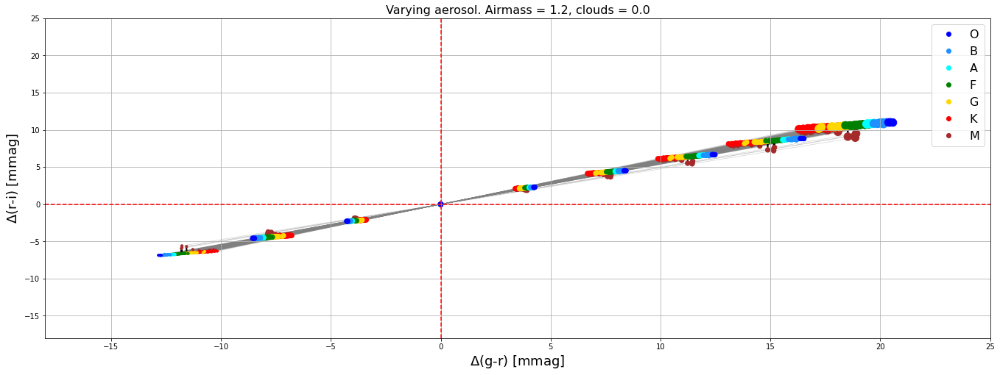

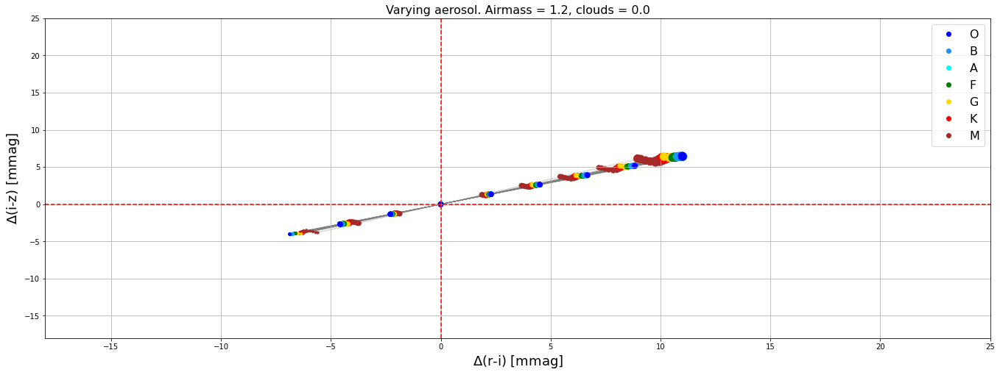

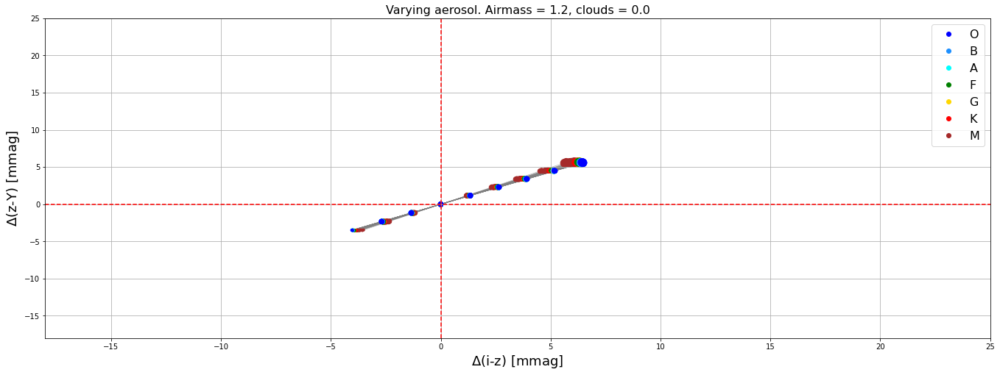

In [134]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(23,8))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex)
        axs.set_ylim(rangey)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=16)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0,cx,cy)))

Now we look at the same information but restricted to the most extreme atmospheric parameter values: 

u
g
r
i
z
Y
photlam


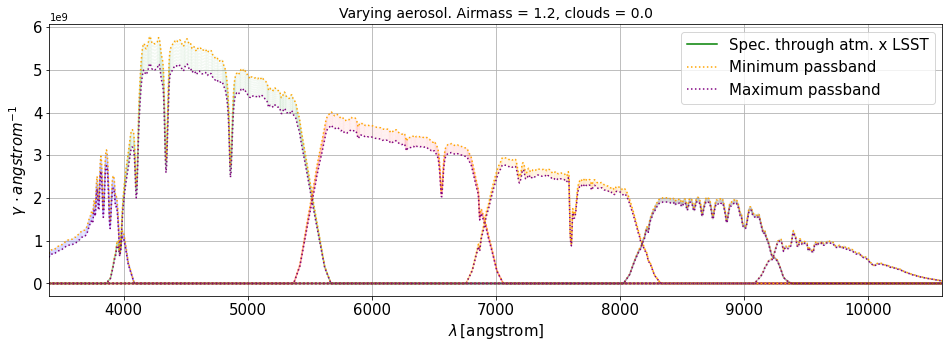

In [135]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)

for index,filter in enumerate(obstotal_dict.keys()):
    print(filter)
    for obs in obstotal_dict[filter]:
        ax.plot(obs.binwave,obs.binflux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.05)
    ax.plot(obstotal_dict[filter][min_ind_].binwave,obstotal_dict[filter][min_ind_].binflux*Seff*exptime,ls=':',color='orange')
    ax.plot(obstotal_dict[filter][max_ind_].binwave,obstotal_dict[filter][max_ind_].binflux*Seff*exptime,ls=':',color='purple')
plt.xlim(WLMIN,WLMAX)
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.grid()
plt.plot([],[],ls='-',color='g',label='Spec. through atm. x LSST')
plt.plot([],[],ls=':',color='orange',label='Minimum passband')
plt.plot([],[],ls=':',color='purple',label='Maximum passband')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.legend(fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
plt.savefig(os.path.join(outdir_plots,'example_spectrum_min_max_total_passband_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))
print(spec.fluxunits)

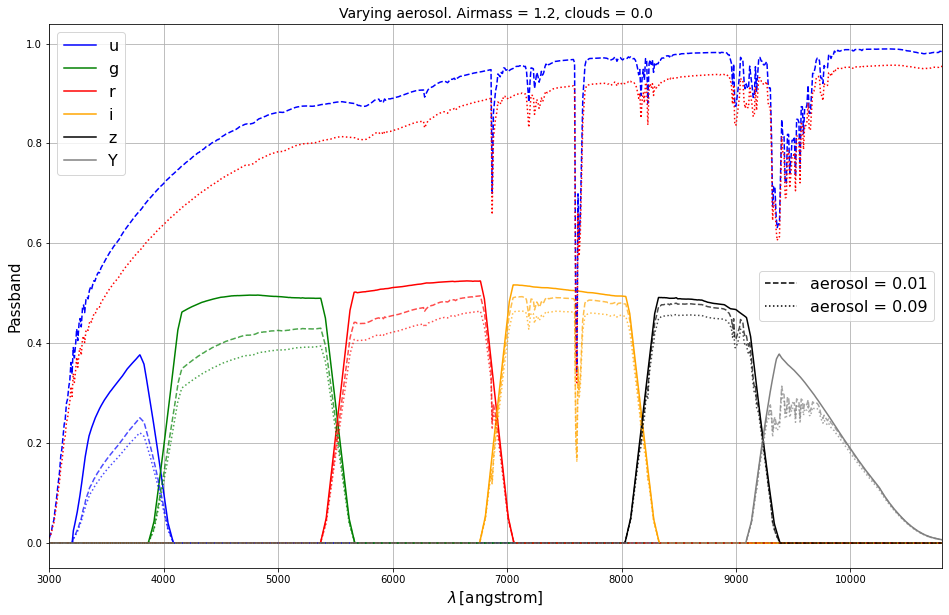

In [136]:
fig=plt.figure(figsize=(16,10))
ax = fig.add_subplot(111)
legend_lines1 = []
for index,bp in enumerate(lsst_bp):
    line_, = ax.plot(bp.wave,bp.throughput,label=filter_names[index],color=filter_colors[index])
    legend_lines1.append(line_)

ax.plot(atm_transp[min_ind_].wave,atm_transp[min_ind_].throughput,ls='--',alpha=1.0,color='b')
ax.plot(atm_transp[max_ind_].wave,atm_transp[max_ind_].throughput,ls=':',alpha=1.0,color='r')

for index,bpname in enumerate(filters):
    ax.plot(total_passband[bpname][min_ind_].wave,total_passband[bpname][min_ind_].throughput,ls='--',color=filter_colors[index],alpha=0.7)
    ax.plot(total_passband[bpname][max_ind_].wave,total_passband[bpname][max_ind_].throughput,ls=':',color=filter_colors[index],alpha=0.7)        
line1, = plt.plot([],[],ls='--',color='k',label='{0} = {1}'.format(variable_param,min_val_))
line2, = plt.plot([],[],ls=':',color='k',label='{0} = {1}'.format(variable_param,max_val_))
legend_lines2 = [line1,line2]
plt.xlim(3000.,10800.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(atm_transp_ref.waveunits)+']',fontsize=15)
plt.ylabel('Passband',fontsize=15)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
legend1 = plt.legend(handles=legend_lines1,fontsize=16,loc="upper left")
plt.gca().add_artist(legend1)
plt.legend(handles=legend_lines2,fontsize=16,loc="center right")
plt.savefig(os.path.join(outdir_plots,'total_passbands_min_max_varying_{0}_airmass_{1}_cloud_{2}.png'.format(variable_param,am0,cloud0)))

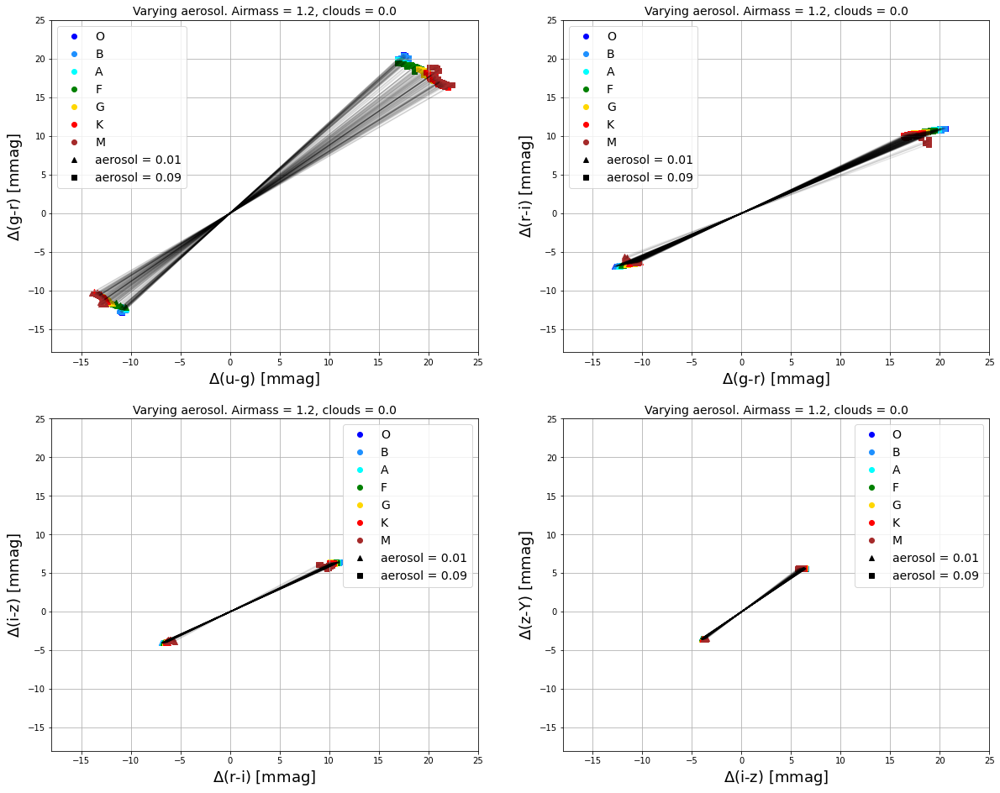

In [137]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    delta1_min = (colour_dict[spec_type][si][cx.lower()][min_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_min = (colour_dict[spec_type][si][cy.lower()][min_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    delta1_max = (colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_max = (colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    axs[row,col].scatter(delta1_min,delta2_min,c=type_colors[spec_type],marker='^')
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker='s')
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='k',alpha=0.1)
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            axs[row,col].plot([],[],ls='',marker='^',color='k',label='{0} = {1}'.format(variable_param,atm_vals[min_ind_]))
            axs[row,col].plot([],[],ls='',marker='s',color='k',label='{0} = {1}'.format(variable_param,atm_vals[max_ind_]))
            #axs[row,col].axhline(y=0.,ls='--',color='r')
            #axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(rangex)
            axs[row,col].set_ylim(rangey)
            
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
    
            i += 1

plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_min_max_varying_{0}_airmass_{1}_clouds_{2}.png'.format(variable_param,am0,cloud0)))

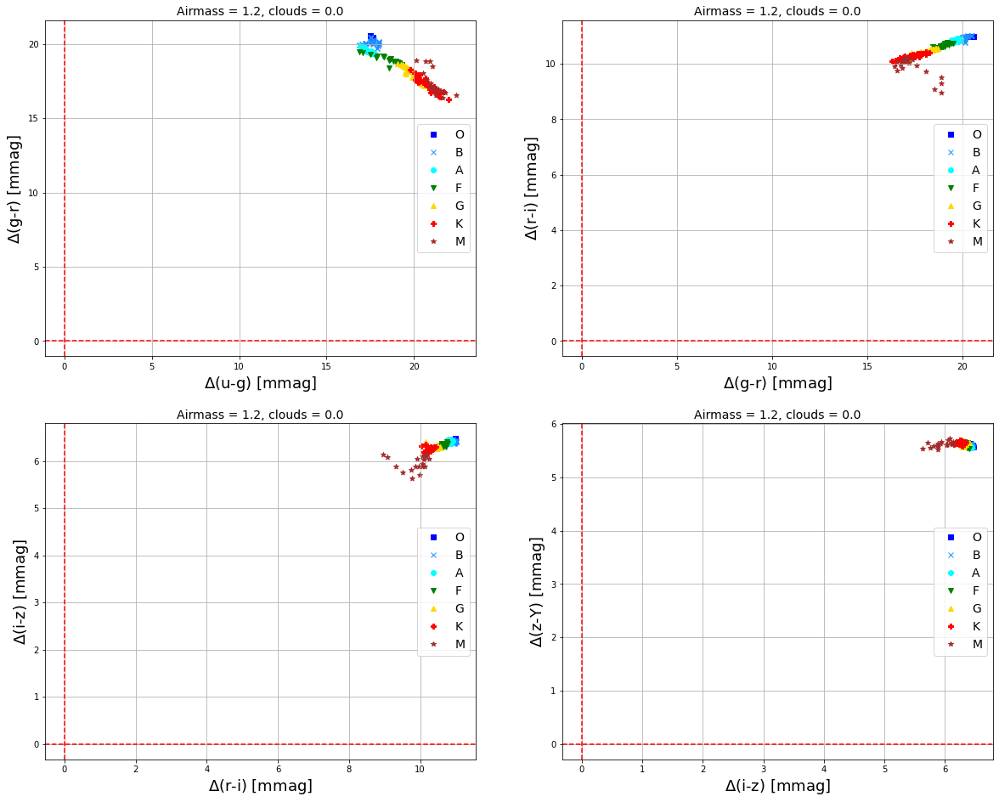

In [138]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types:
                for si in colour_dict[spec_type]:
                    delta1_max = (colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2_max = (colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker=type_markers[spec_type])
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
            
            i += 1

We exclude the M type spectra for more clarity: 

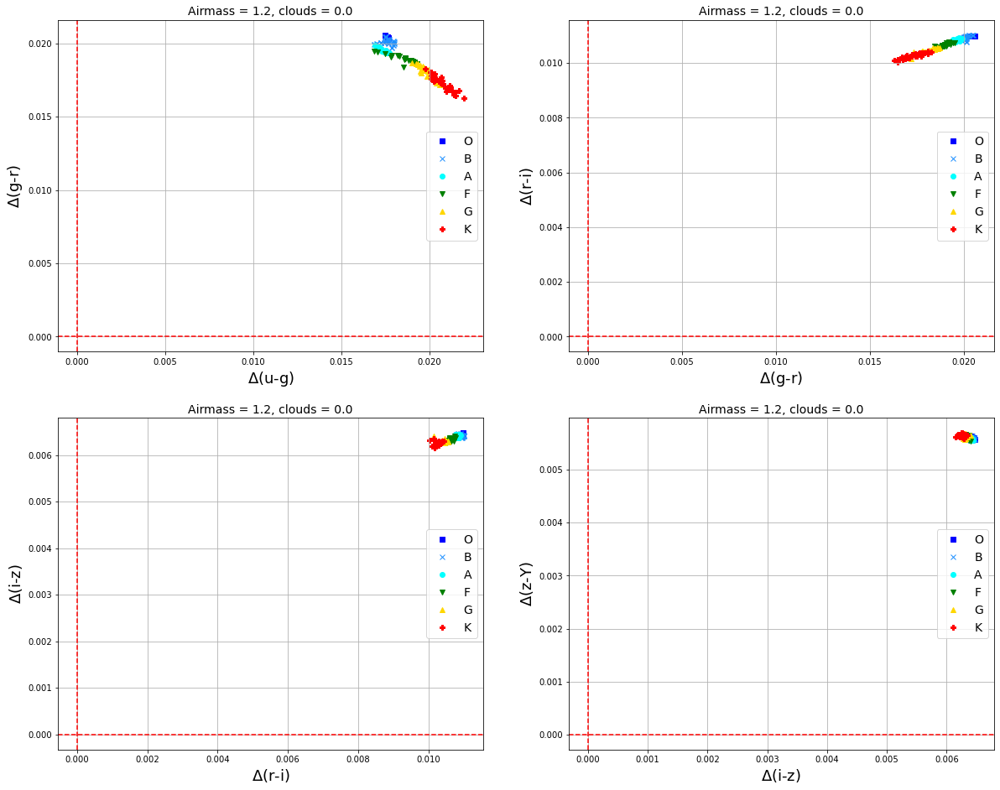

In [139]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(20,16))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            for spec_type in spectral_types[:-1]:
                for si in colour_dict[spec_type]:
                    delta1_max = colour_dict[spec_type][si][cx.lower()][max_ind_]-colour_dict_ref[spec_type][si][cx.lower()]
                    delta2_max = colour_dict[spec_type][si][cy.lower()][max_ind_]-colour_dict_ref[spec_type][si][cy.lower()]
                    
                    axs[row,col].scatter(delta1_max,delta2_max,c=type_colors[spec_type],marker=type_markers[spec_type])
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker=type_markers[spec_type],label=spec_type)
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+')',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+')',fontsize=18)
            axs[row,col].set_title('Airmass = {0}, clouds = {1}'.format(am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=14)
            
            i += 1

# Make 3D colour plot 

To see an interactive version of the following plot, see notebook "03_spectrum_ThroughAtmLSST_3Dcolor_plot.ipynb" 

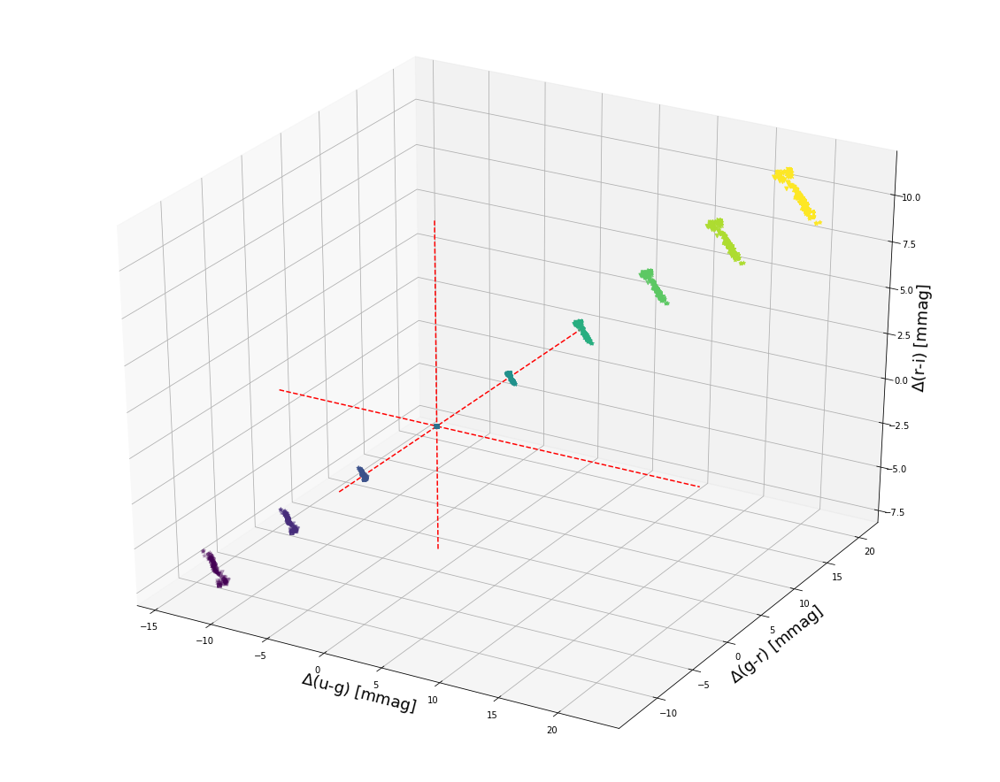

In [140]:
colorx = 'u-g'
colory = 'g-r'
colorz = 'r-i'

fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(projection='3d')

minx, maxx = [], []
miny, maxy = [], []
minz, maxz = [], []
for spec_type in spectral_types:
    for si in colour_dict[spec_type]:
        delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
        delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
        delta3 = (colour_dict[spec_type][si][colorz.lower()]-colour_dict_ref[spec_type][si][colorz.lower()])*1000.

        ax.scatter(delta1,delta2,delta3,c=atm_vals,marker=type_markers[spec_type])
        minx.append(np.min(delta1))
        miny.append(np.min(delta2))
        minz.append(np.min(delta3))
        maxx.append(np.max(delta1))
        maxy.append(np.max(delta2))
        maxz.append(np.max(delta3))

ax.set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
ax.set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
ax.set_zlabel(r'$\Delta$'+'('+colorz+') [mmag]',fontsize=18)

xrange = np.linspace(np.min(minx),np.max(maxx),100)
yrange = np.linspace(np.min(miny),np.max(maxy),100)
zrange = np.linspace(np.min(minz),np.max(maxz),100)

ax.plot(xrange,np.zeros(len(yrange)),np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),yrange,np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),np.zeros(len(yrange)),zrange,'r--')


# Calculate colour evolution for SN Ia spectra 

We use the SNe Ia spectra from https://github.com/rhiannonlynne/photometry_sample/tree/main/sn 

In [141]:
sne_path = 'data/SNIa_spectra/'
sn1_data = np.loadtxt(os.path.join(sne_path,'sn1a_10.0.dat'))
sn2_data = np.loadtxt(os.path.join(sne_path,'sn1a_15.0.dat'))
sn3_data = np.loadtxt(os.path.join(sne_path,'sn1a_20.0.dat'))

The wavelengths are in nm and the fluxes in erg/s/cm2/nm, so we need to change the units to angstrom and photlam = #photons/s/cm2/angstrom (pysynphot assumes that the input fluxes are in photlam). For this, we need to remember that the conversion between flam (erg/s/cm2/angstrom) and photlam is given by 

$$ photlam = \frac{\lambda}{h \cdot c} flam $$

In [142]:
sn1wave = sn1_data[:,0]*10.
sn2wave = sn2_data[:,0]*10.
sn3wave = sn3_data[:,0]*10.

sn1flux = sn1_data[:,1]*sn1wave/(h_planck*c_light)
sn2flux = sn2_data[:,1]*sn2wave/(h_planck*c_light)
sn3flux = sn3_data[:,1]*sn3wave/(h_planck*c_light)

In [143]:
sn1 = S.ArraySpectrum(sn1wave,sn1flux,name='sn1a_10.0')
sn2 = S.ArraySpectrum(sn2wave,sn2flux,name='sn1a_15.0')
sn3 = S.ArraySpectrum(sn3wave,sn3flux,name='sn1a_20.0')

In [144]:
sn1.waveunits, sn1.fluxunits

(<pysynphot.units.Angstrom at 0x7f1ea8097c70>,
 <pysynphot.units.Photlam at 0x7f1ea8097e20>)

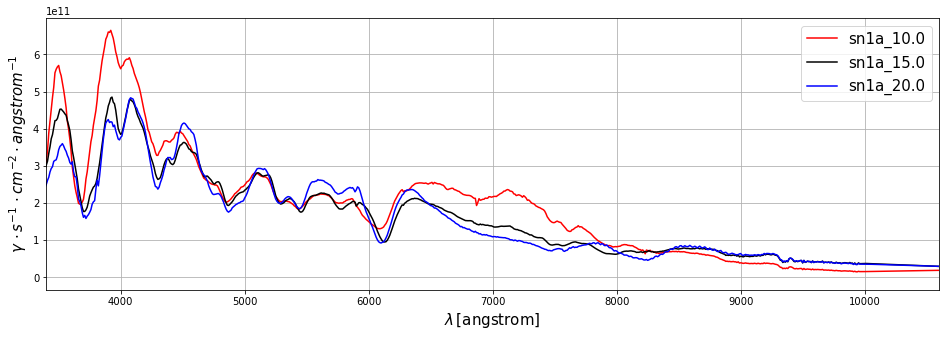

In [145]:
fig=plt.figure(figsize=(16,5))
plt.plot(sn1.wave,sn1.flux,color='r',label=sn1.name)
plt.plot(sn2.wave,sn2.flux,color='k',label=sn2.name)
plt.plot(sn3.wave,sn3.flux,color='b',label=sn3.name)
plt.xlim(WLMIN,WLMAX)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot s^{-1} \, \cdot cm^{-2} \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=15)

Now we pass the SNIa spectra through the total passbands, as with the calibration spectra 

In [146]:
sn_list = [sn1,sn2,sn3]

In [147]:
# SNe Ia through atm x throughput 
sn_obs_dict = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    sn_obs_dict[si] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [148]:
print(len(sn_obs_dict.keys()))
print(len(sn_obs_dict[0].keys()))
print(len(sn_obs_dict[0]['u']))

3
6
9


In [149]:
# SNe Ia only through throughput (as if telescope was in space) 
sn_obs_dict_t = {}
for si,spec in enumerate(sn_list):
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    sn_obs_dict_t[si] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

In [150]:
print(len(sn_obs_dict_t.keys()))
print(len(sn_obs_dict_t[0].keys()))
print(sn_obs_dict_t[0]['u'].flux)

3
6
[0. 0. 0. ... 0. 0. 0.]


Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

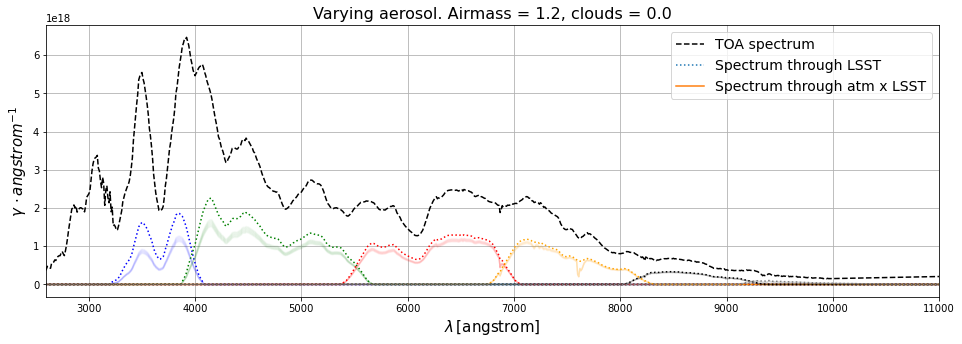

In [151]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We zoom in to see the effect of the different atmospheric transparencies 

Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

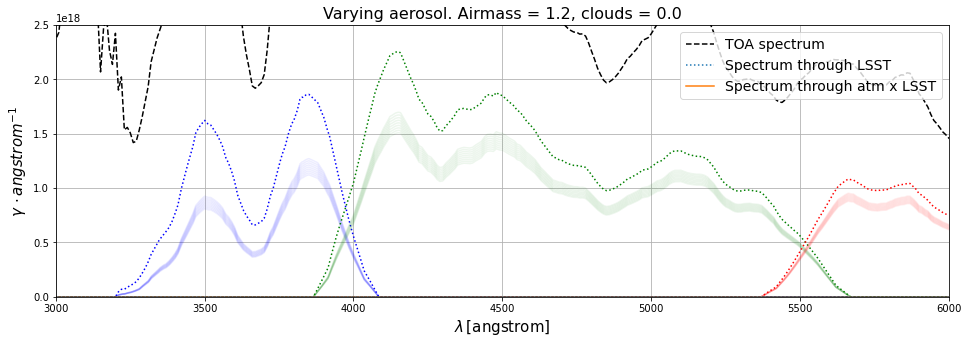

In [152]:
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn_list[0].wave,sn_list[0].flux*Seff*exptime,ls='--',color='k',label='TOA spectrum')

for index,filter in enumerate(filters):
    #plt.plot(obs_dict_t[example_spec][filter].wave,obs_dict_t[example_spec][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        #obs_ = obs_dict[example_spec][filter][i]
        obs_ = sn_obs_dict[0][filter][i]
        #plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.02)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.07)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(3000.,6000.)
plt.ylim(0,2.5e18)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

We can now calculate the magnitudes and colours 

In [153]:
# Magnitudes of spectra passing through atm x throughput 
sn_mag_dict = {}
sn_mag_dict_ref = {}
sn_mag_err_dict = {}
sn_mag_err_dict_ref = {}
for si,obs_spec_ in enumerate(sn_list):
    mag_dict_ = {}
    mag_dict_ref_ = {}
    mag_err_dict_ = {}
    mag_err_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        mag_err_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            if calc_mag_err:
                mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi],return_error=True)
                mag_err_dict_[filter].append(mag_err_ab_)
            else:
                mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        if calc_mag_err:
            mag_ab_, mag_err_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi],return_error=True)
            mag_err_dict_ref_[filter] = mag_err_ab_
        else:
            mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    sn_mag_dict[si] = mag_dict_
    sn_mag_dict_ref[si] = mag_dict_ref_
    sn_mag_err_dict[si] = mag_err_dict_
    sn_mag_err_dict_ref[si] = mag_err_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.24e+20
Numerator = 5.24e+20
Variance of the numerator = 9.58e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.573877005476774
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.16e+20
Numerator = 5.16e+20
Variance of the numerator = 9.27e+1

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.29e+21
Numerator = 1.29e+21
Variance of the numerator = 5.50e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.804599766810526
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 1.28e+21
Numerator = 1.28e+21
Variance of the numerator = 5.41e+20
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.79484809004

n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.71e+19
Numerator = 5.71e+19
Variance of the numerator = 1.27e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -18.848487425612774
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.04078012e+13 8.06472397e+13 2.20629448e+14 ... 6.26482906e+17
 6.26850970e+17 6.27219616e+17]
Number of collected photoelectrons = 5.68e+19
Numerator = 5.68e+19
Variance of the numerator = 1.26e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -18.84336860397

n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.53e+21
Numerator = 1.53e+21
Variance of the numerator = 5.35e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.67268020422923
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 1.51e+21
Numerator = 1.51e+21
Variance of the numerator = 5.21e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -20.658685466906

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.203184305170772
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [4.02802412e+12 2.35024670e+13 8.11427136e+13 ... 6.30994096e+17
 6.31420828e+17 6.31848310e+17]
Number of collected photoelectrons = 5.69e+20
Numerator = 5.69e+20
Variance of the numerator = 2.48e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.24234134683613
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i

Denominator = 3.09e+12
AB magnitude =  -20.085155356779172
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 3.29e+20
Numerator = 3.29e+20
Variance of the numerator = 5.41e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.06764628718901
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 5.03e+20
Numerator = 5.03e+20
Variance of the numerator = 2.25e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.108851940968314
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 5.00e+20
Numerator = 5.00e+20
Variance of the numerator = 2.22e+20
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.10126722184

n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.07e+20
Numerator = 1.07e+20
Variance of the numerator = 2.32e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.52883693132414
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
n_i =  [2.51830834e+12 1.32018527e+13 4.07395590e+13 ... 6.91992220e+17
 6.92585096e+17 6.93178838e+17]
Number of collected photoelectrons = 1.06e+20
Numerator = 1.06e+20
Variance of the numerator = 2.30e+19
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.523306544716

In [154]:
print(len(sn_mag_dict.keys()))
print(len(sn_mag_dict[0].keys()))
print(len(sn_mag_dict[0]['u']))

3
6
9


In [155]:
sn_colour_dict = {}
sn_colour_err_dict = {}
for sn in sn_mag_dict.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict[sn] = c_dict
    sn_colour_err_dict[sn] = c_err_dict


In [156]:
print(len(sn_mag_dict.keys()))
print(len(sn_colour_dict.keys()))
print(len(sn_colour_dict[0].keys()))
print(len(sn_colour_dict[0]['u-g']))

3
3
5
9


In [157]:
sn_colour_dict_ref = {}
sn_colour_err_dict_ref = {}
for sn in sn_mag_dict_ref.keys():
    c_dict = {}
    c_err_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(sn_mag_dict_ref[sn][filters[fi]])
        mag2 = np.array(sn_mag_dict_ref[sn][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        if calc_mag_err:
            err_mag1 = np.array(sn_mag_err_dict_ref[sn][filters[fi]])
            err_mag2 = np.array(sn_mag_err_dict_ref[sn][filters[fi+1]])
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
        if calc_mag_err:
            err_colour_ = np.sqrt(err_mag1**2.+err_mag2**2.)
            c_err_dict[colour_name] = err_colour_
    sn_colour_dict_ref[sn] = c_dict
    sn_colour_err_dict_ref[sn] = c_err_dict
    

In [158]:
print(len(sn_mag_dict_ref.keys()))
print(len(sn_colour_dict_ref.keys()))
print(len(sn_colour_dict_ref[0].keys()))
print(sn_colour_dict_ref[0]['u-g'])

3
3
5
0.273046167203578


In [159]:
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_dict)
np.save('output_files/sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_dict_ref)
if calc_mag_err:
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict)
    np.save('output_files/sn_colour_err_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),sn_colour_err_dict_ref)

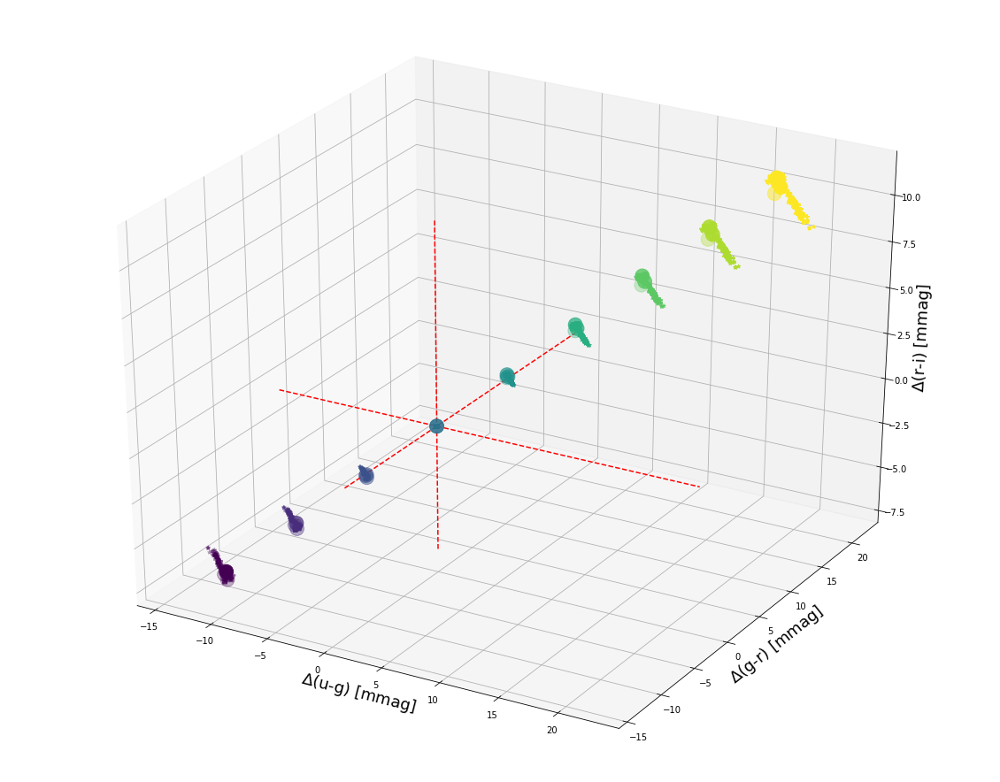

In [160]:
colorx = 'u-g'
colory = 'g-r'
colorz = 'r-i'

fig = plt.figure(figsize=(20,16))
ax = fig.add_subplot(projection='3d')

minx, maxx = [], []
miny, maxy = [], []
minz, maxz = [], []
for spec_type in spectral_types:
    for si in colour_dict[spec_type]:
        delta1 = (colour_dict[spec_type][si][colorx.lower()]-colour_dict_ref[spec_type][si][colorx.lower()])*1000.
        delta2 = (colour_dict[spec_type][si][colory.lower()]-colour_dict_ref[spec_type][si][colory.lower()])*1000.
        delta3 = (colour_dict[spec_type][si][colorz.lower()]-colour_dict_ref[spec_type][si][colorz.lower()])*1000.

        ax.scatter(delta1,delta2,delta3,c=atm_vals,marker=type_markers[spec_type])
        minx.append(np.min(delta1))
        miny.append(np.min(delta2))
        minz.append(np.min(delta3))
        maxx.append(np.max(delta1))
        maxy.append(np.max(delta2))
        maxz.append(np.max(delta3))
        
for sn in sn_colour_dict.keys():
    delta1_sn = (sn_colour_dict[sn][colorx.lower()]-sn_colour_dict_ref[sn][colorx.lower()])*1000.
    delta2_sn = (sn_colour_dict[sn][colory.lower()]-sn_colour_dict_ref[sn][colory.lower()])*1000.
    delta3_sn = (sn_colour_dict[sn][colorz.lower()]-sn_colour_dict_ref[sn][colorz.lower()])*1000.
    
    ax.scatter(delta1_sn,delta2_sn,delta3_sn,c=atm_vals,marker='o',s=250.0)

ax.set_xlabel(r'$\Delta$'+'('+colorx+') [mmag]',fontsize=18)
ax.set_ylabel(r'$\Delta$'+'('+colory+') [mmag]',fontsize=18)
ax.set_zlabel(r'$\Delta$'+'('+colorz+') [mmag]',fontsize=18)

xrange = np.linspace(np.min(minx),np.max(maxx),100)
yrange = np.linspace(np.min(miny),np.max(maxy),100)
zrange = np.linspace(np.min(minz),np.max(maxz),100)

ax.plot(xrange,np.zeros(len(yrange)),np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),yrange,np.zeros(len(zrange)),'r--')
ax.plot(np.zeros(len(xrange)),np.zeros(len(yrange)),zrange,'r--')


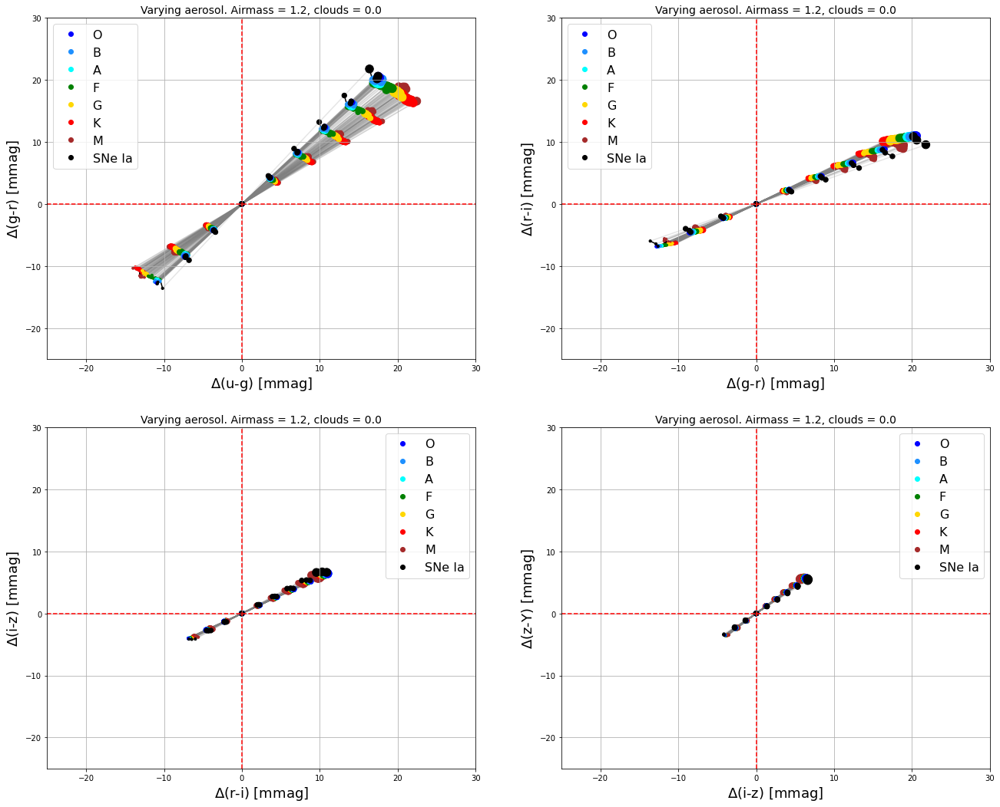

In [161]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    iso_vals1.append(delta1)
                    iso_vals2.append(delta2)
                    
                    axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            for spec_type in spectral_types:
                axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
                
                
            for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs[row,col].scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs[row,col].plot(delta1_sn,delta2_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            axs[row,col].plot([],[],c='k',ls='',marker='o',label='SNe Ia')
            
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(-25,30)
            axs[row,col].set_ylim(-25,30)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            
            i += 1
plt.savefig(os.path.join(outdir_plots,'colour_colour_plots_varying_{0}_airmass_{1}_clouds_{2}_v2_sn.png'.format(variable_param,am0,cloud0)))

In [162]:
rangex2 = (-25,30)
rangey2 = (-25,30)

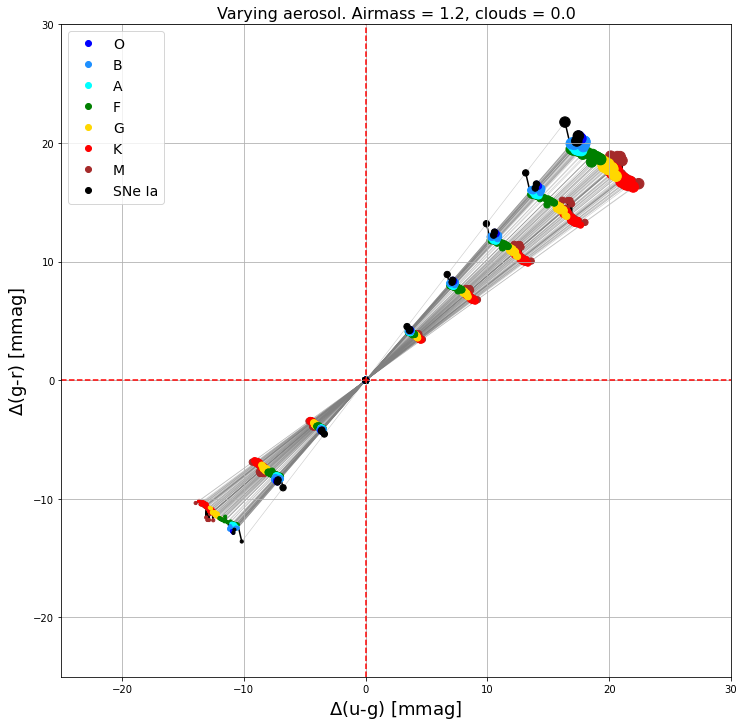

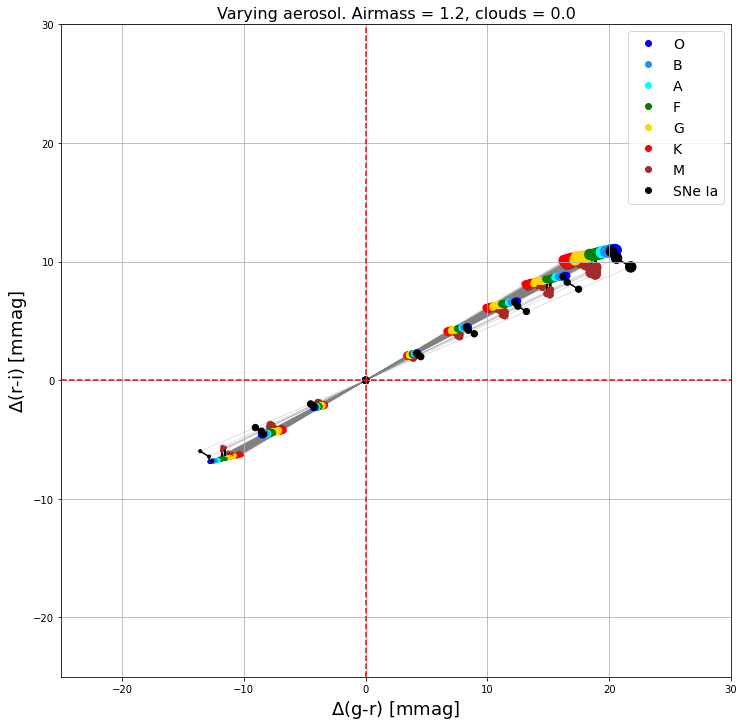

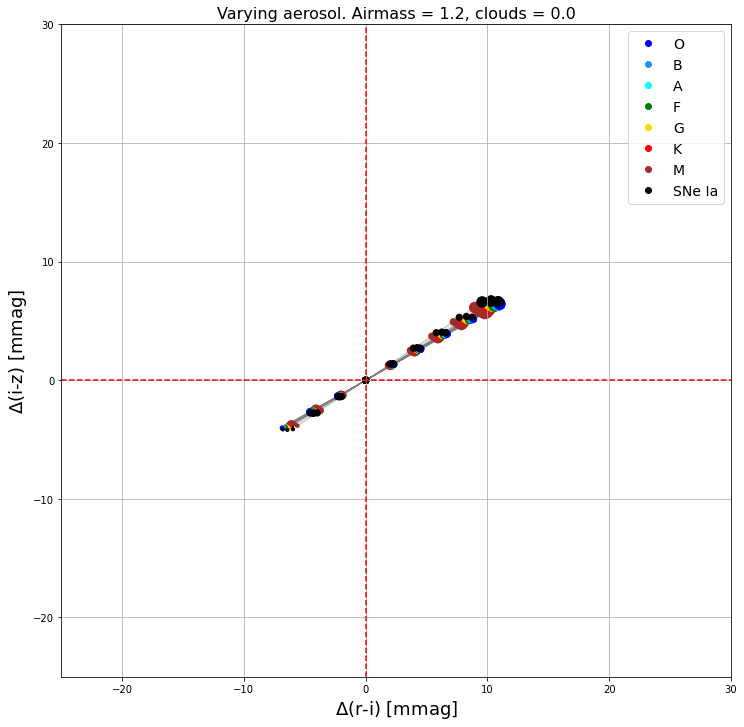

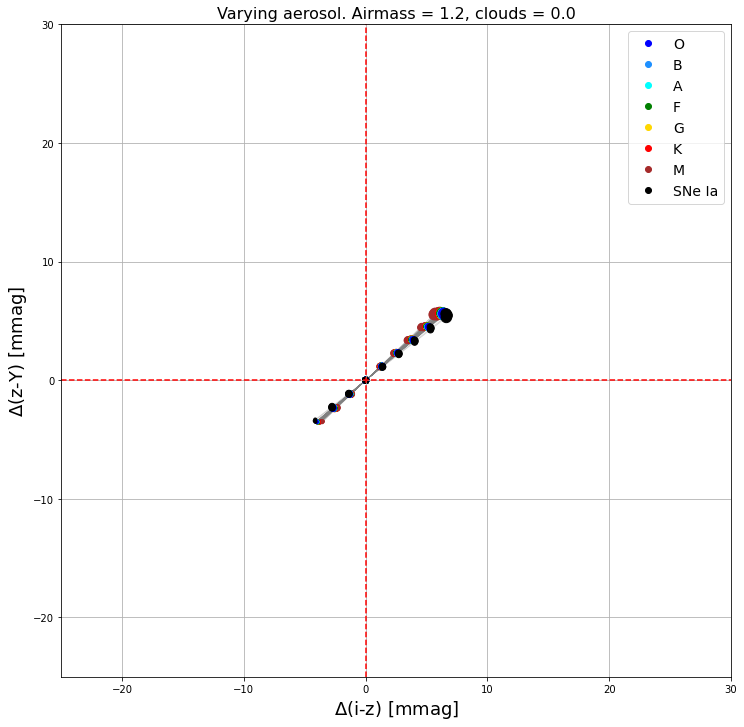

In [163]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(12,12))
    if i<len(filters)-2:
        cx = '{0}-{1}'.format(filters[i],filters[i+1])
        cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangex2)
        axs.set_ylim(rangey2)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn.png'.format(variable_param,am0,cloud0,cx,cy)))

This is just the same but interchanging the axes 

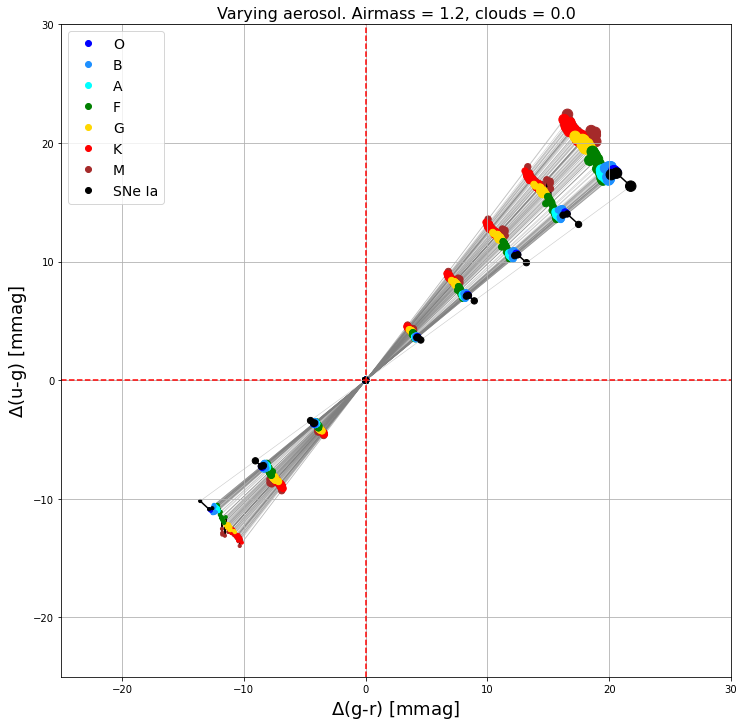

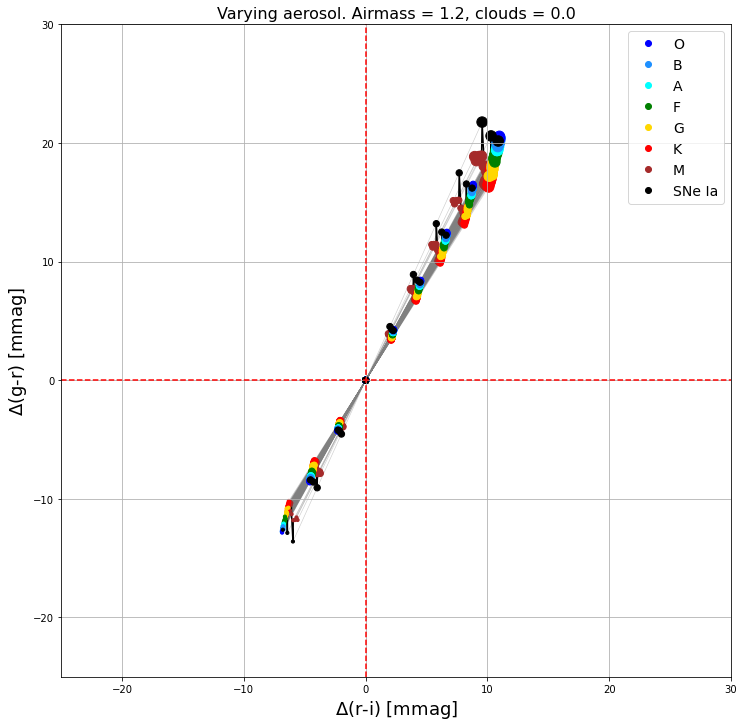

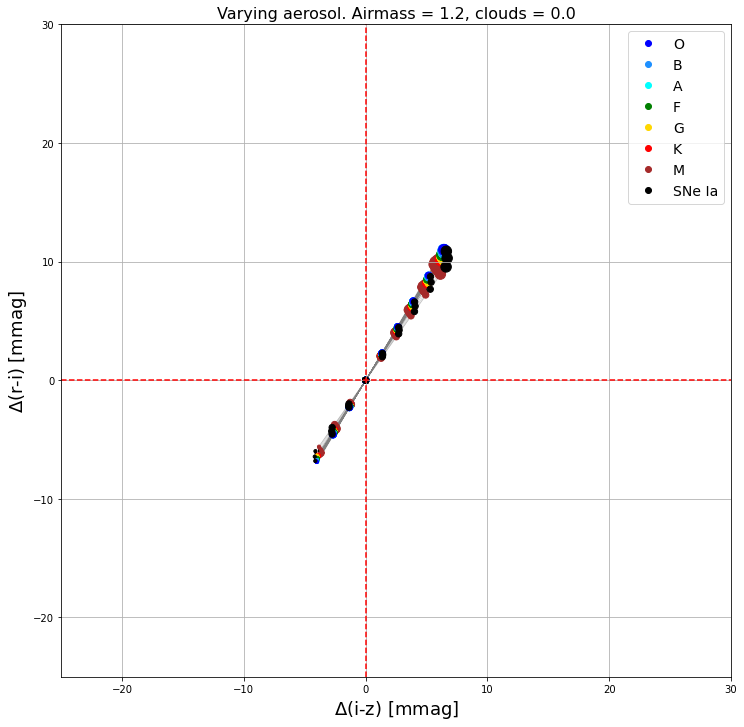

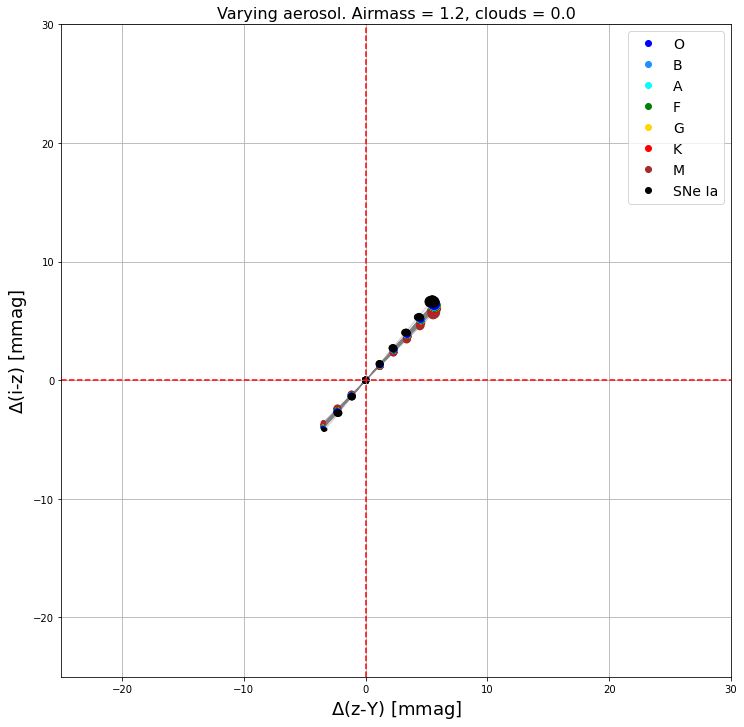

In [164]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(12,12))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn.png'.format(variable_param,am0,cloud0,cx,cy)))

Now we add the evolution of the flat spectrum, for reference 

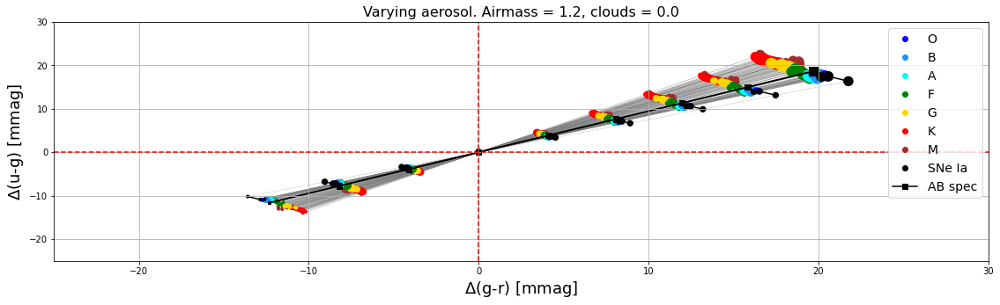

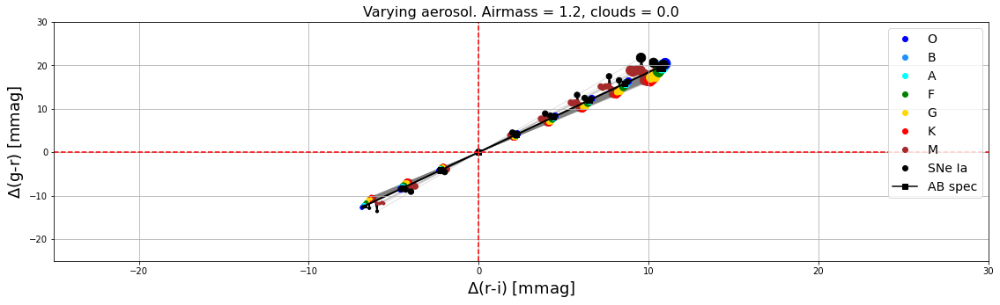

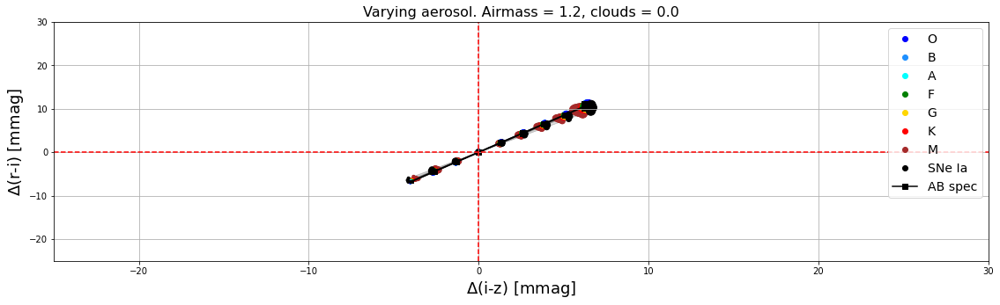

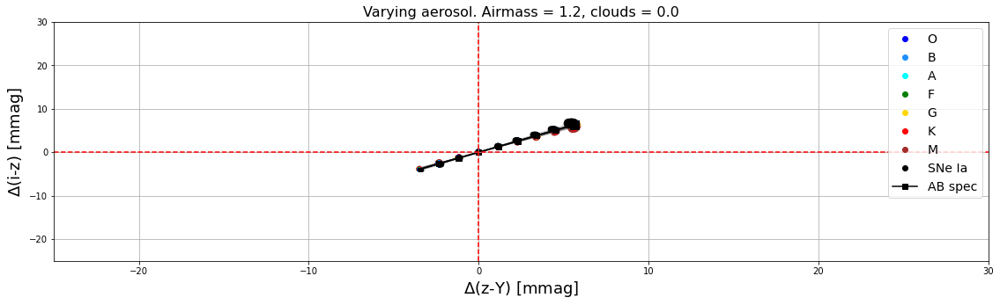

In [165]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(19,5))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])#################
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])#################
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1)
                iso_vals2.append(delta2)
                    
                axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        for spec_type in spectral_types:
            axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            
        for sn in sn_colour_dict.keys():
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        delta1_flat = (flat_colour_dict[cx.lower()]-flat_colour_dict_ref[cx.lower()])*1000.
        delta2_flat = (flat_colour_dict[cy.lower()]-flat_colour_dict_ref[cy.lower()])*1000.
        axs.scatter(delta1_flat,delta2_flat,c='k',marker='s',s=msize)
        axs.plot(delta1_flat,delta2_flat,ls='-',linewidth=2.0,marker='',color='k',alpha=1.0,zorder=1)
        axs.plot([],[],c='k',ls='-',marker='s',label='AB spec')
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)#################
        axs.set_ylim(rangex2)#################
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1
    plt.savefig(os.path.join(outdir_plots,'{3}_{4}_plot_varying_{0}_airmass_{1}_clouds_{2}_sn_flat_spectrum.png'.format(variable_param,am0,cloud0,cx,cy)))

# Redshift the SN Ia spectra 

In [166]:
redshifts = np.linspace(0.1,1.0,10)
print(redshifts)

[0.1 0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1. ]


Apply redshift to the spectrum of one of the SN Ia 

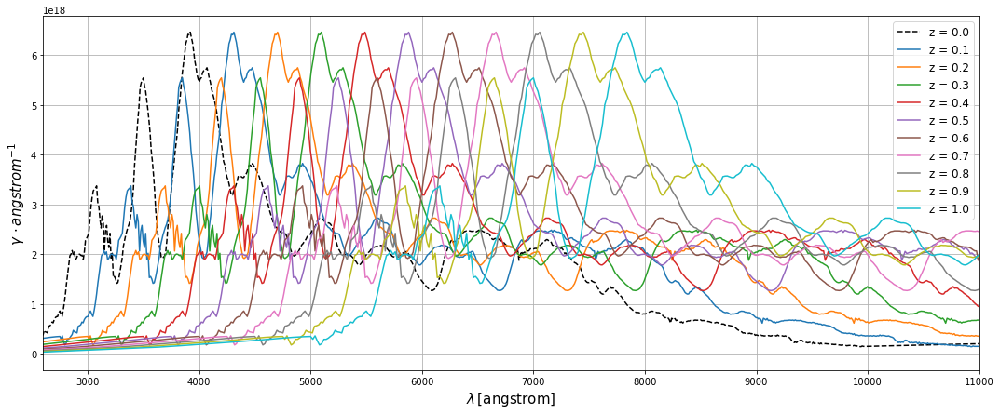

In [167]:
fig=plt.figure(figsize=(18,7))
ax = fig.add_subplot(111)
rs_dict = {}
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='--',color='k',label='z = 0.0')
for redshift in redshifts:
    sn1_z = sn1.redshift(redshift)
    plt.plot(sn1_z.wave,sn1_z.flux*Seff*exptime,label='z = {0:.1f}'.format(redshift))
    rs_dict[round(redshift,1)] = sn1_z
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=12)

Compute fluxes through atm x throughput 

In [168]:
# redshifted SN Ia through atm x throughput 
rs_sn_obs_dict = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in filters:
        filter_dict_[filter] = []
        for i in range(n_sim):
            obs_spec = S.Observation(spec,total_passband[filter][i],force='taper')
            filter_dict_[filter].append(obs_spec)
    rs_sn_obs_dict[key] = filter_dict_ 


((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used i

In [169]:
# redshifted SN Ia only through throughput (as if telescope was in space) 
rs_sn_obs_dict_t = {}
for key in rs_dict.keys():
    spec = rs_dict[key]
    filter_dict_ = {}
    for filter in lsst_bp:
        obs_spec_t = S.Observation(spec,filter,force='taper')
        filter_dict_[filter.name] = obs_spec_t
    rs_sn_obs_dict_t[key] = filter_dict_ 
    

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
(i) does not have a defined binset in

Text(0.5, 1.0, 'Varying aerosol. Airmass = 1.2, clouds = 0.0')

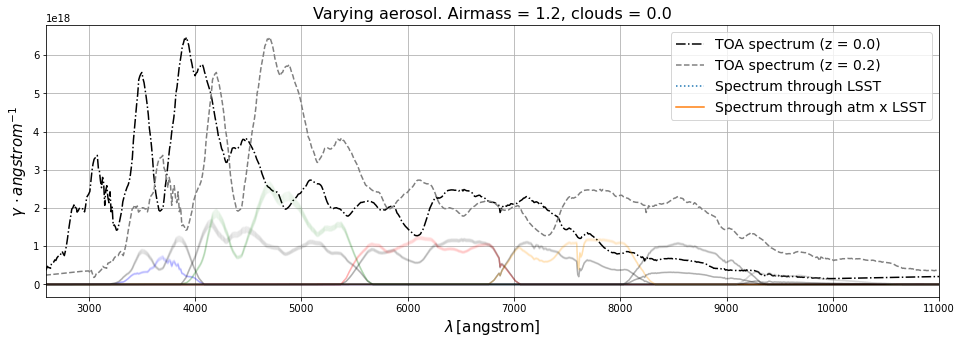

In [170]:
test_rs = 0.2
fig=plt.figure(figsize=(16,5))
ax = fig.add_subplot(111)
plt.plot(sn1.wave,sn1.flux*Seff*exptime,ls='-.',color='k',label='TOA spectrum (z = 0.0)')
plt.plot(rs_dict[test_rs].wave,rs_dict[test_rs].flux*Seff*exptime,ls='--',color='grey',label='TOA spectrum (z = {0})'.format(test_rs))

for index,filter in enumerate(filters):
    #plt.plot(sn_obs_dict_t[0][filter].wave,sn_obs_dict_t[0][filter].flux*Seff*exptime,ls=':',color='k')
    #plt.plot(rs_sn_obs_dict_t[test_rs][filter].wave,rs_sn_obs_dict_t[test_rs][filter].flux*Seff*exptime,ls=':',color=filter_colors[index])
    
    for i in range(n_sim):
        obs_0 = sn_obs_dict[0][filter][i]
        obs_ = rs_sn_obs_dict[test_rs][filter][i]
        plt.plot(obs_0.wave,obs_0.flux*Seff*exptime,ls='-',color='k',alpha=0.04)
        plt.plot(obs_.wave,obs_.flux*Seff*exptime,ls='-',color=filter_colors[index],alpha=0.04)
    
plt.plot([],[],ls=':',label='Spectrum through LSST')
plt.plot([],[],ls='-',label='Spectrum through atm x LSST')
plt.xlim(2600.,11000.)
plt.grid()
plt.xlabel('$\\lambda \, [$'+str(obs.waveunits)+']',fontsize=15)
plt.ylabel('$\gamma \, \cdot angstrom^{-1}$',fontsize=15)
plt.legend(fontsize=14)
plt.title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)

Now we calculate the magnitudes and colours 

In [171]:
# Magnitudes of spectra passing through atm x throughput 
rs_sn_mag_dict = {}
rs_sn_mag_dict_ref = {}
for key in rs_dict.keys():
    obs_spec_ = rs_dict[key]
    mag_dict_ = {}
    mag_dict_ref_ = {}
    for fi,filter in enumerate(filters):
        mag_dict_[filter] = []
        for i in range(n_sim):
            #mag_dict_[filter].append(obs_spec_[filter][i].effstim("abmag"))
            mag_ab_ = myAB(obs_spec_,total_passband[filter][i],lsst_bp[fi])
            mag_dict_[filter].append(mag_ab_)
            
        #mag_dict[sed_] = mag_dict_
        
        mag_ab_ = myAB(obs_spec_,total_passband_ref[filter],lsst_bp[fi])
        mag_dict_ref_[filter] = mag_ab_
    rs_sn_mag_dict[key] = mag_dict_
    rs_sn_mag_dict_ref[key] = mag_dict_ref_

ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.07e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.300001736390904
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.01e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -20.282438018212503
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Ob

((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.26e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.774787438216563
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.32e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.156183770377645
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.31e

Numerator = 1.32e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -19.76169147049666
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.84e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.907624773523
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.79e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.

Numerator = 1.37e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.865739641282637
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.43e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.915288962850003
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.23e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

((u * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.92e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.48147150309026
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.89e+20
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -19.46412907764043
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.86e+2

Numerator = 1.12e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.977157932117933
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.11e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -20.9696208601189
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Denominator = 1.65e+12
AB magnitude =  -21.007199124808707
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.27e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 1.65e+12
AB magnitude =  -21.03443079976941
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 8.04e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -18.539436345283836
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 2)) does not have a defined binset in the

Numerator = 1.32e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.15421713287693
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.31e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.14667030010215
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 3)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.30e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 4.07e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.80002217762291
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 4.01e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.78240296171348
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.94e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 1.37e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.192717431280027
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.36e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.1850033671834
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.35e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 3.39e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.601690742858082
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.34e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.584313971134804
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.28e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.38425612381444
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.62e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.37638014108078
---------
ATTENTION: converting flux units to fnu
((i * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.68e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude

(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.419349152662107
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.82e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitude =  -17.401982859640984
---------
ATTENTION: converting flux units to fnu
((u * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 2.78e+19
(u) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.09e+12
AB magnitu

Numerator = 2.10e+21
(i) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 4.55e+12
AB magnitude =  -21.65946028491643
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.38459362927342
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.10e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 6.19e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.692427070147186
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 4)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.12e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.67985209903032
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.05e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.20e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.471925268731553
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.19e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.465485604473855
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.18e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

Numerator = 3.63e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.11295697560719
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 5)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.59e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -19.1002693106179
---------
ATTENTION: converting flux units to fnu
((g * Atm. transp. 6)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 3.55e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8

Numerator = 1.45e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.6786501216678
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 7)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.44e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.672018283999726
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 8)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.43e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 

Numerator = 2.13e+20
(g) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 8.22e+12
AB magnitude =  -18.534104923766407
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.52e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 6.16e+12
AB magnitude =  -20.98352091706611
---------
ATTENTION: converting flux units to fnu
((r * Atm. transp. 2)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.51e+21
(r) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator =

Numerator = 1.78e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.901652022713847
---------
ATTENTION: converting flux units to fnu
((z * Atm. transp. 9)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 1.83e+21
(z) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator = 3.08e+12
AB magnitude =  -21.934209859955402
---------
ATTENTION: converting flux units to fnu
((Y * Atm. transp. 1)) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
Observation units =  fnu
Numerator = 6.51e+20
(Y) does not have a defined binset in the wavecat table. The waveset of the spectrum will be used instead.
AB observation units =  fnu
Denominator 

In [172]:
rs_sn_colour_dict = {}
for rs in rs_sn_mag_dict.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict[rs] = c_dict

rs_sn_colour_dict_ref = {}
for rs in rs_sn_mag_dict_ref.keys():
    c_dict = {}
    for fi in range(len(filters)-1):
        mag1 = np.array(rs_sn_mag_dict_ref[rs][filters[fi]])
        mag2 = np.array(rs_sn_mag_dict_ref[rs][filters[fi+1]])
        #print(mag1)
        #print(mag2)
        
        colour_ = mag1-mag2
        colour_name = '{0}-{1}'.format(filters[fi].lower(),filters[fi+1].lower())
        c_dict[colour_name] = colour_
    rs_sn_colour_dict_ref[rs] = c_dict
    

In [173]:
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict)
np.save('output_files/rs_sn_colour_dict_varying_{0}_airmass_{1}_cloud_{2}_ref.npy'.format(variable_param,am0,cloud0),rs_sn_colour_dict_ref)

In [174]:
redshift_colors = {0.1:'b',0.2:'dodgerblue',0.3:'cyan',0.4:'g',0.5:'gold',0.6:'r',0.7:'brown',0.8:'grey',0.9:'darkgrey',1.0:'k'}

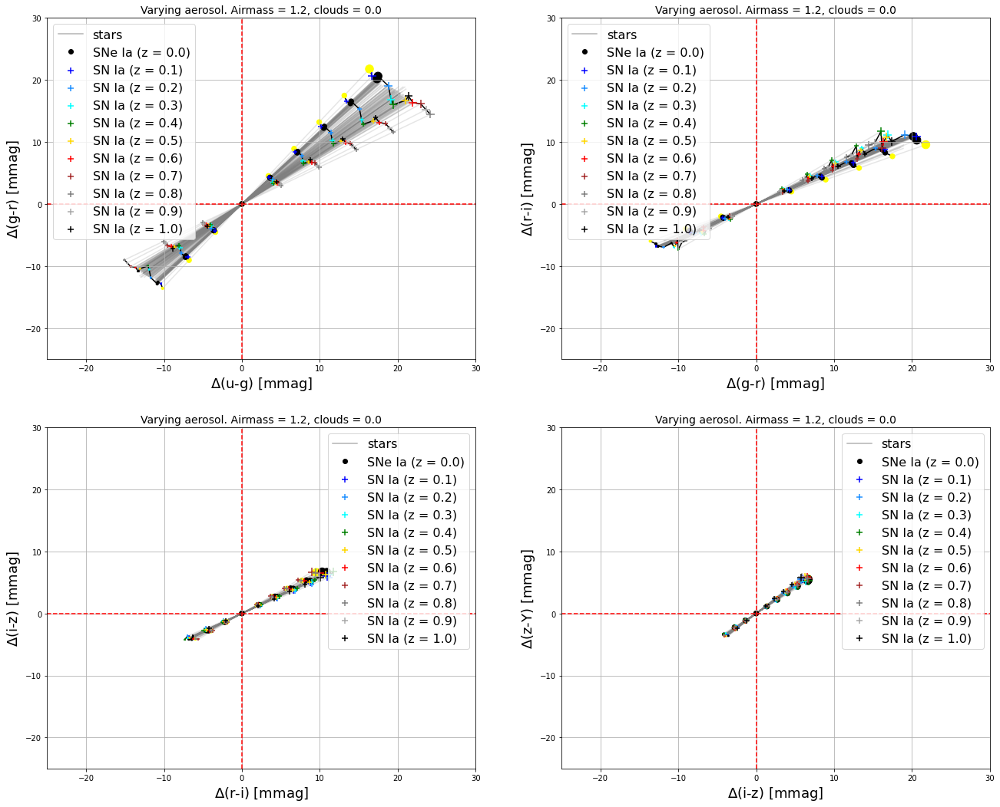

In [175]:
fig_rows = 2
fig_cols = 2
fig, axs = plt.subplots(fig_rows, fig_cols, figsize=(22,18))
i = 0
for row in range(fig_rows):
    for col in range(fig_cols):
        if i<len(filters)-2:
            cx = '{0}-{1}'.format(filters[i],filters[i+1])
            cy = '{0}-{1}'.format(filters[i+1],filters[i+2])
            
            iso_vals1 = []
            iso_vals2 = []
            
            for spec_type in spectral_types[::-1]:
                for si in colour_dict[spec_type]:
                    delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                    delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                    msize = [10.]
                    msize = msize+[40.]*(len(delta1)-2)
                    msize.append(110.)
                    
                    #iso_vals1.append(delta1)
                    #iso_vals2.append(delta2)
                    
                    #axs[row,col].scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0)
                    axs[row,col].plot(delta1,delta2,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
                    
            #for spec_type in spectral_types:
            #    axs[row,col].plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
            axs[row,col].plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
                    
            for si,sn in enumerate(sn_colour_dict.keys()):
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                if si==0:
                    axs[row,col].scatter(delta1_sn,delta2_sn,c='yellow',marker='o',s=msize)
                else:
                    axs[row,col].scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs[row,col].plot(delta1_sn,delta2_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            axs[row,col].plot([],[],c='k',ls='',marker='o',label='SNe Ia (z = 0.0)')
            
            for rs in rs_sn_colour_dict.keys():
                delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
                delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_rs_sn)
                iso_vals2.append(delta2_rs_sn)
                
                axs[row,col].scatter(delta1_rs_sn,delta2_rs_sn,c=redshift_colors[rs],marker='+',s=msize,label='SN Ia (z = {0})'.format(rs))
                axs[row,col].plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
            
            
            iso_vals1 = np.array(iso_vals1)
            iso_vals2 = np.array(iso_vals2)
            for val in range(iso_vals1.shape[1]):
                #print(iso_vals1[:,val])
                sort_index = np.argsort(iso_vals1[:,val])
                axs[row,col].plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
            axs[row,col].axhline(y=0.,ls='--',color='r')
            axs[row,col].axvline(x=0.,ls='--',color='r')
            axs[row,col].grid()
            #axs[row,col].set_xticks(fontsize=20)
            #axs[row,col].set_yticks(fontsize=20)
            #axs[row,col].set_xlim(-21.,33.)
            axs[row,col].set_xlim(-25,30)
            axs[row,col].set_ylim(-25,30)
            
            axs[row,col].set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
            axs[row,col].set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
            axs[row,col].set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=14)
            axs[row,col].legend(fontsize=16)
            
            i += 1

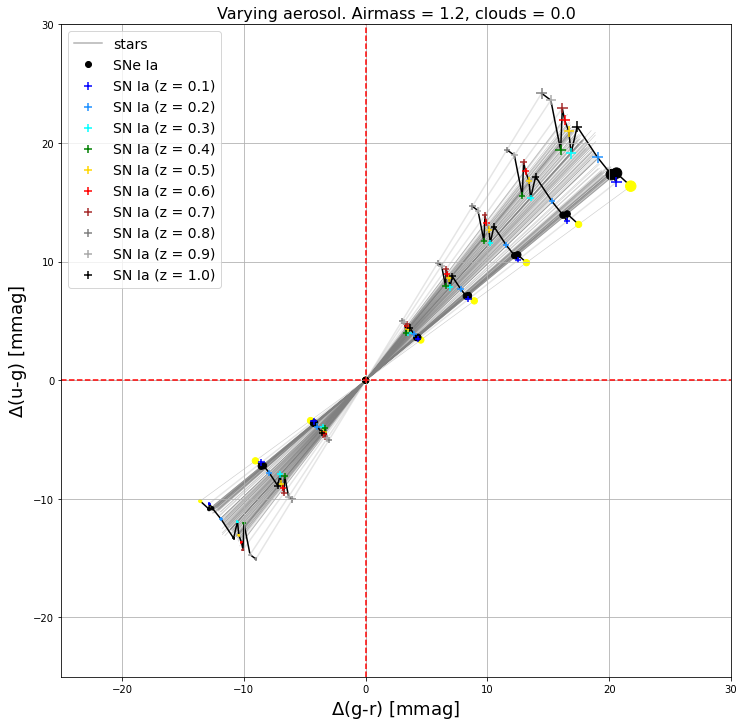

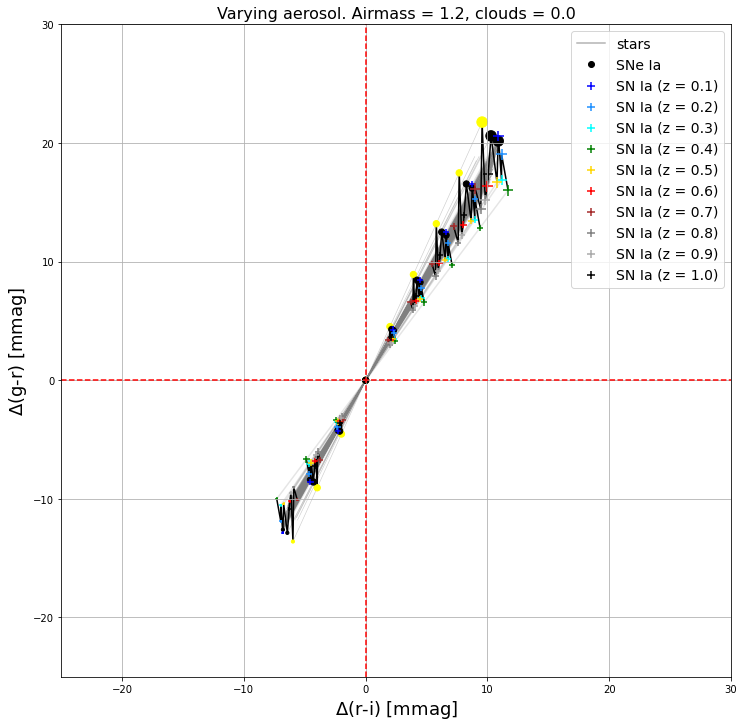

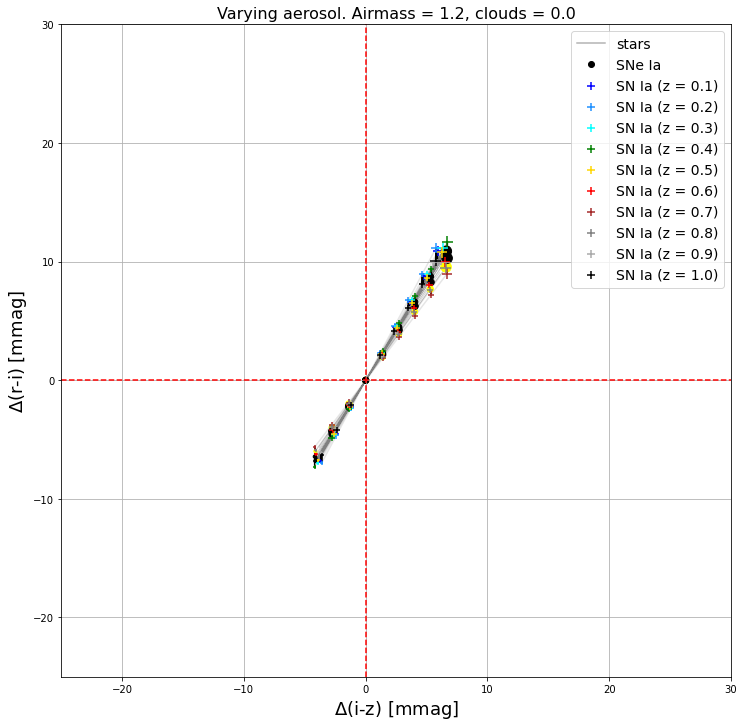

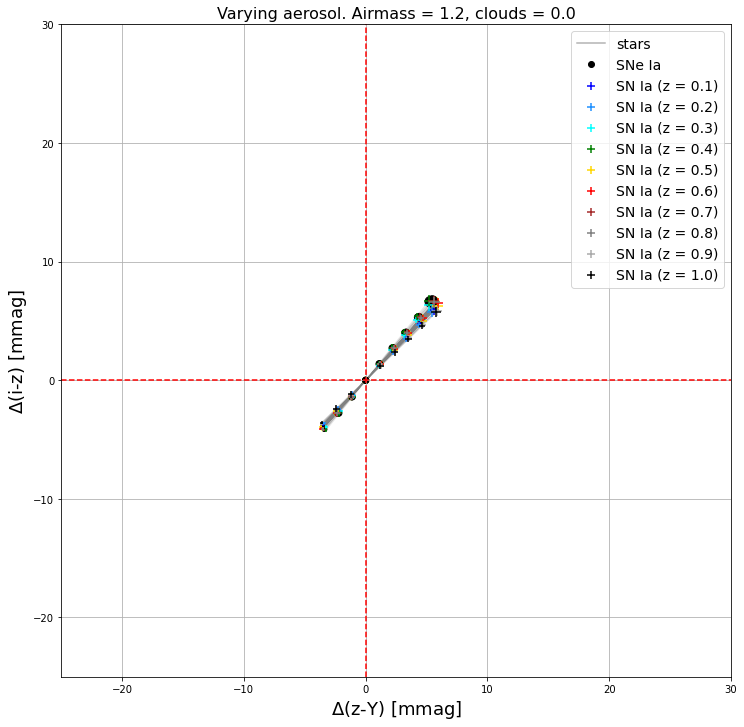

In [176]:
fig_rows = len(filters)-2
i = 0
for row in range(fig_rows):
    fig, axs = plt.subplots(1, 1, figsize=(12,12))
    if i<len(filters)-2:
        cy = '{0}-{1}'.format(filters[i],filters[i+1])
        cx = '{0}-{1}'.format(filters[i+1],filters[i+2])
        
        iso_vals1 = []
        iso_vals2 = []
        for spec_type in spectral_types[::-1]:
            for si in colour_dict[spec_type]:
                delta1 = (colour_dict[spec_type][si][cx.lower()]-colour_dict_ref[spec_type][si][cx.lower()])*1000.
                delta2 = (colour_dict[spec_type][si][cy.lower()]-colour_dict_ref[spec_type][si][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                #iso_vals1.append(delta1)
                #iso_vals2.append(delta2)
                    
                #axs.scatter(delta1,delta2,c=type_colors[spec_type],marker='o',s=msize,alpha=1.0,zorder=1)
                axs.plot(delta1,delta2,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
                
        #for spec_type in spectral_types:
        #    axs.plot([],[],c=type_colors[spec_type],ls='',marker='o',label=spec_type)
        axs.plot([],[],c='grey',ls='-',marker='',alpha=0.6,label='stars')
            
        for si,sn in enumerate(sn_colour_dict.keys()):
                delta1_sn = (sn_colour_dict[sn][cx.lower()]-sn_colour_dict_ref[sn][cx.lower()])*1000.
                delta2_sn = (sn_colour_dict[sn][cy.lower()]-sn_colour_dict_ref[sn][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_sn)
                iso_vals2.append(delta2_sn)
                
                if si==0:
                    axs.scatter(delta1_sn,delta2_sn,c='yellow',marker='o',s=msize)
                else:
                    axs.scatter(delta1_sn,delta2_sn,c='k',marker='o',s=msize)
                axs.plot(delta1_sn,delta2_sn,ls='-',linewidth=0.6,marker='',color='grey',alpha=0.4,zorder=-1)
        axs.plot([],[],c='k',ls='',marker='o',label='SNe Ia')    
        
        for rs in rs_sn_colour_dict.keys():
                delta1_rs_sn = (rs_sn_colour_dict[rs][cx.lower()]-rs_sn_colour_dict_ref[rs][cx.lower()])*1000.
                delta2_rs_sn = (rs_sn_colour_dict[rs][cy.lower()]-rs_sn_colour_dict_ref[rs][cy.lower()])*1000.
                msize = [10.]
                msize = msize+[40.]*(len(delta1)-2)
                msize.append(110.)
                
                iso_vals1.append(delta1_rs_sn)
                iso_vals2.append(delta2_rs_sn)
                
                axs.scatter(delta1_rs_sn,delta2_rs_sn,c=redshift_colors[rs],marker='+',s=msize,label='SN Ia (z = {0})'.format(rs))
                axs.plot(delta1_rs_sn,delta2_rs_sn,ls='-',marker='',color='grey',alpha=0.2,zorder=-1)
        
        
        iso_vals1 = np.array(iso_vals1)
        iso_vals2 = np.array(iso_vals2)
        for val in range(iso_vals1.shape[1]):
            #print(iso_vals1[:,val])
            sort_index = np.argsort(iso_vals1[:,val])
            axs.plot(iso_vals1[:,val][sort_index],iso_vals2[:,val][sort_index],ls='-',marker='',color='k',zorder=-1)
            
        axs.axhline(y=0.,ls='--',color='r')
        axs.axvline(x=0.,ls='--',color='r')
        axs.grid()
        #axs.set_xticks(fontsize=20)
        #axs.set_yticks(fontsize=20)
        axs.set_xlim(rangey2)
        axs.set_ylim(rangex2)
        
        axs.set_xlabel(r'$\Delta$'+'('+cx+') [mmag]',fontsize=18)
        axs.set_ylabel(r'$\Delta$'+'('+cy+') [mmag]',fontsize=18)
        axs.set_title('Varying {0}. Airmass = {1}, clouds = {2}'.format(variable_param,am0,cloud0),fontsize=16)
        axs.legend(fontsize=14)
        i += 1